<a id='imports'></a>
# Imports

In [105]:
import datetime
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import sys
import seaborn as sns
sns.set_theme()

import postprocessing_util
import postprocessing_plot_util
import simulation_config_utils

module_path = os.path.abspath(os.path.join('..', 'utils'))
if module_path not in sys.path:
    sys.path.append(module_path)

import aimsun_config_utils
import aimsun_folder_utils
import aimsun_input_utils
import metadata_settings

In [106]:
# Get time intervals of study.
TIME_INTERVALS = metadata_settings.get_time_intervals()
TIME_INTERVALS_STRING = [str(time)[:-3] for time in TIME_INTERVALS]

# RERUN THE FOLLOWING CELLS EVERY TIME

In [107]:
fully_uncoordinated_desc = "Uncoordinated"
fully_uncoordinated_path = "C:/Users/prest/Dropbox/Fremont project/Aimsun/Outputs/Microsimulations/Databases/preston_220914/uncoordinated.sqlite"

fully_coordinated_desc = "Coordinated"
fully_coordinated_path = "C:/Users/prest/Dropbox/Fremont project/Aimsun/Outputs/Microsimulations/Databases/preston_220914/coordinated.sqlite"

mostly_coordinated_desc = "Mostly Coordinated"
mostly_coordinated_path = "C:/Users/prest/Dropbox/Fremont project/Aimsun/Outputs/Microsimulations/Databases/preston_220919/mission3uncoordinated.sqlite"

attempted_improved_desc = "Attempted Improved Coordination"
attempted_improved_path = "C:/Users/prest/Dropbox/Fremont project/Aimsun/Outputs/Microsimulations/Databases/preston_220921/coordinated3improved.sqlite"

### Set which databases to use

In [108]:
uncoordinated_description = fully_uncoordinated_desc
uncoordinated_simulation_database_path = fully_uncoordinated_path
uncoordinated_simulation_results_database = postprocessing_util.AimsunMicroOutputDatabase(uncoordinated_simulation_database_path)
uncoordinated_con = uncoordinated_simulation_results_database.database

coordinated_description = fully_coordinated_desc
coordinated_simulation_database_path = fully_coordinated_path
coordinated_simulation_results_database = postprocessing_util.AimsunMicroOutputDatabase(coordinated_simulation_database_path)
coordinated_con = coordinated_simulation_results_database.database

In [109]:
from datetime import datetime
today = datetime.now().strftime("%Y-%m-%d")
image_path = f'C:/Users/prest/Preston/Berkeley/fremont_project/images/{today}/{uncoordinated_description} vs {coordinated_description}'

if not os.path.exists(image_path):
    os.makedirs(image_path)

In [110]:
with open(image_path + '/description.txt', 'w') as f:
    f.write(f'''
    {uncoordinated_description} data from: 
        {uncoordinated_simulation_database_path}
    {coordinated_description} data from: 
        {coordinated_simulation_database_path}
    ''')

In [111]:
class Column:
    def __init__(self, name, desc, unit):
        self.name = name
        self.desc = desc
        self.unit = unit

    def __repr__(self) -> str:
        return f'Column({str(self.name)}, {str(self.desc)}, {str(self.unit)})'

### Test runs + more setup

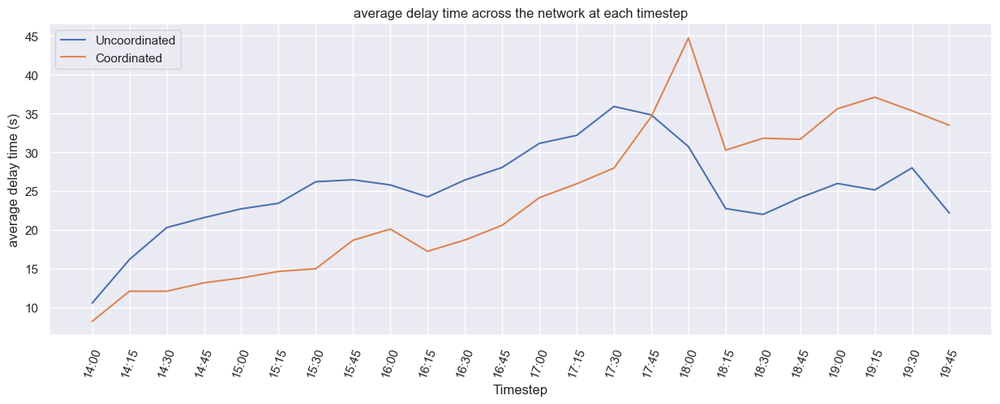

In [112]:
# Select metric to compute.
# Here it is an example of delay time.
metric_name, metric_units = 'average delay time', 's'
uncoordinated_simulated_metric_values = postprocessing_plot_util.process_network_delay_time_data(
    uncoordinated_simulation_results_database, TIME_INTERVALS)

coordinated_simulated_metric_values = postprocessing_plot_util.process_network_delay_time_data(
    coordinated_simulation_results_database, TIME_INTERVALS)

fig = plt.figure(figsize=(15, 5))
plt.title(f"{metric_name} across the network at each timestep")
plt.xlabel("Timestep")
plt.ylabel(f"{metric_name} ({metric_units})")
plt.plot(TIME_INTERVALS_STRING, uncoordinated_simulated_metric_values, label=uncoordinated_description)
plt.plot(TIME_INTERVALS_STRING, coordinated_simulated_metric_values, label=coordinated_description)
plt.legend(loc="upper left")
plt.xticks(rotation=70)
plt.show()

In [113]:
import geopandas as gpd

sections = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection copy/Data/Manually made/Network/Map/Aimsun/sections.shp')
nodes = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection copy/Data/Manually made/Network/Map/Aimsun/nodes.shp')
taz_int = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection/Data/Auxiliary/Demand/TAZ_old/Internal/Internal_TAZ.shp')
centroids = gpd.read_file('C:/Users/prest/Dropbox/Fremont project/Data collection copy/Data/Manually made/Network/Map/Aimsun/centroids.shp')

sections, nodes, taz_int, centroids = map(lambda x:x.to_crs('EPSG:3857'), [sections, nodes, taz_int, centroids])

sections

,id,eid,name,nb_lanes,speed,capacity,rd_type,func_class,fnode,tnode,geometry
0,242.0,242,None,1,104.0,2100.0,175.0,1,9845.0,9923.0,"LINESTRING (-13572344.019 4508460.315, -135723..."
1,243.0,243,None,4,104.0,8400.0,175.0,1,151597118.0,9848.0,"LINESTRING (-13572329.348 4508264.159, -135722..."
2,244.0,244,None,4,104.0,8400.0,175.0,1,9850.0,9852.0,"LINESTRING (-13572464.084 4508415.329, -135724..."
3,246.0,246,Geyser Court,1,40.0,600.0,179.0,5,9868.0,NaN,"LINESTRING (-13571458.486 4509669.510, -135714..."
4,247.0,247,Geyser Court,1,40.0,600.0,179.0,5,NaN,9868.0,"LINESTRING (-13571596.214 4509623.139, -135715..."
...,...,...,...,...,...,...,...,...,...,...,...
4428,151597396.0,28550,Fernald Common,1,40.0,600.0,179.0,5,42395.0,NaN,"LINESTRING (-13572473.917 4507663.732, -135724..."
4429,151600599.0,28581,Alice Court,1,40.0,600.0,179.0,5,39784.0,NaN,"LINESTRING (-13575454.502 4513910.059, -135754..."
4430,151616088.0,3425,None,2,104.0,2100.0,175.0,1,56586.0,151616089.0,"LINESTRING (-13574102.042 4511052.704, -135741..."
4431,151616494.0,56150,None,2,72.0,1800.0,177.0,3,56168.0,151616495.0,"LINESTRING (-13574438.360 4511038.633, -135744..."


In [114]:
nodes

,id,eid,name,nodetype,geometry
0,9845.0,9845,None,0.0,POINT (-13572349.670 4508461.025)
1,9848.0,9848,None,0.0,POINT (-13572263.070 4508190.059)
2,9850.0,9850,None,0.0,POINT (-13572465.454 4508416.802)
3,9852.0,9852,None,0.0,POINT (-13572419.374 4508365.715)
4,9854.0,9854,None,0.0,POINT (-13573710.462 4509848.237)
...,...,...,...,...,...
1493,151632543.0,None,None,0.0,POINT (-13572777.952 4508000.630)
1494,151632545.0,None,None,1.0,POINT (-13575018.842 4514942.158)
1495,151632565.0,None,None,1.0,POINT (-13571911.812 4508088.800)
1496,151632572.0,None,None,1.0,POINT (-13572676.222 4509954.728)


In [115]:
taz_int

,label,CentroidID,geometry
0,1,int_1,"POLYGON ((-13574693.310 4511182.575, -13574685..."
1,2,int_2,"POLYGON ((-13575263.903 4515899.194, -13575241..."
2,3,int_3,"POLYGON ((-13571924.319 4514045.983, -13571924..."
3,4,int_4,"POLYGON ((-13574417.875 4514354.829, -13574417..."
4,5,int_5,"POLYGON ((-13572503.180 4509723.099, -13572503..."
...,...,...,...
67,79,int_79,"POLYGON ((-13574195.236 4515000.626, -13574195..."
68,81,int_81,"POLYGON ((-13574640.402 4510873.822, -13574640..."
69,82,int_82,"POLYGON ((-13571701.680 4509695.175, -13571701..."
70,84,int_84,"POLYGON ((-13572547.708 4513709.071, -13572569..."


In [116]:
centroids

,id,eid,name,type,percentage,geometry
0,151630699.0,int_0,int_0,from_to,nothing,POINT (-13573642.679 4512924.678)
1,151630724.0,int_1,int_1,from_to,nothing,POINT (-13575676.027 4515411.360)
2,151630733.0,int_2,int_2,from_to,nothing,POINT (-13571804.021 4510567.669)
3,151630752.0,int_3,int_3,from_to,nothing,POINT (-13571083.898 4513667.978)
4,151630839.0,int_4,int_4,from_to,nothing,POINT (-13574729.704 4513825.353)
...,...,...,...,...,...,...
81,151632055.0,ext_6,ext_6,from_to,nothing,POINT (-13575185.233 4510750.740)
82,151632058.0,ext_7,ext_7,from_to,nothing,POINT (-13576142.758 4514816.830)
83,151632061.0,ext_8,ext_8,from_to,nothing,POINT (-13574944.926 4516561.766)
84,151632064.0,ext_9,ext_9,from_to,nothing,POINT (-13571943.471 4516065.038)


In [117]:
signalized_nodes = {
    'city-controlled': {
        '27399': ['Washington Boulevard', 'Paseo Padre Parkway'],
        '27553': ['Paseo Parde Parkway', 'Durham Road'],
        '13225': ['Mission Boulevard', 'Washington Boulevard'],
        '27847': ['Mission Boulevard', 'Anza Street'],
        '27869': ['Mission Boulevard', 'Pine Lane'],
        '27889': ['Mission Boulevard', 'Hunter Lane'],
        '27921': ['Mission Boulevard', 'Cougar Drive'],
        '27938': ['Mission Boulevard', 'South Grimmer Boulevard'],
        '27954': ['Mission Boulevard', 'Stanford Ave'],
        '16827': ['Mission Boulevard', 'Paseo Parde Parkway'],
        '56391': ['Washington Boulevard', 'Osgood Road - Driscoll Road'],
        '56129': ['Washington Boulevard', 'Meredith Drive'],
        '56324': ['Paseo Padre Parkway', 'Gomes Road'],
        '56297': ['Paseo Padre Parkway', 'Driscoll Road'],
        '56270': ['Paseo Padre Parkway', 'Chadbourne Drive'],
        '62356': ['Osgood Road', 'Blacow Road'],
        '56418': ['Auto Mall Parkway', 'Osgood Road'],
        '56471': ['Warm Springs Boulevard - Osgood Road', 'S. Grimmer'],
        '45371': ['Warm Springs Boulevard', 'Mission Ct'],
        '56438': ['Warm Springs Boulevard', 'East Warren Avenue'],
        '62346': ['Osgood Road', 'Walmart Driveway'],
        '53579': ['Warm Springs Boulevard', 'Fulton Place'],
        '38460': ['Warm Springs Boulevard', 'Warm Springs Bart'],
        '45004': ['Warm Springs Boulevard', 'Transit Way'],
        '56244': ['Driscoll Road', 'Amapola Drive'],
        '56484': ['East Warren Avenue', 'Fernald Street']
    },
    'state-controlled': {
        '42160': ['Mission Boulevard', 'Esparito Avenue - Ondina Drive'],
        '56218': ['Mission Boulevard', 'Driscoll Road'],
        '27479': ['Mission Boulevard', 'Palm Ave'],
        '56451': ['Mission Boulevard', 'Warm Springs Boulevard'],
        '62795': ['Mission Boulevard', 'Mohave Drive'],
        '27796': ['Mission Boulevard', 'I-680 Southbound Ramp'],
        '27816': ['Mission Boulevard', 'I-680 Northbound Ramp - Mission Road'],
        '27327': ['Washington Boulevard', 'I-680 Southbound Ramp'],
        '27345': ['Washington Boulevard', 'I-680 Nouthbound Ramp - Luzon Drive'],
        '56173': ['Durham Road', 'I-680 Southbound Ramp'],
        '27711': ['Durham Road', 'I-680 Northbound Ramp'],
    }
}

In [118]:
node_geo_city = nodes[nodes['eid'].isin(signalized_nodes['city-controlled'].keys())]
node_geo_state = nodes[nodes['eid'].isin(signalized_nodes['state-controlled'].keys())]

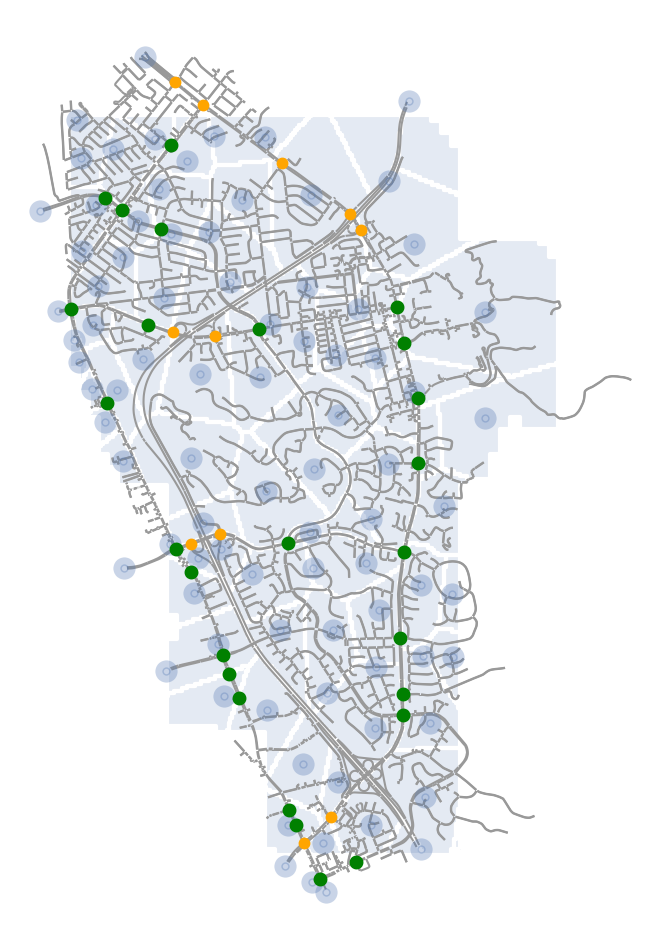

In [119]:
from matplotlib_scalebar.scalebar import ScaleBar
fig, ax = plt.subplots(1, 1, figsize=(10, 12))

# comment the following section to toggle tilemapbase
# import tilemapbase
# tilemapbase.start_logging()
# tilemapbase.init(create=True)
# extent = tilemapbase.extent_from_frame(sections, buffer=25)
# plotter = tilemapbase.Plotter(extent, tilemapbase.tiles.build_OSM(), width=400)
# plotter.plot(ax)

taz_int.plot(ax=ax, alpha=0.15, zorder=1)
taz_int.boundary.plot(ax=ax, lw=3, color='white', zorder=2)
sections.plot(ax=ax, color='0.6', zorder=3)
centroids.plot(ax=ax, lw=10, alpha=0.3, zorder=4)
node_geo_city.plot(ax=ax, lw=4, color='green', zorder=5)
node_geo_state.plot(ax=ax, lw=2.5, color='orange', zorder=5)
ax.axis('off')

plt.savefig('C:/Users/prest/Preston/Berkeley/fremont_project/images/signalized_nodes',
    bbox_inches='tight', pad_inches=0)

plt.show()

In [120]:
print(uncoordinated_description + ' vs ' + coordinated_description)

Uncoordinated vs Coordinated


### RUN ABOVE THIS CELL

In [ ]:
### Run above this cell

<a id='system'></a>
# System Data

In [453]:
import pandas as pd

uncoordinated_sys_query = pd.read_sql('SELECT * FROM MISYS', uncoordinated_con)
uncoordinated_sys_df = pd.DataFrame(uncoordinated_sys_query)

uncoordinated_sys_df.head()

,did,oid,eid,sid,ent,density,density_D,flow,flow_D,input_flow,...,stime,stime_D,nstops,nstops_D,totalNStops,totalNStops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,151642198,None,0,1,1.761359,-1.0,8440.0,-1.0,14052.0,...,5.797138,13.853809,0.0,-1.0,1748.0,-1.0,1114.545137,-1.0,0.0,-1.0
1,151642198,151642198,None,1,1,0.495877,-1.0,2196.0,-1.0,3848.0,...,18.485671,21.170920,0.0,-1.0,1325.0,-1.0,310.807815,-1.0,0.0,-1.0
2,151642198,151642198,None,2,1,1.265483,-1.0,6244.0,-1.0,10204.0,...,1.334611,5.043652,0.0,-1.0,423.0,-1.0,803.737322,-1.0,0.0,-1.0
3,151642198,151642198,None,0,2,2.734878,-1.0,13840.0,-1.0,15464.0,...,8.975247,16.951414,0.0,-1.0,5740.0,-1.0,2070.230032,-1.0,0.0,-1.0
4,151642198,151642198,None,1,2,0.795732,-1.0,3932.0,-1.0,4380.0,...,21.443692,23.666571,0.0,-1.0,3170.0,-1.0,655.277797,-1.0,0.0,-1.0


In [454]:
coordinated_sys_query = pd.read_sql('SELECT * FROM MISYS', coordinated_con)
coordinated_sys_df = pd.DataFrame(coordinated_sys_query)

coordinated_sys_df.head()

,did,oid,eid,sid,ent,density,density_D,flow,flow_D,input_flow,...,stime,stime_D,nstops,nstops_D,totalNStops,totalNStops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,151642198,None,0,1,1.693082,-1.0,8760.0,-1.0,14052.0,...,3.698887,10.111692,0.0,-1.0,1654.0,-1.0,1124.547200,-1.0,0.0,-1.0
1,151642198,151642198,None,1,1,0.433417,-1.0,2480.0,-1.0,3848.0,...,9.809884,16.023965,0.0,-1.0,1214.0,-1.0,319.511805,-1.0,0.0,-1.0
2,151642198,151642198,None,2,1,1.259665,-1.0,6280.0,-1.0,10204.0,...,1.285627,4.556932,0.0,-1.0,440.0,-1.0,805.035396,-1.0,0.0,-1.0
3,151642198,151642198,None,0,2,2.497132,-1.0,14580.0,-1.0,15464.0,...,5.643160,9.710035,0.0,-1.0,5239.0,-1.0,2101.435204,-1.0,0.0,-1.0
4,151642198,151642198,None,1,2,0.668329,-1.0,4092.0,-1.0,4380.0,...,11.871201,12.977442,0.0,-1.0,2689.0,-1.0,604.724585,-1.0,0.0,-1.0


In [455]:
uncoordinated_sys_df.columns

Index(['did', 'oid', 'eid', 'sid', 'ent', 'density', 'density_D', 'flow',
       'flow_D', 'input_flow', 'input_flow_D', 'input_count', 'input_count_D',
       'ttime', 'ttime_D', 'dtime', 'dtime_D', 'wtimeVQ', 'wtimeVQ_D', 'speed',
       'speed_D', 'spdh', 'spdh_D', 'travel', 'travel_D', 'traveltime',
       'traveltime_D', 'vWait', 'vWait_D', 'vIn', 'vIn_D', 'vOut', 'vOut_D',
       'totalDistanceTraveledInside', 'totalDistanceTraveledInside_D',
       'totalTravelTimeInside', 'totalTravelTimeInside_D', 'totalWaitingTime',
       'totalWaitingTime_D', 'vLostIn', 'vLostIn_D', 'vLostOut', 'vLostOut_D',
       'qmean', 'qmean_D', 'qvmean', 'qvmean_D', 'missedTurnings',
       'missedTurnings_D', 'lane_changes', 'lane_changes_D',
       'total_lane_changes', 'total_lane_changes_D', 'stime', 'stime_D',
       'nstops', 'nstops_D', 'totalNStops', 'totalNStops_D', 'fuelc',
       'fuelc_D', 'batteryc', 'batteryc_D'],
      dtype='object')

In [456]:
sys_columns = {
    'sid': Column('sid', 'Vehicle type', None),
    'ent': Column('ent', 'Time interval', None),
    'density': Column('density', 'Density', 'veh/km'),
    'flow': Column('flow', 'Mean flow', 'veh/h'),
    'ttime': Column('ttime', 'Mean travel time', 's/km'),
    'dtime': Column('dtime', 'Mean delay time', 's/km'),
    'speed': Column('speed', 'Mean speed', 'km/h'),
    'qmean': Column('qmean', 'Mean vehicles in queue', 'veh'),
    'fuelc': Column('fuelc', 'Total fuel consumed', 'L'),
    'batteryc': Column('batteryc', 'Total battery consumed', 'kWh'),          # pending simulation run
    'travel': Column('travel', 'Total distance traveled by exited vehicles', 'km')
}

sys_column_names = sys_columns.keys()
group_columns = ['sid', 'ent']

uncoordinated_sys_df = uncoordinated_sys_df[sys_column_names]
coordinated_sys_df = coordinated_sys_df[sys_column_names]

sys_df = uncoordinated_sys_df.merge(coordinated_sys_df, on=group_columns, suffixes=['_uncoordinated', '_coordinated'])
sys_df = sys_df[(sys_df['sid']==0) & (sys_df['ent']!=0)].drop('sid', axis=1)
sys_df

,ent,density_uncoordinated,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,qmean_uncoordinated,fuelc_uncoordinated,batteryc_uncoordinated,travel_uncoordinated,density_coordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,qmean_coordinated,fuelc_coordinated,batteryc_coordinated,travel_coordinated
0,1,1.761359,8440.0,50.096176,10.546274,80.880735,95.280889,1114.545137,0.0,14705.749775,1.693082,8760.0,47.804989,8.187263,82.034641,61.329778,1124.547200,0.0,15065.860076
3,2,2.734878,13840.0,56.672180,16.166451,73.527277,262.134222,2070.230032,0.0,24675.261271,2.497132,14580.0,52.623929,12.078871,75.524855,126.564444,2101.435204,0.0,25809.138932
6,3,2.998710,14896.0,60.903016,20.282287,70.819805,353.136889,2441.055931,0.0,27449.085308,2.516465,15048.0,52.508182,12.073094,75.725359,132.271111,2270.267825,0.0,27525.113238
9,4,3.283599,15280.0,62.791031,21.570878,69.524337,425.574222,2473.084385,0.0,27756.027949,2.684697,15572.0,54.073114,13.158075,74.139911,164.224889,2318.080838,0.0,27816.249670
12,5,3.323521,15348.0,64.293321,22.700916,68.852711,441.211556,2557.055519,0.0,28293.321158,2.668571,15392.0,54.902333,13.785544,73.818979,177.252444,2326.040487,0.0,27835.359376
15,6,3.578332,16212.0,65.464581,23.419646,67.822963,490.344000,2757.601012,0.0,29635.465202,2.851818,16504.0,56.118657,14.627753,72.598204,186.642667,2549.344155,0.0,29282.807012
18,7,3.671238,15784.0,68.438373,26.198510,65.768645,524.604444,2727.771588,0.0,28959.125718,2.907366,15604.0,56.615134,14.979349,71.822943,220.020444,2436.898652,0.0,27829.009468
21,8,3.904245,16728.0,69.034079,26.449397,63.684530,526.380444,2990.854834,0.0,30752.073203,3.214460,16596.0,60.659380,18.655416,67.944723,293.783111,2665.817594,0.0,29468.550812
24,9,3.578512,16304.0,68.296675,25.783571,63.686496,447.694222,2984.282635,0.0,30686.599036,3.065151,15924.0,61.721648,20.091513,67.089618,265.257778,2611.484727,0.0,28842.960261
27,10,3.625641,15272.0,66.581688,24.239680,65.551838,473.907556,2714.874716,0.0,28798.817447,3.039545,16004.0,58.960828,17.226667,69.465972,249.379556,2576.017388,0.0,29122.833853


See [sys-hcm graphs](#patched-syshcm-graphs)

In [457]:
# sys_columns = np.reshape(list(sys_columns.values())[2:], (4, 2))
# sys_columns
# fig, axs = plt.subplots(4, 2, figsize=(20, 25))
# fig.suptitle('System-wide metrics over time')
# print(sys_columns)
# for i in range(4):
#     for j in range(2):
#         ax, metric = axs[i][j], sys_columns[i][j]
#         ax.plot(TIME_INTERVALS_STRING, sys_df[f'{metric.name}_uncoordinated'], label=uncoordinated_description)
#         ax.plot(TIME_INTERVALS_STRING, sys_df[f'{metric.name}_coordinated'], label=coordinated_description)
#         ax.set_title(f'{metric.desc} across the network over time')
#         ax.set_xlabel('Time')
#         ax.set_ylabel(f'{metric.name} ({metric.unit})')
#         ax.legend(loc="upper left")
#         ax.tick_params('x', labelrotation=70) 

# plt.subplots_adjust(wspace=0.3, hspace=0.5)
# plt.show()

<a id='section'></a>
# Section Data

In [291]:
import pandas as pd

uncoordinated_section_query = pd.read_sql('SELECT * FROM MISECT', uncoordinated_con)
uncoordinated_section_df = pd.DataFrame(uncoordinated_section_query)

uncoordinated_section_df.head()

,did,oid,eid,sid,ent,flow,flow_D,count,count_D,input_flow,...,total_lane_changes,total_lane_changes_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,242,242,0,1,1360.0,-1.0,340.0,-1.0,1384.0,...,0.0,-1.0,0.0,0.0,0.0,-1.0,0.0,-1.0,0.0,-1.0
1,151642198,243,243,0,1,1284.0,-1.0,321.0,-1.0,1288.0,...,11.0,-1.0,0.0,0.0,0.0,-1.0,0.0,-1.0,0.0,-1.0
2,151642198,244,244,0,1,1288.0,-1.0,322.0,-1.0,1288.0,...,5.0,-1.0,0.0,0.0,0.0,-1.0,0.0,-1.0,0.0,-1.0
3,151642198,246,246,0,1,0.0,-1.0,0.0,-1.0,0.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
4,151642198,247,247,0,1,8.0,-1.0,2.0,-1.0,8.0,...,0.0,-1.0,0.0,0.0,0.0,-1.0,0.0,-1.0,0.0,-1.0


In [292]:
coordinated_section_query = pd.read_sql('SELECT * FROM MISECT', coordinated_con)
coordinated_section_df = pd.DataFrame(coordinated_section_query)

coordinated_section_df.head()

,did,oid,eid,sid,ent,flow,flow_D,count,count_D,input_flow,...,total_lane_changes,total_lane_changes_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,242,242,0,1,1356.0,-1.0,339.0,-1.0,1372.0,...,0.0,-1.0,0.0,0.0,0.0,-1.0,3.369716,-1.0,0.0,-1.0
1,151642198,243,243,0,1,1256.0,-1.0,314.0,-1.0,1268.0,...,4.0,-1.0,0.0,0.0,0.0,-1.0,1.350335,-1.0,0.0,-1.0
2,151642198,244,244,0,1,1280.0,-1.0,320.0,-1.0,1284.0,...,4.0,-1.0,0.0,0.0,0.0,-1.0,0.955045,-1.0,0.0,-1.0
3,151642198,246,246,0,1,0.0,-1.0,0.0,-1.0,0.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.000000,-1.0,-1.0,-1.0
4,151642198,247,247,0,1,8.0,-1.0,2.0,-1.0,8.0,...,0.0,-1.0,0.0,0.0,0.0,-1.0,0.011503,-1.0,0.0,-1.0


In [293]:
dfs_section = {'uncoordinated': uncoordinated_section_df, 'coordinated': coordinated_section_df}
null_values = {'eid': None, 'ent': None, 'flow': 0, 'ttime': -1, 'dtime': -1, 'speed': -1, 'density': 0}  # 'qmean': None, 
group_cols = ['ent', 'eid']

def preprocess_sections(df):
    df = df.filter(items=null_values.keys()).dropna(axis=0)
    for k, v in null_values.items():
        df = df[df[k]!=v]
    return df.groupby(group_cols).mean()

In [294]:
for k in dfs_section:
    dfs_section[k] = preprocess_sections(dfs_section[k])

dfs_section['uncoordinated']

flow      ttime     dtime      speed   density
ent eid                                                      
0   1006   5.666667  12.359674  0.796747  44.416761  0.127852
    1007   1.000000   8.879309  0.448162  45.150530  0.022228
    1008   5.888889  13.097995  1.095528  43.486947  0.135829
    1009   4.555556   9.082470  0.757039  43.491119  0.104998
    1022  44.666667   8.638621  0.443054  41.457655  1.082721
...             ...        ...       ...        ...       ...
24  990   52.000000   3.593040  0.124007  42.435493  1.227206
    991   36.000000   2.273764  0.147652  41.171904  0.883320
    992   36.000000   1.732550  0.037301  43.130916  0.836643
    993   36.000000   2.462096  0.118674  42.049965  0.860087
    997    8.000000   4.117997  0.090886  41.192197  0.194295

[67427 rows x 5 columns]

In [295]:
dfs_section['coordinated']

flow      ttime     dtime      speed   density
ent eid                                                      
0   1006   7.333333  12.913697  0.746771  42.602214  0.173581
    1007   1.444444   9.455693  0.496097  42.630965  0.034164
    1008   7.333333  13.616747  1.047789  41.919752  0.176515
    1009   5.666667   9.425930  0.703384  41.969505  0.136270
    1017   0.500000  29.516580  0.000000  39.965519  0.012569
...             ...        ...       ...        ...       ...
24  990   48.000000   3.621700  0.126415  42.070982  1.141412
    991   44.000000   2.369269  0.277421  40.009497  1.124960
    992   36.000000   1.732270  0.018679  43.147593  0.836507
    993   36.000000   2.497865  0.129089  41.432309  0.872582
    997   16.000000   4.315968  0.000000  39.409829  0.407270

[67310 rows x 5 columns]

In [296]:
section_df = dfs_section['uncoordinated'].join(dfs_section['coordinated'], 
    on=group_cols, lsuffix='_uncoordinated', rsuffix='_coordinated').dropna()

section_df

flow_uncoordinated  ttime_uncoordinated  dtime_uncoordinated  \
ent eid                                                                  
0   1006            5.666667            12.359674             0.796747   
    1007            1.000000             8.879309             0.448162   
    1008            5.888889            13.097995             1.095528   
    1009            4.555556             9.082470             0.757039   
    1022           44.666667             8.638621             0.443054   
...                      ...                  ...                  ...   
24  990            52.000000             3.593040             0.124007   
    991            36.000000             2.273764             0.147652   
    992            36.000000             1.732550             0.037301   
    993            36.000000             2.462096             0.118674   
    997             8.000000             4.117997             0.090886   

          speed_uncoordinated  density_uncoordinated  flow_coordinated  \
ent eid                                                                  
0   1006            44.416761               0.127852          7.333333   
    1007            45.150530               0.022228          1.444444   
    1008            43.486947               0.135829          7.333333   
    1009            43.491119               0.104998          5.666667   
    1022            41.457655               1.082721         63.777778   
...                       ...                    ...               ...   
24  990             42.435493               1.227206         48.000000   
    991             41.171904               0.883320         44.000000   
    992             43.130916               0.836643         36.000000   
    993             42.049965               0.860087         36.000000   
    997             41.192197               0.194295         16.000000   

          ttime_coordinated  dtime_coordinated  speed_coordinated  \
ent eid                                                             
0   1006          12.913697           0.746771          42.602214   
    1007           9.455693           0.496097          42.630965   
    1008          13.616747           1.047789          41.919752   
    1009           9.425930           0.703384          41.969505   
    1022           8.675036           0.470974          41.275245   
...                     ...                ...                ...   
24  990            3.621700           0.126415          42.070982   
    991            2.369269           0.277421          40.009497   
    992            1.732270           0.018679          43.147593   
    993            2.497865           0.129089          41.432309   
    997            4.315968           0.000000          39.409829   

          density_coordinated  
ent eid                        
0   1006             0.173581  
    1007             0.034164  
    1008             0.176515  
    1009             0.136270  
    1022             1.554697  
...                       ...  
24  990              1.141412  
    991              1.124960  
    992              0.836507  
    993              0.872582  
    997              0.407270  

[62033 rows x 10 columns]

In [299]:
section_cols = {
    'flow': Column('flow', 'Mean flow', 'veh/h'),
    'ttime': Column('ttime', 'Mean travel time', 's'),
    'dtime': Column('dtime', 'Mean delay time', 's'),
    'speed': Column('speed', 'Mean speed', 'km/h'),
    'density': Column('density', 'Density by lane', 'veh/km')
}

In [300]:
section_df = section_df.groupby('eid').mean()
section_df

,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated
eid,,,,,,,,,,
1006,8.368421,12.340435,0.808257,44.486942,0.188504,7.403509,12.603305,0.806222,43.587070,0.171938
1007,3.583333,8.871003,0.436844,45.206147,0.079530,5.027778,9.202761,0.458958,43.727507,0.116992
1008,7.962963,13.058944,1.070261,43.616534,0.184712,7.904762,13.323484,1.050503,42.790368,0.187943
1009,6.555556,9.044283,0.763342,43.671918,0.151484,6.684211,9.217544,0.719530,42.851862,0.157752
1020,4.000000,5.511083,0.873459,33.565408,0.119170,4.000000,5.511083,0.873459,33.565408,0.119170
...,...,...,...,...,...,...,...,...,...,...
992,43.166667,1.787046,0.085914,42.129697,1.034362,41.810000,1.793214,0.091908,42.064008,1.004986
993,43.166667,2.464032,0.113206,42.081262,1.034593,41.810000,2.467179,0.115391,42.060854,1.001721
994,2.250000,2.817352,0.490298,37.168219,0.059557,2.500000,2.812661,0.479089,37.255697,0.068029


In [301]:
for col in section_cols:
    section_df[f'{col}_ratio'] = section_df[f'{col}_coordinated'] / section_df[f'{col}_uncoordinated']

section_df

,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio
eid,,,,,,,,,,,,,,,
1006,8.368421,12.340435,0.808257,44.486942,0.188504,7.403509,12.603305,0.806222,43.587070,0.171938,0.884696,1.021302,0.997483,0.979772,0.912118
1007,3.583333,8.871003,0.436844,45.206147,0.079530,5.027778,9.202761,0.458958,43.727507,0.116992,1.403101,1.037398,1.050622,0.967291,1.471041
1008,7.962963,13.058944,1.070261,43.616534,0.184712,7.904762,13.323484,1.050503,42.790368,0.187943,0.992691,1.020257,0.981539,0.981058,1.017494
1009,6.555556,9.044283,0.763342,43.671918,0.151484,6.684211,9.217544,0.719530,42.851862,0.157752,1.019625,1.019157,0.942605,0.981222,1.041378
1020,4.000000,5.511083,0.873459,33.565408,0.119170,4.000000,5.511083,0.873459,33.565408,0.119170,1.000000,1.000000,1.000000,1.000000,1.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
992,43.166667,1.787046,0.085914,42.129697,1.034362,41.810000,1.793214,0.091908,42.064008,1.004986,0.968571,1.003452,1.069772,0.998441,0.971599
993,43.166667,2.464032,0.113206,42.081262,1.034593,41.810000,2.467179,0.115391,42.060854,1.001721,0.968571,1.001277,1.019306,0.999515,0.968228
994,2.250000,2.817352,0.490298,37.168219,0.059557,2.500000,2.812661,0.479089,37.255697,0.068029,1.111111,0.998335,0.977139,1.002354,1.142254


In [302]:
section_df = section_df.merge(sections[['eid', 'func_class', 'geometry']], left_index=True, right_on='eid').set_index('eid')
section_df = gpd.GeoDataFrame(section_df, geometry='geometry')
frame = section_df.to_crs("EPSG:3857")
frame

,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio,func_class,geometry
eid,,,,,,,,,,,,,,,,,
1006,8.368421,12.340435,0.808257,44.486942,0.188504,7.403509,12.603305,0.806222,43.587070,0.171938,0.884696,1.021302,0.997483,0.979772,0.912118,5,"LINESTRING (-13572729.375 4511855.337, -135727..."
1007,3.583333,8.871003,0.436844,45.206147,0.079530,5.027778,9.202761,0.458958,43.727507,0.116992,1.403101,1.037398,1.050622,0.967291,1.471041,5,"LINESTRING (-13572788.740 4511703.374, -135728..."
1008,7.962963,13.058944,1.070261,43.616534,0.184712,7.904762,13.323484,1.050503,42.790368,0.187943,0.992691,1.020257,0.981539,0.981058,1.017494,5,"LINESTRING (-13572773.768 4511698.341, -135727..."
1009,6.555556,9.044283,0.763342,43.671918,0.151484,6.684211,9.217544,0.719530,42.851862,0.157752,1.019625,1.019157,0.942605,0.981222,1.041378,5,"LINESTRING (-13572921.125 4511676.124, -135728..."
1020,4.000000,5.511083,0.873459,33.565408,0.119170,4.000000,5.511083,0.873459,33.565408,0.119170,1.000000,1.000000,1.000000,1.000000,1.000000,5,"LINESTRING (-13573074.618 4513379.633, -135731..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
990,57.833333,3.630740,0.168911,42.149707,1.386836,47.408889,3.616694,0.152433,42.290265,1.140022,0.819750,0.996131,0.902447,1.003335,0.822031,5,"LINESTRING (-13573596.964 4515066.055, -135735..."
991,40.833333,2.344799,0.227969,40.577686,1.026547,35.004444,2.345357,0.223236,40.633851,0.877525,0.857252,1.000238,0.979239,1.001384,0.854831,5,"LINESTRING (-13573624.595 4515027.159, -135736..."
992,43.166667,1.787046,0.085914,42.129697,1.034362,41.810000,1.793214,0.091908,42.064008,1.004986,0.968571,1.003452,1.069772,0.998441,0.971599,5,"LINESTRING (-13573648.312 4514993.336, -135736..."


In [303]:
frame['log_flow_uncoordinated'] = np.log(frame['flow_uncoordinated'])
frame['log_flow_coordinated'] = np.log(frame['flow_coordinated'])

log_flow = Column('log_flow', 'Logarithm of mean flow', 'veh/h')

In [304]:
frame['log_flow_uncoordinated'].head()

eid
1006    2.124465
1007    1.276293
1008    2.074801
1009    1.880313
1020    1.386294
Name: log_flow_uncoordinated, dtype: float64

In [305]:
frame['log_flow_coordinated'].head()

eid
1006    2.001954
1007    1.614978
1008    2.067465
1009    1.899748
1020    1.386294
Name: log_flow_coordinated, dtype: float64

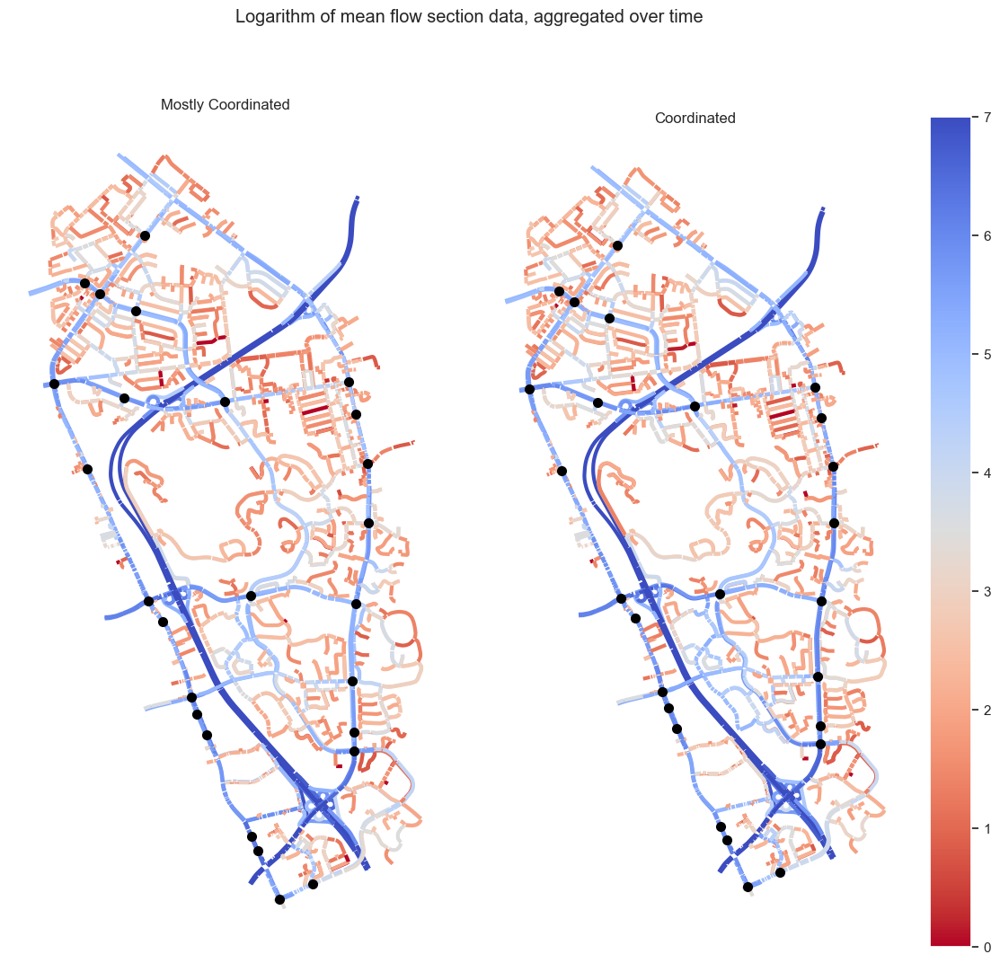

In [318]:
# ax = frame.plot(figsize=(15,15), column=f'{col.name}_ratio', legend=True, cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
# node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
# plt.axis('off')
# plt.title(f'Relative (coordinated/uncoordinated) {col.desc} ratio by section, aggregated over time')
# plt.show()

# fig, axs = plt.subplots(1, 5, figsize=(30, 9))

def section_plot(metric, min_val, max_val):
    fig, axs = plt.subplots(1, 2, figsize=(15, 12))
    fig.suptitle(f'{metric.desc} section data, aggregated over time')
    for i in range(2):
        ax, type = axs[i], ['uncoordinated', 'coordinated'][i]
        frame.plot(ax=ax, column=f'{metric.name}_{type}', legend=(i==1), cmap='coolwarm_r', lw=3, vmin=min_val, vmax=max_val, zorder=0)
        node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
        ax.set_title([uncoordinated_description, coordinated_description][i])
        ax.axis('off')

    plt.subplots_adjust(wspace=0)
    plt.show()

section_plot(log_flow, 0, 7)

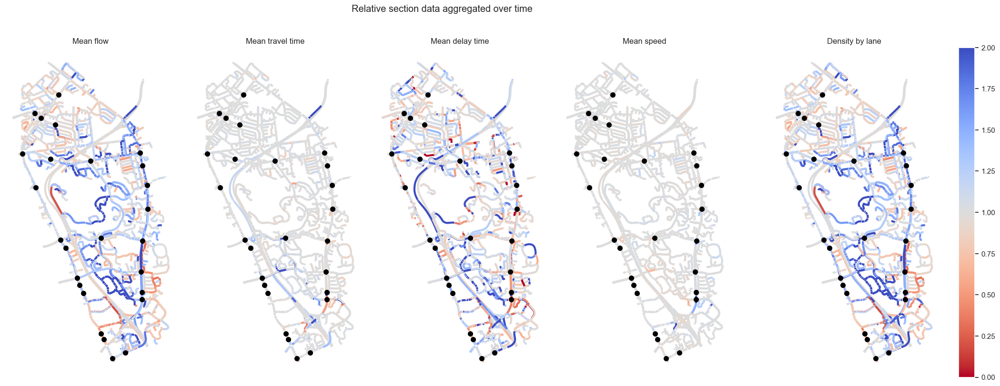

In [319]:
fig, axs = plt.subplots(1, 5, figsize=(30, 9))
fig.suptitle('Relative section data aggregated over time')
for i in range(5):
    ax, metric = axs[i], list(section_cols.values())[i]
    frame.plot(ax=ax, column=f'{metric.name}_ratio', legend=(i==4), cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
    node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
    ax.set_title(metric.desc)
    ax.axis('off')

plt.subplots_adjust(wspace=-0.5)
plt.savefig(f'{image_path}/sections.png',
    bbox_inches='tight', pad_inches=0)
plt.show()

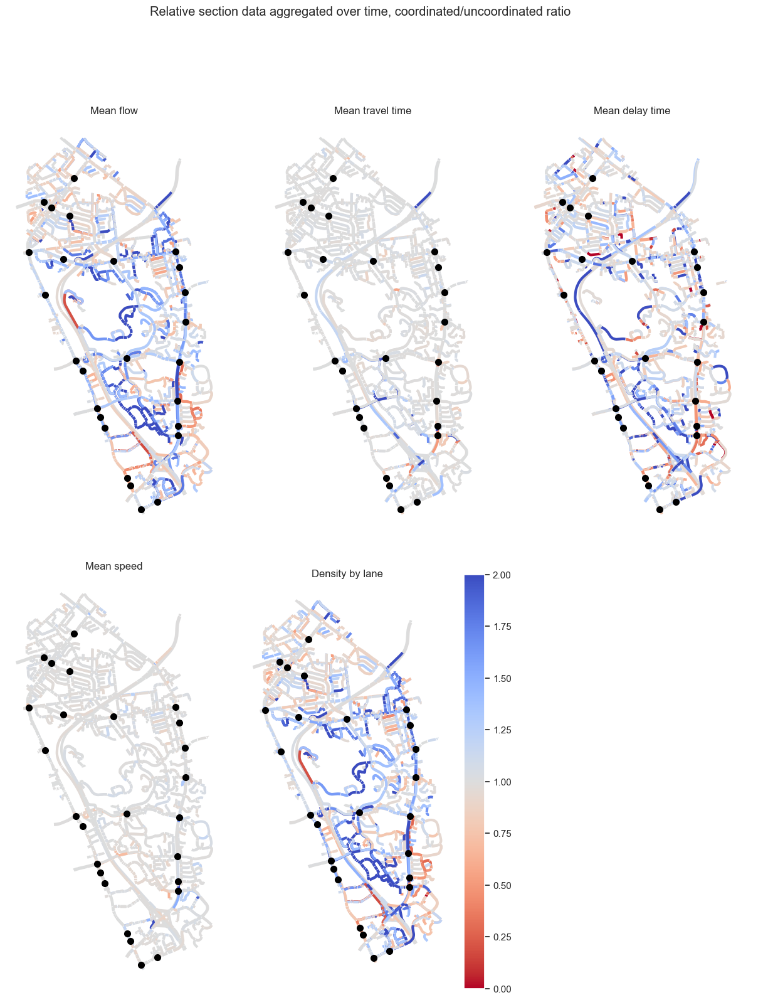

In [320]:
fig, axs = plt.subplots(2, 3, figsize=(16, 18))
fig.suptitle('Relative section data aggregated over time, coordinated/uncoordinated ratio')
for i in range(6):
    ax = axs[i//3][i%3]
    ax.axis('off')
    if i<5:
        metric = list(section_cols.values())[i]
        frame.plot(ax=ax, column=f'{metric.name}_ratio', legend=(i==4), cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
        node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
        ax.set_title(metric.desc)

plt.subplots_adjust(wspace=0, hspace=0.1)
plt.show()

In [321]:
section_cols

{'flow': Column(flow, Mean flow, veh/h),
 'ttime': Column(ttime, Mean travel time, s),
 'dtime': Column(dtime, Mean delay time, s),
 'speed': Column(speed, Mean speed, km/h),
 'density': Column(density, Density by lane, veh/km)}

In [322]:
frame.head()

,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio,func_class,geometry,log_flow_uncoordinated,log_flow_coordinated
eid,,,,,,,,,,,,,,,,,,,
1006,8.368421,12.340435,0.808257,44.486942,0.188504,7.403509,12.603305,0.806222,43.587070,0.171938,0.884696,1.021302,0.997483,0.979772,0.912118,5,"LINESTRING (-13572729.375 4511855.337, -135727...",2.124465,2.001954
1007,3.583333,8.871003,0.436844,45.206147,0.079530,5.027778,9.202761,0.458958,43.727507,0.116992,1.403101,1.037398,1.050622,0.967291,1.471041,5,"LINESTRING (-13572788.740 4511703.374, -135728...",1.276293,1.614978
1008,7.962963,13.058944,1.070261,43.616534,0.184712,7.904762,13.323484,1.050503,42.790368,0.187943,0.992691,1.020257,0.981539,0.981058,1.017494,5,"LINESTRING (-13572773.768 4511698.341, -135727...",2.074801,2.067465
1009,6.555556,9.044283,0.763342,43.671918,0.151484,6.684211,9.217544,0.719530,42.851862,0.157752,1.019625,1.019157,0.942605,0.981222,1.041378,5,"LINESTRING (-13572921.125 4511676.124, -135728...",1.880313,1.899748
1020,4.000000,5.511083,0.873459,33.565408,0.119170,4.000000,5.511083,0.873459,33.565408,0.119170,1.000000,1.000000,1.000000,1.000000,1.000000,5,"LINESTRING (-13573074.618 4513379.633, -135731...",1.386294,1.386294


In [323]:
image_path

'C:\\Users\\prest\\Preston\\Berkeley\\fremont_project\\images\\2022-09-24\\Mostly Coordinated vs Coordinated_v2'

### Function class

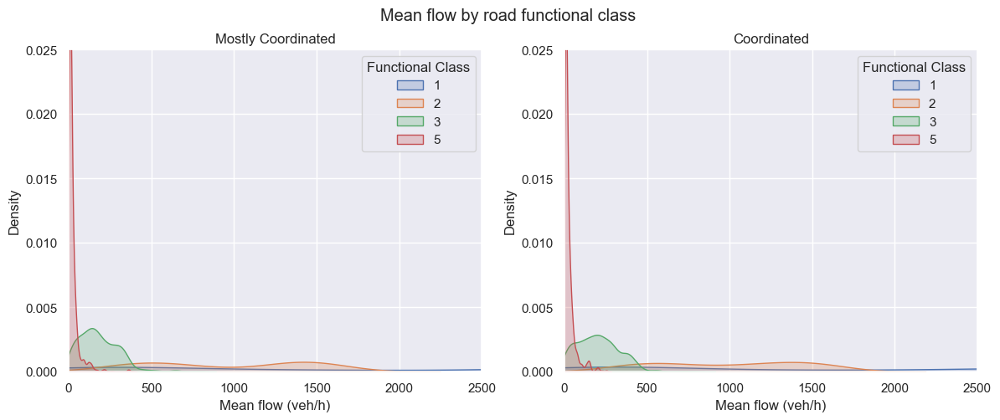

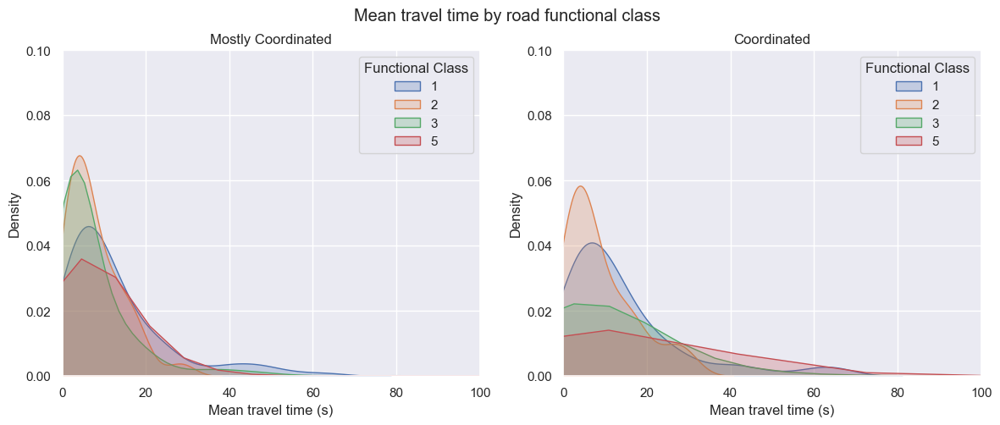

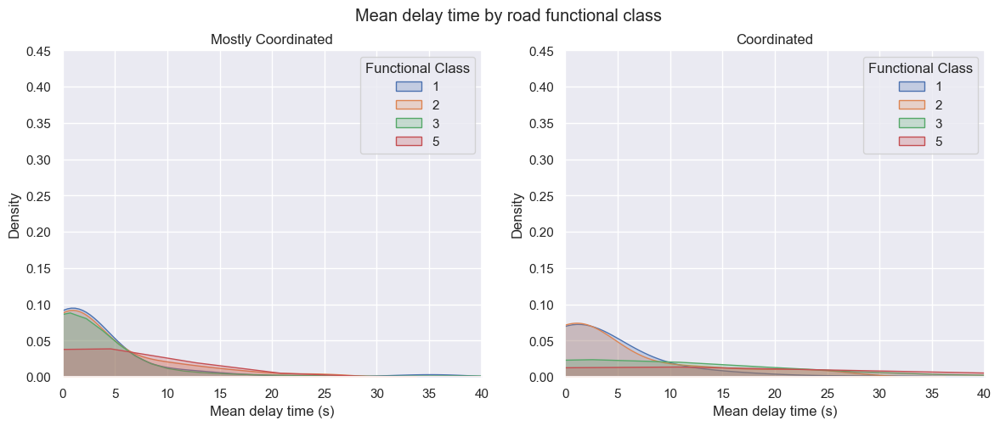

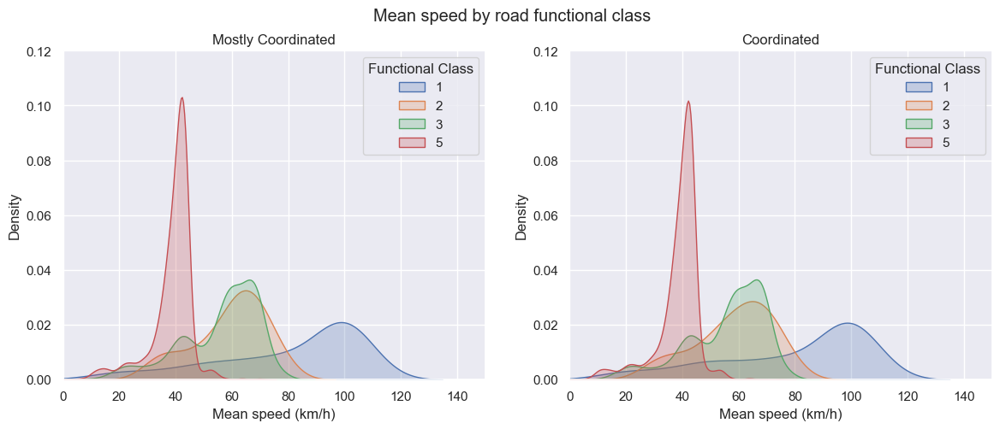

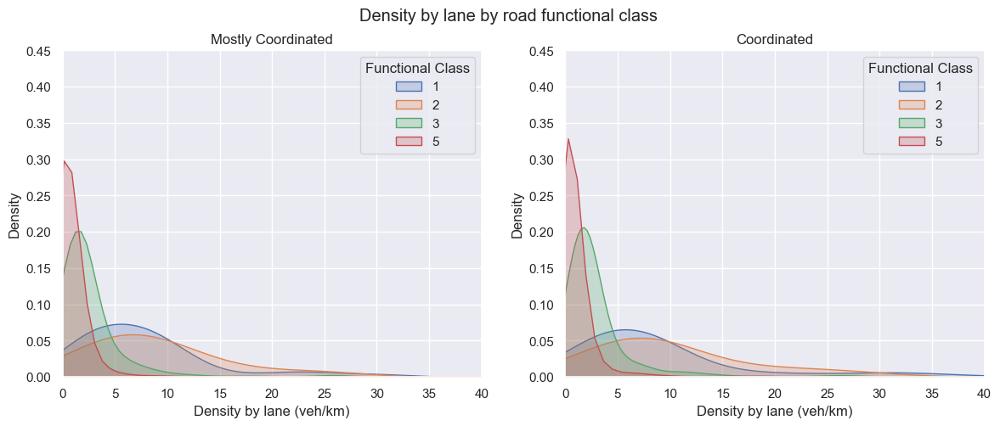

In [324]:
func_classes = [1, 2, 3, 5]
clip_at = {
    'flow': {'x': (0, 2500), 'y': (0, 0.025)},
    'ttime': {'x': (0, 100), 'y': (0, 0.1)},
    'dtime': {'x': (0, 40), 'y': (0, 0.45)},
    'speed': {'x': (0, 150), 'y': (0, 0.12)},
    'density': {'x': (0, 40), 'y': (0, 0.45)},
}

for k in section_cols:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle(section_cols[k].desc + ' by road functional class')
    # ax1.set_yscale('log')
    # ax2.set_yscale('log')
    ax1.set_title(uncoordinated_description)
    ax2.set_title(coordinated_description)

    for func_class in func_classes:
        subset = frame[frame['func_class'] == func_class].reset_index()
        sns.kdeplot(subset[k+'_uncoordinated'], shade=True, label=func_class, ax=ax1)
        sns.kdeplot(subset[k+'_coordinated'], shade=True, label=func_class, ax=ax2)
    
    for ax in (ax1, ax2):
        ax.legend(title='Functional Class')
        ax.set_xlabel(f'{section_cols[k].desc} ({section_cols[k].unit})')
        ax.set_ylabel('Density')
        ax.set_xlim(clip_at[k]['x'])
        ax.set_ylim(clip_at[k]['y'])
    
    plt.savefig(f'{image_path}/functional-class-{k}.png',
        bbox_inches='tight', pad_inches=0)
    plt.show()

In [325]:
sections[sections['eid']==2768]

,id,eid,name,nb_lanes,speed,capacity,rd_type,func_class,fnode,tnode,geometry


## Animations

### Note: this section takes forever to run

In [326]:
uncoordinated_section_df

,did,oid,eid,sid,ent,flow,flow_D,count,count_D,input_flow,...,total_lane_changes,total_lane_changes_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,242,242,0,1,1360.000000,-1.0,340.0,-1.0,1384.000000,...,0.0,-1.0,0.000000,0.000000,0.000000,-1.0,0.0,-1.0,0.0,-1.0
1,151642198,243,243,0,1,1284.000000,-1.0,321.0,-1.0,1288.000000,...,11.0,-1.0,0.000000,0.000000,0.000000,-1.0,0.0,-1.0,0.0,-1.0
2,151642198,244,244,0,1,1288.000000,-1.0,322.0,-1.0,1288.000000,...,5.0,-1.0,0.000000,0.000000,0.000000,-1.0,0.0,-1.0,0.0,-1.0
3,151642198,246,246,0,1,0.000000,-1.0,0.0,-1.0,0.000000,...,0.0,-1.0,-1.000000,-1.000000,-1.000000,-1.0,-1.0,-1.0,-1.0,-1.0
4,151642198,247,247,0,1,8.000000,-1.0,2.0,-1.0,8.000000,...,0.0,-1.0,0.000000,0.000000,0.000000,-1.0,0.0,-1.0,0.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
352870,151642198,151597396,28550,2,0,0.000000,-1.0,0.0,-1.0,0.000000,...,0.0,-1.0,-1.000000,-1.000000,-1.000000,-1.0,-1.0,-1.0,-1.0,-1.0
352871,151642198,151600599,28581,2,0,0.000000,-1.0,0.0,-1.0,0.000000,...,0.0,-1.0,-1.000000,-1.000000,-1.000000,-1.0,-1.0,-1.0,-1.0,-1.0
352872,151642198,151616088,3425,2,0,479.666667,-1.0,2878.0,-1.0,479.666667,...,32.0,-1.0,0.000000,0.000000,0.000000,-1.0,0.0,-1.0,0.0,-1.0
352873,151642198,151616494,56150,2,0,266.666667,-1.0,1600.0,-1.0,266.666667,...,10.0,-1.0,0.000000,0.000000,0.000000,-1.0,0.0,-1.0,0.0,-1.0


In [327]:
null_values['ent'] = 0
null_values

{'eid': None,
 'ent': 0,
 'flow': 0,
 'ttime': -1,
 'dtime': -1,
 'speed': -1,
 'density': 0}

In [328]:
dfs_section = {'uncoordinated': uncoordinated_section_df, 'coordinated': coordinated_section_df}

def preprocess_sections_animation(df):
    df = df[df['sid']==0]
    df = df.filter(items=null_values.keys()).dropna(axis=0)
    for k, v in null_values.items():
        df = df[df[k]!=v]
    return df

for k, df in dfs_section.items():
    dfs_section[k] = preprocess_sections_animation(df)

dfs_section['uncoordinated']

,eid,ent,flow,ttime,dtime,speed,density
0,242,1,1360.0,24.473902,18.239952,27.307553,51.013682
1,243,1,1284.0,2.650893,0.040631,105.513647,3.070701
2,244,1,1288.0,1.819207,0.073627,105.484395,3.153704
4,247,1,8.0,9.686079,0.694306,43.690994,0.184051
5,248,1,12.0,11.996788,8.116106,15.850953,0.780364
...,...,...,...,...,...,...,...
329332,3538,24,4.0,3.271089,0.000000,46.764838,0.085534
329340,33076,24,4.0,20.883343,0.727717,38.396247,0.104177
329347,3425,24,632.0,4.653235,1.891251,62.300807,5.047699
329348,56150,24,480.0,1.056945,0.296515,60.141750,4.202165


In [329]:
dfs_section['uncoordinated'][(dfs_section['uncoordinated']['eid']=="242") & (dfs_section['uncoordinated']['ent']==1)]

,eid,ent,flow,ttime,dtime,speed,density
0,242,1,1360.0,24.473902,18.239952,27.307553,51.013682


In [330]:
section_df = dfs_section['uncoordinated'].merge(dfs_section['coordinated'], on=['eid', 'ent'], how='left', suffixes=['_uncoordinated', '_coordinated'])

for k in section_cols:
    section_df[k+'_ratio'] = section_df[k+'_coordinated'] / section_df[k+'_uncoordinated']

section_df = section_df.dropna()
section_df

,eid,ent,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio
0,242,1,1360.0,24.473902,18.239952,27.307553,51.013682,1356.0,24.155884,17.927443,27.772434,50.106215,0.997059,0.987006,0.982867,1.017024,0.982211
1,243,1,1284.0,2.650893,0.040631,105.513647,3.070701,1256.0,2.659904,0.047324,105.051102,3.019156,0.978193,1.003399,1.164719,0.995616,0.983214
2,243,1,1284.0,2.650893,0.040631,105.513647,3.070701,1272.0,2.785957,0.050646,105.056933,3.052417,0.990654,1.050950,1.246481,0.995672,0.994046
3,243,1,1284.0,2.650893,0.040631,105.513647,3.070701,1268.0,0.562661,0.010235,105.032080,3.044200,0.987539,0.212253,0.251896,0.995436,0.991370
4,244,1,1288.0,1.819207,0.073627,105.484395,3.153704,1280.0,1.823788,0.077166,105.117350,3.145367,0.993789,1.002518,1.048067,0.996520,0.997356
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65802,3425,24,632.0,4.653235,1.891251,62.300807,5.047699,636.0,4.733680,1.994731,60.720573,5.190379,1.006329,1.017288,1.054715,0.974635,1.028266
65803,56150,24,480.0,1.056945,0.296515,60.141750,4.202165,828.0,26.831333,22.877550,29.268433,18.928575,1.725000,25.385737,77.154653,0.486657,4.504482
65804,56150,24,480.0,1.056945,0.296515,60.141750,4.202165,852.0,1.090531,0.325831,58.184362,7.695855,1.775000,1.031776,1.098868,0.967454,1.831403
65805,7154,24,2864.0,11.447613,0.214796,104.450035,5.091429,1324.0,12.284400,0.264690,104.312196,2.541104,0.462291,1.073097,1.232284,0.998680,0.499095


In [331]:
section_df = section_df.merge(sections[['eid', 'geometry']], left_on='eid', right_on='eid').set_index('eid')
section_df = gpd.GeoDataFrame(section_df, geometry='geometry')
frame = section_df.to_crs("EPSG:3857")
frame

,ent,flow_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,speed_uncoordinated,density_uncoordinated,flow_coordinated,ttime_coordinated,dtime_coordinated,speed_coordinated,density_coordinated,flow_ratio,ttime_ratio,dtime_ratio,speed_ratio,density_ratio,geometry
eid,,,,,,,,,,,,,,,,,
242,1,1360.0,24.473902,18.239952,27.307553,51.013682,1356.0,24.155884,17.927443,27.772434,50.106215,0.997059,0.987006,0.982867,1.017024,0.982211,"LINESTRING (-13572344.019 4508460.315, -135723..."
242,2,696.0,19.895474,13.654695,33.522541,20.792180,820.0,21.292549,15.107659,31.413536,26.367021,1.178161,1.070221,1.106408,0.937087,1.268122,"LINESTRING (-13572344.019 4508460.315, -135723..."
242,3,884.0,21.328578,15.109895,31.546310,29.331829,748.0,20.712661,14.576582,32.253563,24.012597,0.846154,0.971122,0.964704,1.022420,0.818653,"LINESTRING (-13572344.019 4508460.315, -135723..."
242,4,876.0,21.885948,15.690974,30.545975,29.068272,780.0,20.496334,14.287262,32.678167,24.019167,0.890411,0.936507,0.910540,1.069803,0.826302,"LINESTRING (-13572344.019 4508460.315, -135723..."
242,5,1052.0,22.831899,16.629938,29.209203,36.061277,892.0,22.238980,16.060410,30.088720,30.119886,0.847909,0.974031,0.965753,1.030111,0.835242,"LINESTRING (-13572344.019 4508460.315, -135723..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
905,24,4.0,5.058407,0.496121,44.063093,0.090779,8.0,5.025762,0.000000,44.669844,0.180386,2.000000,0.993546,0.000000,1.013770,1.987093,"LINESTRING (-13572655.873 4513848.650, -135726..."
3626,23,4.0,8.247884,0.852217,36.562904,0.109400,4.0,7.683847,0.000000,39.246824,0.101919,1.000000,0.931614,0.000000,1.073406,0.931614,"LINESTRING (-13572546.375 4514283.834, -135725..."
9050,23,8.0,1.946948,0.000000,46.629137,0.171867,4.0,2.466981,0.438606,36.735478,0.108887,0.500000,1.267101,inf,0.787822,0.633551,"LINESTRING (-13571992.869 4513877.308, -135720..."


### Side by side (and determining bounds)

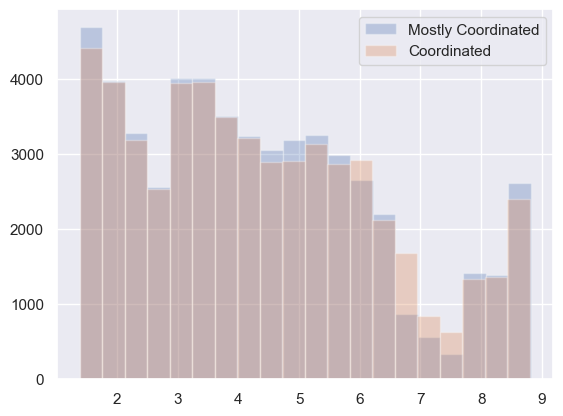

In [332]:
plt.hist(np.log(frame['flow_uncoordinated']), bins=20, alpha=0.3, label=uncoordinated_description)
plt.hist(np.log(frame['flow_coordinated']), bins=20, alpha=0.3, label=coordinated_description)
plt.legend()
plt.show()

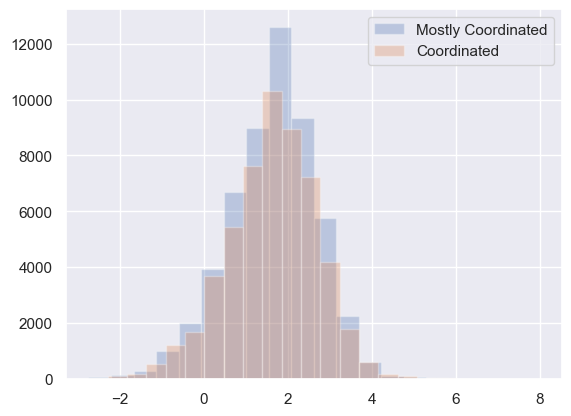

In [333]:
plt.hist(np.log(frame['ttime_uncoordinated']), bins=20, alpha=0.3, label=uncoordinated_description)
plt.hist(np.log(frame['ttime_coordinated']), bins=20, alpha=0.3, label=coordinated_description)
plt.legend()
plt.show()

<AxesSubplot:>

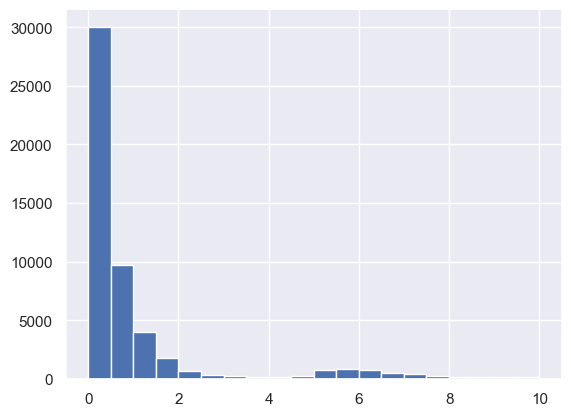

In [334]:
frame['dtime_uncoordinated'][frame['dtime_uncoordinated'] < 10].hist(bins=20)

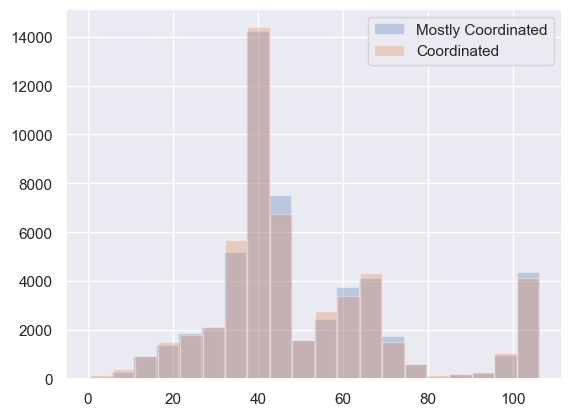

In [335]:
plt.hist(frame['speed_uncoordinated'], bins=20, alpha=0.3, label=uncoordinated_description)
plt.hist(frame['speed_coordinated'], bins=20, alpha=0.3, label=coordinated_description)
plt.legend()
plt.show()

<AxesSubplot:>

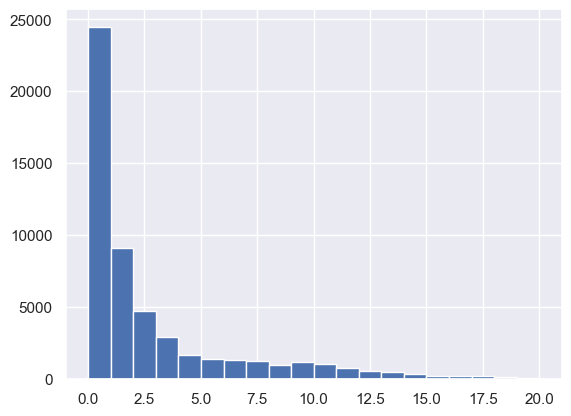

In [336]:
frame['density_uncoordinated'][frame['density_uncoordinated'] < 20].hist(bins=20)

In [337]:
frame['log_flow_uncoordinated'] = np.log(frame['flow_uncoordinated'])
frame['log_flow_coordinated'] = np.log(frame['flow_coordinated'])
frame['log_ttime_uncoordinated'] = np.log(frame['ttime_uncoordinated'])
frame['log_ttime_coordinated'] = np.log(frame['ttime_coordinated'])

In [338]:
section_cols

{'flow': Column(flow, Mean flow, veh/h),
 'ttime': Column(ttime, Mean travel time, s),
 'dtime': Column(dtime, Mean delay time, s),
 'speed': Column(speed, Mean speed, km/h),
 'density': Column(density, Density by lane, veh/km)}

In [339]:
section_comparisons = {
    'flow': (Column('log_flow', 'Log of mean flow', 'veh/h'), (0, 10)),
    'ttime': (Column('log_ttime', 'Log of mean travel time', 's'), (-2, 6)),
    'dtime': (section_cols['dtime'], (0, 2.5)),
    'speed': (section_cols['speed'], (0, 120)),
    'density': (section_cols['density'], (0, 8))
}

Processing log_flow, frame 1
Processing log_flow, frame 1
Processing log_flow, frame 2
Processing log_flow, frame 3
Processing log_flow, frame 4
Processing log_flow, frame 5
Processing log_flow, frame 6
Processing log_flow, frame 7


KeyboardInterrupt: 

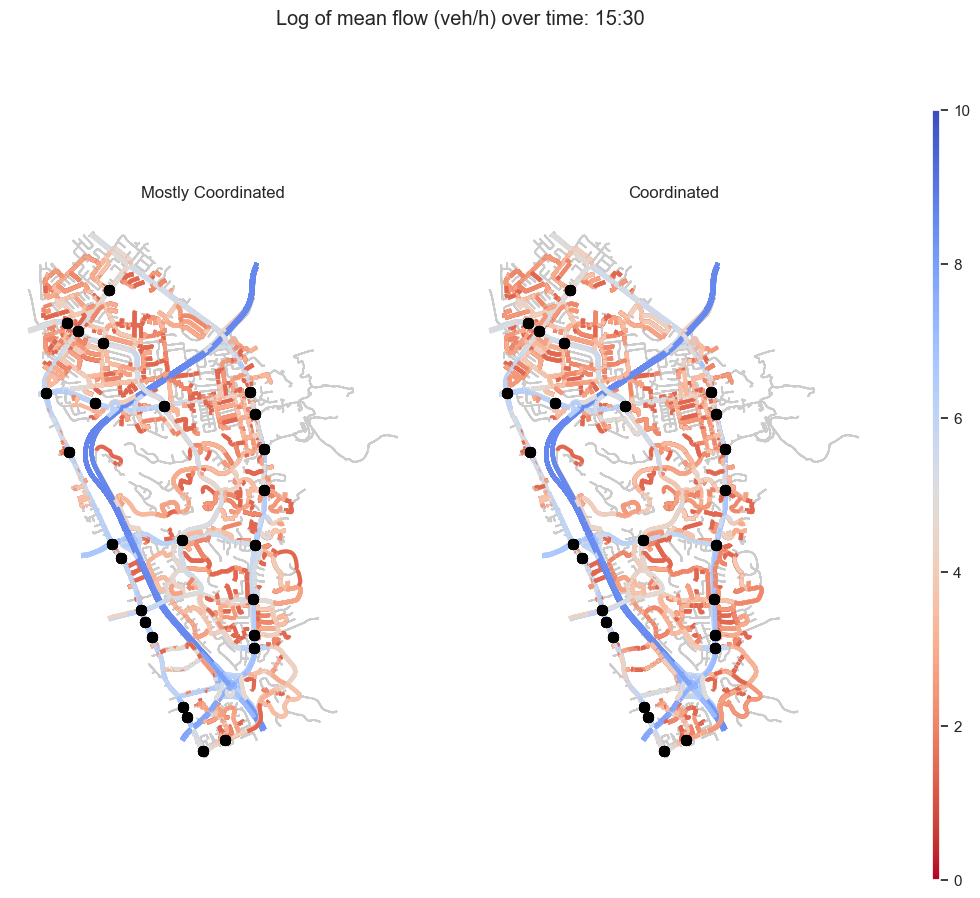

In [340]:
from matplotlib import animation
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def make_animation_side_by_side(metric, vmin, vmax):
    fig, [ax1, ax2, cax] = plt.subplots(1, 3, figsize=(12, 10), gridspec_kw={"width_ratios":[50,50,1]})
    norm = Normalize(vmin=vmin, vmax=vmax)
    cb = ColorbarBase(cax, cmap='coolwarm_r', norm=norm, orientation='vertical')
    
    def animate(timestep):
        print(f'Processing {metric.name}, frame {timestep}')
        fig.suptitle(f'{metric.desc} ({metric.unit}) over time: {TIME_INTERVALS_STRING[timestep - 1]}')
        data = frame[frame['ent']==timestep+1]
        sections.plot(ax=ax1, lw=1, color='0.8', zorder=-1)
        sections.plot(ax=ax2, lw=1, color='0.8', zorder=-1)
        data.plot(ax=ax1, column=(metric.name + '_uncoordinated'), cmap='coolwarm_r', lw=3, vmin=vmin, vmax=vmax, zorder=0)
        data.plot(ax=ax2, column=(metric.name + '_coordinated'), cmap='coolwarm_r', lw=3, vmin=vmin, vmax=vmax, zorder=0)
        im1 = node_geo_city.plot(ax=ax1, color='black', lw=2, zorder=1)
        im2 = node_geo_city.plot(ax=ax2, color='black', lw=2, zorder=1)
        ax1.set_title(uncoordinated_description)
        ax2.set_title(coordinated_description)
        ax1.set_axis_off()
        ax2.set_axis_off()
        return [im1, im2]

    anim = animation.FuncAnimation(fig, animate, interval=1000, repeat_delay=3000, frames=range(1, 25))
    writergif = animation.PillowWriter(fps=0.6)
    anim.save(f'{image_path}/{metric.name}_side_by_side.gif', writer=writergif)
    # plt.show()

for k in section_cols:
    metric, (vmin, vmax) = section_comparisons[k]
    make_animation_side_by_side(metric, vmin, vmax)

In [ ]:
for k in ['dtime', 'density']:
    metric, (vmin, vmax) = section_comparisons[k]
    make_animation_side_by_side(metric, vmin, vmax)

### Ratio

In [ ]:
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def make_animation_ratio(metric):
    fig, [ax,cax] = plt.subplots(1, 2, figsize=(7, 9), gridspec_kw={"width_ratios":[50,1]})
    norm = Normalize(vmin=0, vmax=2)
    cb = ColorbarBase(cax, cmap='coolwarm_r', norm=norm, orientation='vertical')
    ax.set_axis_off()
    
    def animate(timestep):
        print(f'Processing {metric.name}, frame {timestep}')
        fig.suptitle(f'{metric.desc} coordinated/uncoordinated ratio over time: {TIME_INTERVALS_STRING[timestep - 1]}')
        data = frame[frame['ent']==timestep+1]
        sections.plot(ax=ax, lw=1, color='0.8', zorder=-1)
        data.plot(ax=ax, column=(metric.name + '_ratio'), cmap='coolwarm_r', lw=3, vmin=0, vmax=2, zorder=0)
        im = node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
        return [im]

    anim = animation.FuncAnimation(fig, animate, interval=1000, repeat_delay=3000, frames=range(1, 25))
    writergif = animation.PillowWriter(fps=0.8)
    anim.save(f'{image_path}/{metric.name}_ratio.gif', writer=writergif)
    # plt.show()

for k in section_cols:
    make_animation_ratio(section_cols[k])

In [ ]:
make_animation_ratio(section_cols['speed'])

### Difference

In [ ]:
for k in section_cols:
    frame[k + '_difference'] = frame[k + '_coordinated'] - frame[k + '_uncoordinated']

frame

In [ ]:
frame['ttime_difference'][abs(frame['ttime_difference']) < 5].hist(bins=20)

In [ ]:
frame['speed_difference'][abs(frame['speed_difference']) < 10].hist(bins=20)

In [ ]:
section_comparisons_diff = {
    'ttime': (section_cols['ttime'], (-10, 10)),
    'speed': (section_cols['speed'], (-10, 10))
}

In [ ]:
sections

In [ ]:
from matplotlib.colorbar import ColorbarBase
from matplotlib.colors import Normalize

def make_animation_diff(metric, vmin, vmax):
    fig, [ax,cax] = plt.subplots(1, 2, figsize=(7, 9), gridspec_kw={"width_ratios":[50,1]})
    norm = Normalize(vmin=vmin, vmax=vmax)
    cb = ColorbarBase(cax, cmap='coolwarm_r', norm=norm, orientation='vertical')
    ax.set_axis_off()
    
    def animate(timestep):
        print(f'Processing {metric.name}, frame {timestep}')
        fig.suptitle(f'{metric.desc} coordinated-uncoordinated difference ({metric.unit}) over time: {TIME_INTERVALS_STRING[timestep - 1]}')
        data = frame[frame['ent']==timestep+1]
        sections.plot(ax=ax, lw=1, color='0.8', zorder=-1)
        data.plot(ax=ax, column=(metric.name + '_difference'), cmap='coolwarm_r', lw=3, vmin=vmin, vmax=vmax, zorder=0)
        im = node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
        return [im]

    anim = animation.FuncAnimation(fig, animate, interval=1000, repeat_delay=3000, frames=range(1, 25))
    writergif = animation.PillowWriter(fps=0.8)
    anim.save(f'{image_path}/{metric.name}_difference.gif', writer=writergif)
    # plt.show()

for k in ['ttime', 'speed']:
    metric, (vmin, vmax) = section_comparisons_diff[k]
    make_animation_diff(metric, vmin, vmax)

### MP4 generation

Because direct MP4 writing doesn't work.

In [ ]:
import moviepy.editor as mp

for filename in os.listdir(image_path):
    f = os.path.join(image_path, filename)
    name, ext = f.split('.')
    if os.path.isfile(f) and ext == 'gif':
        clip = mp.VideoFileClip(f)
        clip.write_videofile(name + ".mp4")

<a id='od'></a>
# OD Data

In [121]:
uncoordinated_od_query = pd.read_sql('SELECT * FROM MICENT_O', uncoordinated_con)
uncoordinated_od_df = pd.DataFrame(uncoordinated_od_query)

uncoordinated_od_df

,did,oid,eid,sid,ent,destination,nbveh,nbveh_D,flow,flow_D,...,qvmean,qvmean_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,151634377,int_0,0,1,151634377.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
1,151642198,151634377,int_0,0,1,151634402.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2,151642198,151634377,int_0,0,1,151634411.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
3,151642198,151634377,int_0,0,1,151634430.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
4,151642198,151634377,int_0,0,1,151634517.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
561145,151642198,151635745,ext_10,2,0,151635736.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561146,151642198,151635745,ext_10,2,0,151635739.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561147,151642198,151635745,ext_10,2,0,151635742.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561148,151642198,151635745,ext_10,2,0,151635745.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0


In [122]:
coordinated_od_query = pd.read_sql('SELECT * FROM MICENT_O', coordinated_con)
coordinated_od_df = pd.DataFrame(coordinated_od_query)

coordinated_od_df

,did,oid,eid,sid,ent,destination,nbveh,nbveh_D,flow,flow_D,...,qvmean,qvmean_D,stime,stime_D,nstops,nstops_D,fuelc,fuelc_D,batteryc,batteryc_D
0,151642198,151634377,int_0,0,1,151634377.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
1,151642198,151634377,int_0,0,1,151634402.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
2,151642198,151634377,int_0,0,1,151634411.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
3,151642198,151634377,int_0,0,1,151634430.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
4,151642198,151634377,int_0,0,1,151634517.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
561145,151642198,151635745,ext_10,2,0,151635736.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561146,151642198,151635745,ext_10,2,0,151635739.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561147,151642198,151635745,ext_10,2,0,151635742.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0
561148,151642198,151635745,ext_10,2,0,151635745.0,0.0,-1.0,0.0,-1.0,...,0.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0,-1.0


In [123]:
coordinated_od_df[(coordinated_od_df['sid']==0) & (coordinated_od_df['nbveh']>0)][['oid', 'eid', 'destination', 'spdh', 'ttime', 'dtime', 'travel']]

,oid,eid,destination,spdh,ttime,dtime,travel
79,151634377,int_0,151635727.0,92.683149,254.547249,21.282066,13.088924
81,151634377,int_0,151635733.0,74.252867,190.034951,50.948261,3.919622
85,151634377,int_0,151635745.0,38.395220,161.413348,79.459261,1.721528
86,151634377,int_0,0.0,65.475774,215.135699,43.242914,18.730075
166,151634402,int_1,151635727.0,52.916627,610.861359,207.971480,17.950058
...,...,...,...,...,...,...,...
546168,151635745,ext_10,151635600.0,42.216974,223.479824,65.809634,102.250255
546170,151635745,ext_10,151635648.0,53.051312,23.416811,3.675807,1.725406
546172,151635745,ext_10,151635666.0,33.644010,215.872021,95.501427,47.240295
546173,151635745,ext_10,151635689.0,45.006719,227.497739,68.900265,73.837089


In [124]:
dfs_od = {'uncoordinated': uncoordinated_od_df, 'coordinated': coordinated_od_df}
od_columns = {
    'oid': Column('oid', 'Origin centroid identifier', None),
    'eid': Column('eid', 'Origin centroid external ID', None),
    'destination': Column('destination', 'Destination centroid identifier', None),
    'speed': Column('speed', 'Mean speed', 'km/h'),
    'ttime': Column('ttime', 'Mean travel time', 's'),
    'dtime': Column('dtime', 'Mean delay time', 's')
}
od_column_names = list(od_columns.keys())

mean_dist = Column('mean_dist', 'Mean travel distance', 'km')

def preprocess_od(df):
    df = df[(df['sid']==0) & (df['nbveh']>0)][od_column_names]
    df['mean_dist'] = df['speed'] * df['ttime'] / 3600
    df['oid'] = df['oid'].astype(int)
    df['destination'] = df['destination'].astype(int)
    return df

for k, df in dfs_od.items():
    dfs_od[k] = preprocess_od(df)

dfs_od['uncoordinated']

,oid,eid,destination,speed,ttime,dtime,mean_dist
79,151634377,int_0,151635727,92.354351,257.477739,24.204354,6.605330
81,151634377,int_0,151635733,44.388216,317.837200,178.763933,3.918952
85,151634377,int_0,151635745,41.809689,148.246362,66.308671,1.721704
86,151634377,int_0,0,67.726652,245.259760,73.370328,4.614062
166,151634402,int_1,151635727,51.018652,621.714604,210.039434,8.810845
...,...,...,...,...,...,...,...
546168,151635745,ext_10,151635600,39.247670,272.716084,103.902120,2.973186
546170,151635745,ext_10,151635648,55.183013,23.320849,3.579845,0.357476
546172,151635745,ext_10,151635666,38.882711,193.086533,75.910481,2.085480
546173,151635745,ext_10,151635689,38.088003,313.202431,121.040948,3.313682


In [125]:
dfs_od['coordinated']

,oid,eid,destination,speed,ttime,dtime,mean_dist
79,151634377,int_0,151635727,93.440063,254.547249,21.282066,6.606920
81,151634377,int_0,151635733,74.252867,190.034951,50.948261,3.919622
85,151634377,int_0,151635745,38.395220,161.413348,79.459261,1.721528
86,151634377,int_0,0,74.882053,215.135699,43.242914,4.474945
166,151634402,int_1,151635727,52.950571,610.861359,207.971480,8.984849
...,...,...,...,...,...,...,...
546168,151635745,ext_10,151635600,43.566268,223.479824,65.809634,2.704495
546170,151635745,ext_10,151635648,54.411089,23.416811,3.675807,0.353926
546172,151635745,ext_10,151635666,36.948646,215.872021,95.501427,2.215605
546173,151635745,ext_10,151635689,45.939318,227.497739,68.900265,2.903081


In [126]:
od_columns_compare = {
    'speed': od_columns['speed'],
    'ttime': od_columns['ttime'],
    'dtime': od_columns['dtime'],
    'mean_dist': mean_dist
}

od_df = dfs_od['uncoordinated'][od_columns_compare].join(
    dfs_od['coordinated'][od_columns_compare], lsuffix='_uncoordinated', rsuffix='_coordinated')

for k in od_columns:
    if k not in od_columns_compare:
        od_df[k] = dfs_od['uncoordinated'][k]

for k in od_columns_compare:
    od_df[f'{k}_ratio'] = od_df[f'{k}_coordinated'] / od_df[f'{k}_uncoordinated']

od_df

C:\Users\prest\AppData\Local\Temp\ipykernel_18324\2171387974.py:8: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  od_df = dfs_od['uncoordinated'][od_columns_compare].join(
C:\Users\prest\AppData\Local\Temp\ipykernel_18324\2171387974.py:9: FutureWarning: Passing a dict as an indexer is deprecated and will raise in a future version. Use a list instead.
  dfs_od['coordinated'][od_columns_compare], lsuffix='_uncoordinated', rsuffix='_coordinated')


,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
79,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241
81,44.388216,317.837200,178.763933,3.918952,74.252867,190.034951,50.948261,3.919622,151634377,int_0,151635733,1.672806,0.597900,0.285003,1.000171
85,41.809689,148.246362,66.308671,1.721704,38.395220,161.413348,79.459261,1.721528,151634377,int_0,151635745,0.918333,1.088818,1.198324,0.999898
86,67.726652,245.259760,73.370328,4.614062,74.882053,215.135699,43.242914,4.474945,151634377,int_0,0,1.105651,0.877175,0.589379,0.969849
166,51.018652,621.714604,210.039434,8.810845,52.950571,610.861359,207.971480,8.984849,151634402,int_1,151635727,1.037867,0.982543,0.990154,1.019749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
546168,39.247670,272.716084,103.902120,2.973186,43.566268,223.479824,65.809634,2.704495,151635745,ext_10,151635600,1.110034,0.819460,0.633381,0.909628
546170,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069
546172,38.882711,193.086533,75.910481,2.085480,36.948646,215.872021,95.501427,2.215605,151635745,ext_10,151635666,0.950259,1.118007,1.258080,1.062396
546173,38.088003,313.202431,121.040948,3.313682,45.939318,227.497739,68.900265,2.903081,151635745,ext_10,151635689,1.206136,0.726360,0.569231,0.876089


In [127]:
def most_impacted(metric_name, n):
    df = od_df[['oid', 'eid', 'destination', f'{metric_name}_ratio']].sort_values(by=f'{metric_name}_ratio')
    df.replace([np.inf, -np.inf], np.nan, inplace=True)
    df.dropna(inplace=True)
    return df.head(n), df.tail(n)

speed_head, speed_tail = most_impacted('speed', 30)
ttime_head, ttime_tail = most_impacted('ttime', 30)
dtime_head, dtime_tail = most_impacted('dtime', 30)
mean_dist_head, mean_dist_tail = most_impacted('mean_dist', 30)

In [128]:
speed_head

,oid,eid,destination,speed_ratio
522910,151635718,ext_1,151635184,0.158159
500431,151635718,ext_1,151634562,0.217799
410640,151635718,ext_1,151634377,0.233210
366455,151635742,ext_9,151634638,0.260233
516943,151634562,int_7,151635718,0.266526
340771,151635291,int_46,151635727,0.280286
522877,151635718,ext_1,151634562,0.281149
343744,151635733,ext_6,151634562,0.288287
411340,151635742,ext_9,151634517,0.297448
406366,151634913,int_26,151635718,0.308892


In [129]:
speed_tail

,oid,eid,destination,speed_ratio
29448,151635730,ext_5,151635210,2.521947
523625,151635742,ext_9,151635460,2.532936
73950,151635718,ext_1,151634377,2.568910
298784,151635730,ext_5,151634913,2.572595
51568,151635718,ext_1,151635521,2.655512
29337,151635727,ext_4,151634773,2.662807
118865,151635718,ext_1,151634856,2.694929
26181,151635210,int_42,151635733,2.722103
29383,151635727,ext_4,151635521,2.759648
29076,151635718,ext_1,151634773,2.766867


### Aggregate plots (not useful)

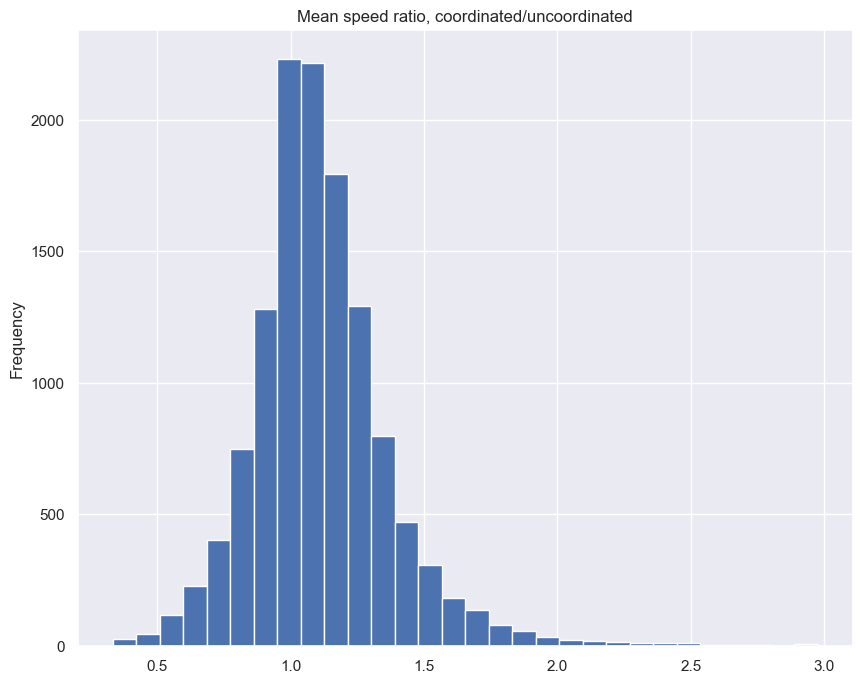

In [130]:
def plot(metric_name):
    metric_data = od_df[f'{metric_name}_ratio']
    low, high = metric_data.quantile(0.001), metric_data.quantile(0.999)
    metric_data[(low<=metric_data) & (metric_data<=high)].plot.hist(bins=30, figsize=(10, 8))
    plt.title(f'{od_columns[metric_name].desc} ratio, coordinated/uncoordinated')

    # with curve fitting (https://stackoverflow.com/a/35545265):
    # 
    # def gaussian(x, mean, amplitude, standard_deviation):
    #     return amplitude * np.exp( - (x - mean)**2 / (2*standard_deviation ** 2))

    # metric_data = od_df[f'{metric_name}_ratio']
    # metric_data = metric_data[~is_outlier(metric_data)]
    
    # fig = plt.figure(figsize=(10, 8))
    # bin_heights, bin_borders, _ = plt.hist(metric_data, bins=30)
    # bin_centers = bin_borders[:-1] + np.diff(bin_borders) / 2
    # popt, _ = curve_fit(gaussian, bin_centers, bin_heights, p0=[1., 0., 1.])
    # x_interval_for_fit = np.linspace(bin_borders[0], bin_borders[-1], 10000)

    # plt.title(f'{od_columns[metric_name].desc} ratio, coordinated/uncoordinated (outliers removed)')
    # plt.plot(x_interval_for_fit, gaussian(x_interval_for_fit, *popt), linestyle='dashed')


plot('speed')

In [131]:
ttime_head

,oid,eid,destination,ttime_ratio
385148,151635184,int_40,0,0.087325
518606,151634913,int_26,0,0.144919
433111,151635718,ext_1,151634880,0.171315
298938,151635736,ext_7,151634543,0.173944
543305,151635369,int_52,151635721,0.183404
184171,151635369,int_52,151635727,0.191894
29324,151635727,ext_4,151634526,0.195407
338419,151634794,int_19,151635718,0.195790
340249,151635184,int_40,151635727,0.196793
411469,151635745,ext_10,151635291,0.197021


In [132]:
ttime_tail

,oid,eid,destination,ttime_ratio
431255,151635403,int_54,151635739,4.002838
364960,151635541,int_66,151635736,4.007527
472409,151634638,int_11,0,4.017531
456031,151635733,ext_6,151635521,4.039948
472837,151634723,int_16,151635727,4.057021
544003,151635479,int_60,151635727,4.195872
343744,151635733,ext_6,151634562,4.226791
366455,151635742,ext_9,151634638,4.257741
388681,151635733,ext_6,151635369,4.259770
157807,151634562,int_7,151635718,4.327513


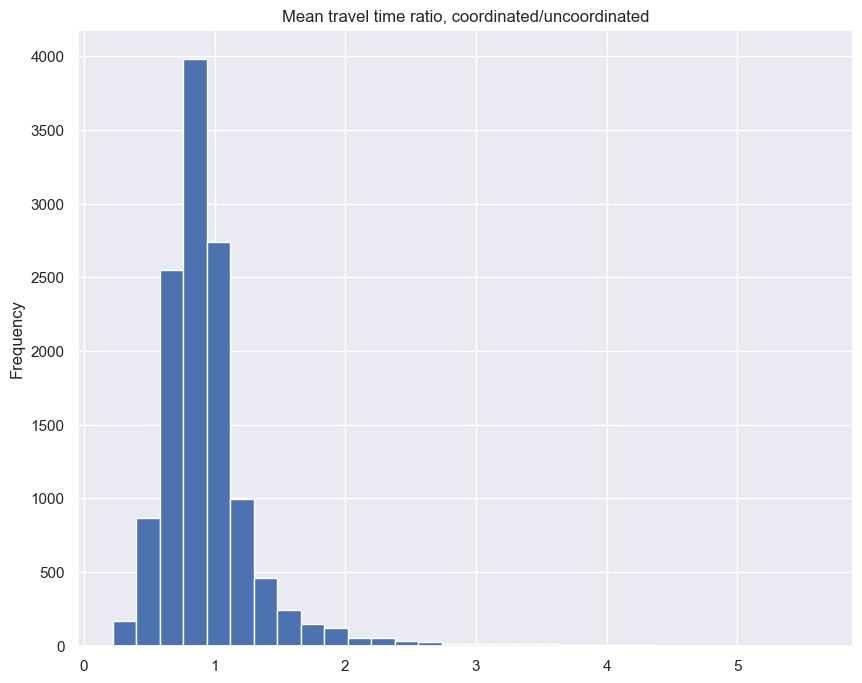

In [133]:
plot('ttime')

In [134]:
dtime_head

,oid,eid,destination,dtime_ratio
141295,151635718,ext_1,151634562,0.000000
7395,151635745,ext_10,151634377,0.004799
456342,151635745,ext_10,151634935,0.007616
432907,151635666,int_73,151635736,0.012855
385148,151635184,int_40,0,0.013747
119625,151635745,ext_10,151634377,0.013979
209080,151635733,ext_6,151634794,0.015503
115965,151635210,int_42,151635733,0.016198
411146,151635733,ext_6,151635648,0.019545
186212,151635718,ext_1,151635051,0.020080


In [135]:
dtime_tail

,oid,eid,destination,dtime_ratio
411340,151635742,ext_9,151634517,15.702178
141198,151635689,int_74,151635742,15.734976
478753,151635742,ext_9,151635727,15.976498
388901,151635742,ext_9,151634638,16.268689
494855,151634638,int_11,0,16.288210
411087,151635733,ext_6,151634657,16.817309
142137,151635745,ext_10,151635541,16.824223
1129,151634657,int_12,151635745,17.806989
501199,151635742,ext_9,151635727,18.744570
475621,151635317,int_48,151635727,20.033023


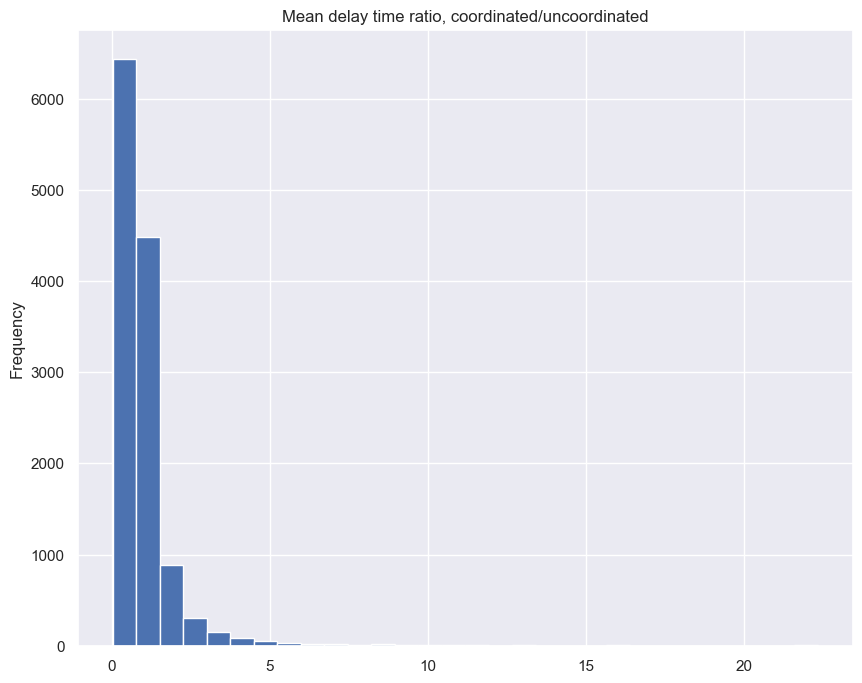

In [136]:
plot('dtime')

In [137]:
def most_impacted(metric_name, n):
    df = od_df[['oid', 'eid', 'destination', f'{metric_name}_ratio', f'{metric_name}_uncoordinated', f'{metric_name}_coordinated']].sort_values(by=f'{metric_name}_ratio')
    df.dropna(inplace=True)
    return df.head(n), df.tail(n)

dtime_head, dtime_tail = most_impacted('dtime', 30)

In [138]:
mean_dist_head

,oid,eid,destination,mean_dist_ratio
518606,151634913,int_26,0,0.142530
543305,151635369,int_52,151635721,0.184874
433111,151635718,ext_1,151634880,0.212069
517987,151634794,int_19,151635718,0.218454
298938,151635736,ext_7,151634543,0.225798
411469,151635745,ext_10,151635291,0.234409
385148,151635184,int_40,0,0.256996
298676,151635727,ext_4,151634526,0.277922
366014,151635727,ext_4,151634526,0.291545
224630,151634402,int_1,151635739,0.299933


In [139]:
mean_dist_tail

,oid,eid,destination,mean_dist_ratio
519121,151635051,int_32,151635727,3.323676
70201,151635051,int_32,151635727,3.342916
544003,151635479,int_60,151635727,3.360703
343640,151635727,ext_4,151635721,3.402636
472409,151634638,int_11,0,3.517586
427169,151634562,int_7,0,3.524444
253724,151635724,ext_3,151635051,3.599012
545410,151635721,ext_2,151634562,3.672587
478016,151635718,ext_1,151635156,3.934780
50807,151635580,int_67,0,3.957031


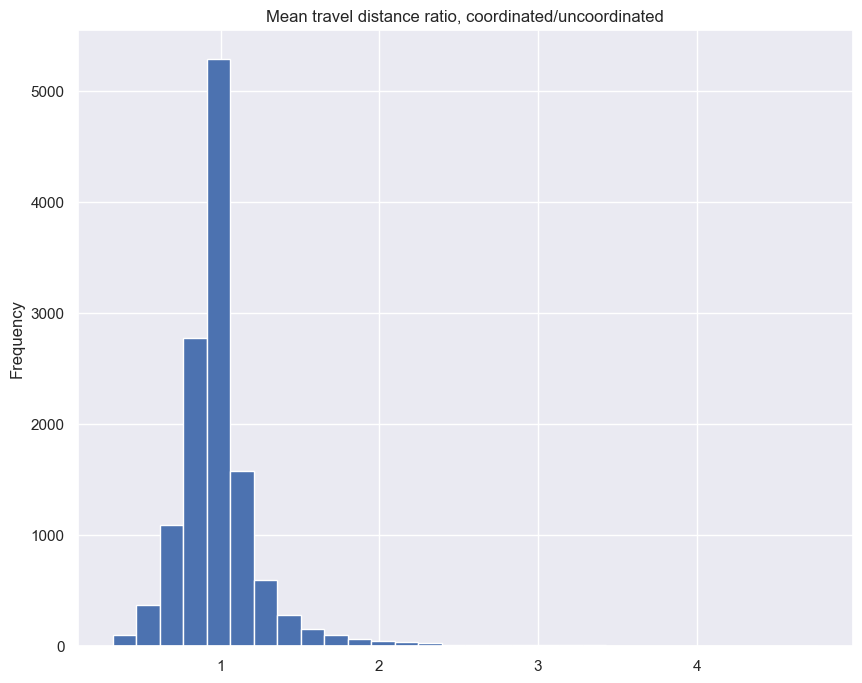

In [140]:
od_columns['mean_dist'] = mean_dist
plot('mean_dist')

In [141]:
od_df[od_df['oid']==151635727]['eid'].unique()

array(['ext_4'], dtype=object)

In [142]:
centroids[centroids['eid']=='ext_4']

,id,eid,name,type,percentage,geometry
79,151632049.0,ext_4,ext_4,from_to,nothing,POINT (-13571810.274 4507565.394)


In [143]:
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
79,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241
81,44.388216,317.837200,178.763933,3.918952,74.252867,190.034951,50.948261,3.919622,151634377,int_0,151635733,1.672806,0.597900,0.285003,1.000171
85,41.809689,148.246362,66.308671,1.721704,38.395220,161.413348,79.459261,1.721528,151634377,int_0,151635745,0.918333,1.088818,1.198324,0.999898
86,67.726652,245.259760,73.370328,4.614062,74.882053,215.135699,43.242914,4.474945,151634377,int_0,0,1.105651,0.877175,0.589379,0.969849
166,51.018652,621.714604,210.039434,8.810845,52.950571,610.861359,207.971480,8.984849,151634402,int_1,151635727,1.037867,0.982543,0.990154,1.019749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
546168,39.247670,272.716084,103.902120,2.973186,43.566268,223.479824,65.809634,2.704495,151635745,ext_10,151635600,1.110034,0.819460,0.633381,0.909628
546170,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069
546172,38.882711,193.086533,75.910481,2.085480,36.948646,215.872021,95.501427,2.215605,151635745,ext_10,151635666,0.950259,1.118007,1.258080,1.062396
546173,38.088003,313.202431,121.040948,3.313682,45.939318,227.497739,68.900265,2.903081,151635745,ext_10,151635689,1.206136,0.726360,0.569231,0.876089


In [144]:
od_df[od_df['oid']==151635727]

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
6875,44.448167,257.199941,127.462022,3.175574,64.037838,134.138906,27.244072,2.386102,151635727,ext_4,151634411,1.440731,0.521536,0.213743,0.751392
6876,37.320815,486.543143,228.874549,5.043941,68.332362,242.343616,30.470995,4.599975,151635727,ext_4,151634430,1.830945,0.498093,0.133134,0.911980
6877,67.588219,384.494704,52.424421,7.218698,73.579028,353.189121,21.118838,7.218698,151635727,ext_4,151634517,1.088637,0.918580,0.402844,1.000000
6878,61.204145,124.638857,14.300421,2.119004,58.075985,122.929957,22.015616,1.983133,151635727,ext_4,151634526,0.948890,0.986289,1.539508,0.935880
6879,65.992246,258.557063,74.314427,4.739656,75.695016,217.618974,33.027211,4.575742,151635727,ext_4,151634543,1.147029,0.841667,0.444425,0.965417
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
545654,32.598260,412.755326,233.611947,3.737529,30.535892,648.908108,427.854176,5.504163,151635727,ext_4,151635721,0.936734,1.572137,1.831474,1.472674
545657,54.290743,455.042178,140.823559,6.862383,48.777151,464.864668,172.919240,6.298548,151635727,ext_4,151635730,0.898443,1.021586,1.227914,0.917837
545658,62.024713,267.851414,98.425201,4.614835,69.476149,230.232331,62.882098,4.443238,151635727,ext_4,151635733,1.120137,0.859552,0.638882,0.962816
545661,100.137572,305.978434,17.218999,8.511094,100.487418,304.921195,16.195414,8.511318,151635727,ext_4,151635742,1.003494,0.996545,0.940555,1.000026


In [145]:
od_df = od_df.reset_index(drop=True)
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241
1,44.388216,317.837200,178.763933,3.918952,74.252867,190.034951,50.948261,3.919622,151634377,int_0,151635733,1.672806,0.597900,0.285003,1.000171
2,41.809689,148.246362,66.308671,1.721704,38.395220,161.413348,79.459261,1.721528,151634377,int_0,151635745,0.918333,1.088818,1.198324,0.999898
3,67.726652,245.259760,73.370328,4.614062,74.882053,215.135699,43.242914,4.474945,151634377,int_0,0,1.105651,0.877175,0.589379,0.969849
4,51.018652,621.714604,210.039434,8.810845,52.950571,610.861359,207.971480,8.984849,151634402,int_1,151635727,1.037867,0.982543,0.990154,1.019749
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13381,39.247670,272.716084,103.902120,2.973186,43.566268,223.479824,65.809634,2.704495,151635745,ext_10,151635600,1.110034,0.819460,0.633381,0.909628
13382,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069
13383,38.882711,193.086533,75.910481,2.085480,36.948646,215.872021,95.501427,2.215605,151635745,ext_10,151635666,0.950259,1.118007,1.258080,1.062396
13384,38.088003,313.202431,121.040948,3.313682,45.939318,227.497739,68.900265,2.903081,151635745,ext_10,151635689,1.206136,0.726360,0.569231,0.876089


In [146]:
# for each destination, find a matching oid, find the corresponding eid, and add it to the dataframe
od_df['destination_eid'] = od_df[['destination', 'eid']].merge(od_df.drop_duplicates('oid'), how='left', left_on='destination', right_on='oid')['eid_y']
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241,ext_4
1,44.388216,317.837200,178.763933,3.918952,74.252867,190.034951,50.948261,3.919622,151634377,int_0,151635733,1.672806,0.597900,0.285003,1.000171,ext_6
2,41.809689,148.246362,66.308671,1.721704,38.395220,161.413348,79.459261,1.721528,151634377,int_0,151635745,0.918333,1.088818,1.198324,0.999898,ext_10
3,67.726652,245.259760,73.370328,4.614062,74.882053,215.135699,43.242914,4.474945,151634377,int_0,0,1.105651,0.877175,0.589379,0.969849,NaN
4,51.018652,621.714604,210.039434,8.810845,52.950571,610.861359,207.971480,8.984849,151634402,int_1,151635727,1.037867,0.982543,0.990154,1.019749,ext_4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13381,39.247670,272.716084,103.902120,2.973186,43.566268,223.479824,65.809634,2.704495,151635745,ext_10,151635600,1.110034,0.819460,0.633381,0.909628,int_69
13382,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069,int_71
13383,38.882711,193.086533,75.910481,2.085480,36.948646,215.872021,95.501427,2.215605,151635745,ext_10,151635666,0.950259,1.118007,1.258080,1.062396,int_73
13384,38.088003,313.202431,121.040948,3.313682,45.939318,227.497739,68.900265,2.903081,151635745,ext_10,151635689,1.206136,0.726360,0.569231,0.876089,int_74


In [147]:
od_df.dropna(inplace=True)

In [148]:
centroids

,id,eid,name,type,percentage,geometry
0,151630699.0,int_0,int_0,from_to,nothing,POINT (-13573642.679 4512924.678)
1,151630724.0,int_1,int_1,from_to,nothing,POINT (-13575676.027 4515411.360)
2,151630733.0,int_2,int_2,from_to,nothing,POINT (-13571804.021 4510567.669)
3,151630752.0,int_3,int_3,from_to,nothing,POINT (-13571083.898 4513667.978)
4,151630839.0,int_4,int_4,from_to,nothing,POINT (-13574729.704 4513825.353)
...,...,...,...,...,...,...
81,151632055.0,ext_6,ext_6,from_to,nothing,POINT (-13575185.233 4510750.740)
82,151632058.0,ext_7,ext_7,from_to,nothing,POINT (-13576142.758 4514816.830)
83,151632061.0,ext_8,ext_8,from_to,nothing,POINT (-13574944.926 4516561.766)
84,151632064.0,ext_9,ext_9,from_to,nothing,POINT (-13571943.471 4516065.038)


In [149]:
od_df = od_df.merge(centroids[['eid', 'geometry']], on='eid').rename(columns={'geometry': 'geometry_o'})
od_df = od_df.merge(centroids[['eid', 'geometry']], left_on='destination_eid', right_on='eid').rename(columns={'geometry': 'geometry_d'})
# section_df = gpd.GeoDataFrame(section_df, geometry='geometry')

od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,eid_y,geometry_d
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241,ext_4,POINT (-13573642.679 4512924.678),ext_4,POINT (-13571810.274 4507565.394)
1,89.172549,265.972648,31.863778,6.588183,81.315393,291.288741,57.183318,6.579516,151634377,int_0,151635727,0.911888,1.095183,1.794618,0.998684,ext_4,POINT (-13573642.679 4512924.678),ext_4,POINT (-13571810.274 4507565.394)
2,76.966886,306.877376,58.773084,6.560943,62.932030,373.508004,125.150688,6.529338,151634377,int_0,151635727,0.817651,1.217125,2.129388,0.995183,ext_4,POINT (-13573642.679 4512924.678),ext_4,POINT (-13571810.274 4507565.394)
3,68.759229,345.092659,102.651440,6.591196,81.286639,292.955712,45.854055,6.614829,151634377,int_0,151635727,1.182192,0.848919,0.446697,1.003586,ext_4,POINT (-13573642.679 4512924.678),ext_4,POINT (-13571810.274 4507565.394)
4,59.327889,403.095394,117.259565,6.643000,62.085842,373.821127,118.218548,6.446944,151634377,int_0,151635727,1.046487,0.927376,1.008178,0.970487,ext_4,POINT (-13573642.679 4512924.678),ext_4,POINT (-13571810.274 4507565.394)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11019,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069,int_71,POINT (-13575933.355 4513673.488),int_71,POINT (-13575755.335 4513344.897)
11020,73.728056,199.538677,6.386270,4.086555,74.200332,198.269427,5.117020,4.086571,151635727,ext_4,151634698,1.006406,0.993639,0.801253,1.000004,int_15,POINT (-13571810.274 4507565.394),int_15,POINT (-13573567.244 4511633.931)
11021,73.728056,199.538677,6.386270,4.086555,74.200332,198.269427,5.117020,4.086571,151635727,ext_4,151634698,1.006406,0.993639,0.801253,1.000004,int_15,POINT (-13571810.274 4507565.394),int_15,POINT (-13573567.244 4511633.931)
11022,57.735316,332.248742,35.947074,5.328468,36.332241,370.056531,116.488827,3.734718,151635745,ext_10,151634698,0.629290,1.113794,3.240565,0.700899,int_15,POINT (-13575933.355 4513673.488),int_15,POINT (-13573567.244 4511633.931)


### Colored line plots

In [150]:
from shapely.geometry import Point, LineString, Polygon

od_df['geometry'] = od_df[['geometry_o', 'geometry_d']].apply(lambda *args: LineString(*args), axis=1)
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,eid_y,geometry_d,geometry
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241,ext_4,POINT (-13573642.679 4512924.678),ext_4,POINT (-13571810.274 4507565.394),LINESTRING (-13573642.67894201 4512924.6783126...
1,89.172549,265.972648,31.863778,6.588183,81.315393,291.288741,57.183318,6.579516,151634377,int_0,151635727,0.911888,1.095183,1.794618,0.998684,ext_4,POINT (-13573642.679 4512924.678),ext_4,POINT (-13571810.274 4507565.394),LINESTRING (-13573642.67894201 4512924.6783126...
2,76.966886,306.877376,58.773084,6.560943,62.932030,373.508004,125.150688,6.529338,151634377,int_0,151635727,0.817651,1.217125,2.129388,0.995183,ext_4,POINT (-13573642.679 4512924.678),ext_4,POINT (-13571810.274 4507565.394),LINESTRING (-13573642.67894201 4512924.6783126...
3,68.759229,345.092659,102.651440,6.591196,81.286639,292.955712,45.854055,6.614829,151634377,int_0,151635727,1.182192,0.848919,0.446697,1.003586,ext_4,POINT (-13573642.679 4512924.678),ext_4,POINT (-13571810.274 4507565.394),LINESTRING (-13573642.67894201 4512924.6783126...
4,59.327889,403.095394,117.259565,6.643000,62.085842,373.821127,118.218548,6.446944,151634377,int_0,151635727,1.046487,0.927376,1.008178,0.970487,ext_4,POINT (-13573642.679 4512924.678),ext_4,POINT (-13571810.274 4507565.394),LINESTRING (-13573642.67894201 4512924.6783126...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11019,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069,int_71,POINT (-13575933.355 4513673.488),int_71,POINT (-13575755.335 4513344.897),LINESTRING (-13575933.35501098 4513673.4879506...
11020,73.728056,199.538677,6.386270,4.086555,74.200332,198.269427,5.117020,4.086571,151635727,ext_4,151634698,1.006406,0.993639,0.801253,1.000004,int_15,POINT (-13571810.274 4507565.394),int_15,POINT (-13573567.244 4511633.931),LINESTRING (-13571810.27421508 4507565.3940086...
11021,73.728056,199.538677,6.386270,4.086555,74.200332,198.269427,5.117020,4.086571,151635727,ext_4,151634698,1.006406,0.993639,0.801253,1.000004,int_15,POINT (-13571810.274 4507565.394),int_15,POINT (-13573567.244 4511633.931),LINESTRING (-13571810.27421508 4507565.3940086...
11022,57.735316,332.248742,35.947074,5.328468,36.332241,370.056531,116.488827,3.734718,151635745,ext_10,151634698,0.629290,1.113794,3.240565,0.700899,int_15,POINT (-13575933.355 4513673.488),int_15,POINT (-13573567.244 4511633.931),LINESTRING (-13575933.35501098 4513673.4879506...


In [151]:
od_df.rename(columns={'eid_x': 'eid'})
del od_df['eid_y']
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,geometry_d,geometry
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241,ext_4,POINT (-13573642.679 4512924.678),POINT (-13571810.274 4507565.394),LINESTRING (-13573642.67894201 4512924.6783126...
1,89.172549,265.972648,31.863778,6.588183,81.315393,291.288741,57.183318,6.579516,151634377,int_0,151635727,0.911888,1.095183,1.794618,0.998684,ext_4,POINT (-13573642.679 4512924.678),POINT (-13571810.274 4507565.394),LINESTRING (-13573642.67894201 4512924.6783126...
2,76.966886,306.877376,58.773084,6.560943,62.932030,373.508004,125.150688,6.529338,151634377,int_0,151635727,0.817651,1.217125,2.129388,0.995183,ext_4,POINT (-13573642.679 4512924.678),POINT (-13571810.274 4507565.394),LINESTRING (-13573642.67894201 4512924.6783126...
3,68.759229,345.092659,102.651440,6.591196,81.286639,292.955712,45.854055,6.614829,151634377,int_0,151635727,1.182192,0.848919,0.446697,1.003586,ext_4,POINT (-13573642.679 4512924.678),POINT (-13571810.274 4507565.394),LINESTRING (-13573642.67894201 4512924.6783126...
4,59.327889,403.095394,117.259565,6.643000,62.085842,373.821127,118.218548,6.446944,151634377,int_0,151635727,1.046487,0.927376,1.008178,0.970487,ext_4,POINT (-13573642.679 4512924.678),POINT (-13571810.274 4507565.394),LINESTRING (-13573642.67894201 4512924.6783126...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11019,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069,int_71,POINT (-13575933.355 4513673.488),POINT (-13575755.335 4513344.897),LINESTRING (-13575933.35501098 4513673.4879506...
11020,73.728056,199.538677,6.386270,4.086555,74.200332,198.269427,5.117020,4.086571,151635727,ext_4,151634698,1.006406,0.993639,0.801253,1.000004,int_15,POINT (-13571810.274 4507565.394),POINT (-13573567.244 4511633.931),LINESTRING (-13571810.27421508 4507565.3940086...
11021,73.728056,199.538677,6.386270,4.086555,74.200332,198.269427,5.117020,4.086571,151635727,ext_4,151634698,1.006406,0.993639,0.801253,1.000004,int_15,POINT (-13571810.274 4507565.394),POINT (-13573567.244 4511633.931),LINESTRING (-13571810.27421508 4507565.3940086...
11022,57.735316,332.248742,35.947074,5.328468,36.332241,370.056531,116.488827,3.734718,151635745,ext_10,151634698,0.629290,1.113794,3.240565,0.700899,int_15,POINT (-13575933.355 4513673.488),POINT (-13573567.244 4511633.931),LINESTRING (-13575933.35501098 4513673.4879506...


In [152]:
od_df = gpd.GeoDataFrame(od_df, geometry='geometry')
od_df.crs = 'EPSG:3857'
od_df

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,geometry_d,geometry
0,92.354351,257.477739,24.204354,6.605330,93.440063,254.547249,21.282066,6.606920,151634377,int_0,151635727,1.011756,0.988618,0.879266,1.000241,ext_4,POINT (-13573642.679 4512924.678),POINT (-13571810.274 4507565.394),"LINESTRING (-13573642.679 4512924.678, -135718..."
1,89.172549,265.972648,31.863778,6.588183,81.315393,291.288741,57.183318,6.579516,151634377,int_0,151635727,0.911888,1.095183,1.794618,0.998684,ext_4,POINT (-13573642.679 4512924.678),POINT (-13571810.274 4507565.394),"LINESTRING (-13573642.679 4512924.678, -135718..."
2,76.966886,306.877376,58.773084,6.560943,62.932030,373.508004,125.150688,6.529338,151634377,int_0,151635727,0.817651,1.217125,2.129388,0.995183,ext_4,POINT (-13573642.679 4512924.678),POINT (-13571810.274 4507565.394),"LINESTRING (-13573642.679 4512924.678, -135718..."
3,68.759229,345.092659,102.651440,6.591196,81.286639,292.955712,45.854055,6.614829,151634377,int_0,151635727,1.182192,0.848919,0.446697,1.003586,ext_4,POINT (-13573642.679 4512924.678),POINT (-13571810.274 4507565.394),"LINESTRING (-13573642.679 4512924.678, -135718..."
4,59.327889,403.095394,117.259565,6.643000,62.085842,373.821127,118.218548,6.446944,151634377,int_0,151635727,1.046487,0.927376,1.008178,0.970487,ext_4,POINT (-13573642.679 4512924.678),POINT (-13571810.274 4507565.394),"LINESTRING (-13573642.679 4512924.678, -135718..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11019,55.183013,23.320849,3.579845,0.357476,54.411089,23.416811,3.675807,0.353926,151635745,ext_10,151635648,0.986012,1.004115,1.026806,0.990069,int_71,POINT (-13575933.355 4513673.488),POINT (-13575755.335 4513344.897),"LINESTRING (-13575933.355 4513673.488, -135757..."
11020,73.728056,199.538677,6.386270,4.086555,74.200332,198.269427,5.117020,4.086571,151635727,ext_4,151634698,1.006406,0.993639,0.801253,1.000004,int_15,POINT (-13571810.274 4507565.394),POINT (-13573567.244 4511633.931),"LINESTRING (-13571810.274 4507565.394, -135735..."
11021,73.728056,199.538677,6.386270,4.086555,74.200332,198.269427,5.117020,4.086571,151635727,ext_4,151634698,1.006406,0.993639,0.801253,1.000004,int_15,POINT (-13571810.274 4507565.394),POINT (-13573567.244 4511633.931),"LINESTRING (-13571810.274 4507565.394, -135735..."
11022,57.735316,332.248742,35.947074,5.328468,36.332241,370.056531,116.488827,3.734718,151635745,ext_10,151634698,0.629290,1.113794,3.240565,0.700899,int_15,POINT (-13575933.355 4513673.488),POINT (-13573567.244 4511633.931),"LINESTRING (-13575933.355 4513673.488, -135735..."


In [153]:
od_df.groupby(['eid_x', 'destination_eid']).size().reset_index(name='num_trips')

,eid_x,destination_eid,num_trips
0,ext_1,ext_4,25
1,ext_1,ext_9,25
2,ext_1,int_0,22
3,ext_1,int_1,17
4,ext_1,int_11,18
...,...,...,...
977,int_8,ext_5,4
978,int_8,ext_6,16
979,int_8,ext_7,13
980,int_8,ext_8,6


In [154]:
od_df.groupby(['eid_x', 'destination_eid']).mean().reset_index()

,eid_x,destination_eid,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio
0,ext_1,ext_4,48.778798,163.210490,90.817489,2.031444,43.952550,252.945667,165.505013,2.415006,151635718.0,151635727.0,0.876795,1.513957,1.738668,1.256130
1,ext_1,ext_9,45.897654,938.253990,467.775647,11.639565,55.066129,713.964463,311.547435,10.234456,151635718.0,151635742.0,1.202926,0.766853,0.656375,0.887088
2,ext_1,int_0,42.222810,696.284381,350.523937,7.803327,46.873261,652.416028,314.718960,7.658269,151635718.0,151634377.0,1.153515,1.015517,1.119017,0.988610
3,ext_1,int_1,42.837020,881.051748,368.189862,10.270667,53.762363,671.771139,210.657794,9.886921,151635718.0,151634402.0,1.275272,0.779363,0.645384,0.966218
4,ext_1,int_11,49.920756,732.876440,351.234659,9.590928,55.575417,633.052848,247.120805,9.455386,151635718.0,151634638.0,1.131676,0.886696,0.739487,0.986128
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
977,int_8,ext_5,41.474406,422.262595,138.913396,4.846292,40.608153,413.596639,148.840636,4.500638,151634607.0,151635730.0,0.974287,0.968125,1.115570,0.929363
978,int_8,ext_6,35.815211,430.338663,178.979433,4.256666,47.642079,291.834330,77.698932,3.809383,151634607.0,151635733.0,1.340021,0.693158,0.464618,0.908174
979,int_8,ext_7,38.006582,578.057284,184.488285,6.022252,47.639776,483.553452,89.352698,6.232451,151634607.0,151635736.0,1.265474,0.854452,0.565628,1.043727
980,int_8,ext_8,38.503184,528.822492,166.538630,5.620882,44.095882,401.022795,94.617479,4.857950,151634607.0,151635739.0,1.151096,0.769952,0.574692,0.873260


In [155]:
od_df.sort_values('speed_ratio')

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,eid_x,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,destination_eid,geometry_o,geometry_d,geometry
6387,52.009781,36.916287,14.346550,0.533336,8.225835,215.329987,193.439180,0.492019,151635718,ext_1,151635184,0.158159,5.832926,13.483324,0.922532,int_40,POINT (-13573357.287 4507368.344),POINT (-13572918.959 4507635.081),"LINESTRING (-13573357.287 4507368.344, -135729..."
5699,37.883461,74.362924,30.601468,0.782535,8.250994,394.377134,338.342388,0.903890,151635718,ext_1,151634562,0.217799,5.303411,11.056410,1.155080,int_7,POINT (-13573357.287 4507368.344),POINT (-13572372.811 4507834.274),"LINESTRING (-13573357.287 4507368.344, -135723..."
9462,63.876114,374.569241,125.949314,6.646119,14.896568,1405.546844,1065.855779,5.816062,151635718,ext_1,151634377,0.233210,3.752435,8.462577,0.875107,int_0,POINT (-13573357.287 4507368.344),POINT (-13573642.679 4512924.678),"LINESTRING (-13573357.287 4507368.344, -135736..."
10454,67.229622,116.652424,15.002786,2.178472,17.495358,496.675849,390.024873,2.413756,151635742,ext_9,151634638,0.260233,4.257741,25.996829,1.108004,int_11,POINT (-13571943.471 4516065.038),POINT (-13573577.591 4515653.766),"LINESTRING (-13571943.471 4516065.038, -135735..."
2651,35.917647,263.277528,119.356940,2.626753,9.573000,559.803973,465.101531,1.488612,151634562,int_7,151635718,0.266526,2.126288,3.896728,0.566712,ext_1,POINT (-13572372.811 4507834.274),POINT (-13573357.287 4507368.344),"LINESTRING (-13572372.811 4507834.274, -135733..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7335,12.176857,730.345283,596.739574,2.470364,49.578521,165.764565,30.490371,2.282878,151635727,ext_4,151635521,4.071537,0.226967,0.051095,0.924106,int_64,POINT (-13571810.274 4507565.394),POINT (-13571781.462 4509754.072),"LINESTRING (-13571810.274 4507565.394, -135717..."
1953,11.013664,237.776870,197.781711,0.727443,45.750390,113.296209,30.851096,1.439818,151634657,int_12,151635745,4.153966,0.476481,0.155986,1.979287,ext_10,POINT (-13575266.503 4512778.827),POINT (-13575933.355 4513673.488),"LINESTRING (-13575266.503 4512778.827, -135759..."
8791,16.703130,1330.476381,1004.486340,6.173089,69.632313,437.830810,119.356119,8.468659,151635718,ext_1,151635245,4.168818,0.329078,0.118823,1.371867,int_44,POINT (-13573357.287 4507368.344),POINT (-13571885.279 4514440.909),"LINESTRING (-13573357.287 4507368.344, -135718..."
7798,12.699611,649.457161,537.074759,2.291070,58.350632,144.991283,40.555221,2.350093,151635727,ext_4,151634526,4.594679,0.223250,0.075511,1.025762,int_5,POINT (-13571810.274 4507565.394),POINT (-13572314.239 4509632.728),"LINESTRING (-13571810.274 4507565.394, -135723..."


Below is a big plot that takes a while to run. Instead, I've decided to split into subplots and save them individually.

In [156]:
# fig, axs = plt.subplots(4, 2, figsize=(15,30))
# fig.suptitle('Relative OD aggregated over time')
# for i in range(4):
#     for j in range(2):
#         ax, metric = axs[i][j], od_columns[['speed', 'ttime', 'dtime', 'mean_dist'][i]]
#         suffix = ['_uncoordinated', '_coordinated'][j]
#         taz_int.plot(ax=ax, color='#353535', zorder=0)
#         taz_int.boundary.plot(ax=ax, color='black', zorder=1)
#         od_df.sort_values(by=metric.name+suffix).plot(
#             ax=ax, column=metric.name+suffix, legend=(j==1), cmap='hot', lw=0.3, zorder=2)
#         # node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)
#         ax.set_title(f'{metric.desc} {suffix[1:]} ({metric.unit})')
#         ax.axis('off')

# plt.subplots_adjust(wspace=-.7)
# plt.show()

<AxesSubplot:>

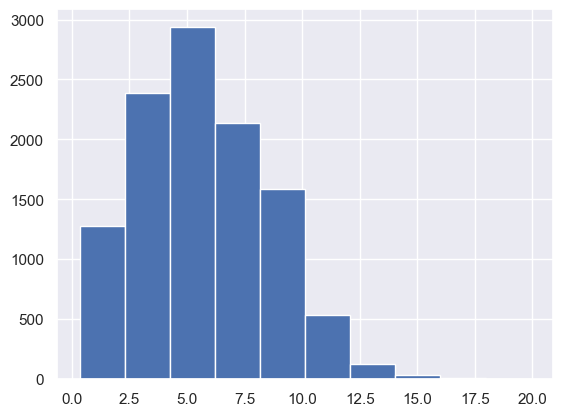

In [157]:
od_df['mean_dist_uncoordinated'].hist()

In [158]:
bounds = {
    'speed': (0, 100),
    'ttime': (0, 1200),
    'dtime': (0, 600),
    'mean_dist': (0, 15)
}

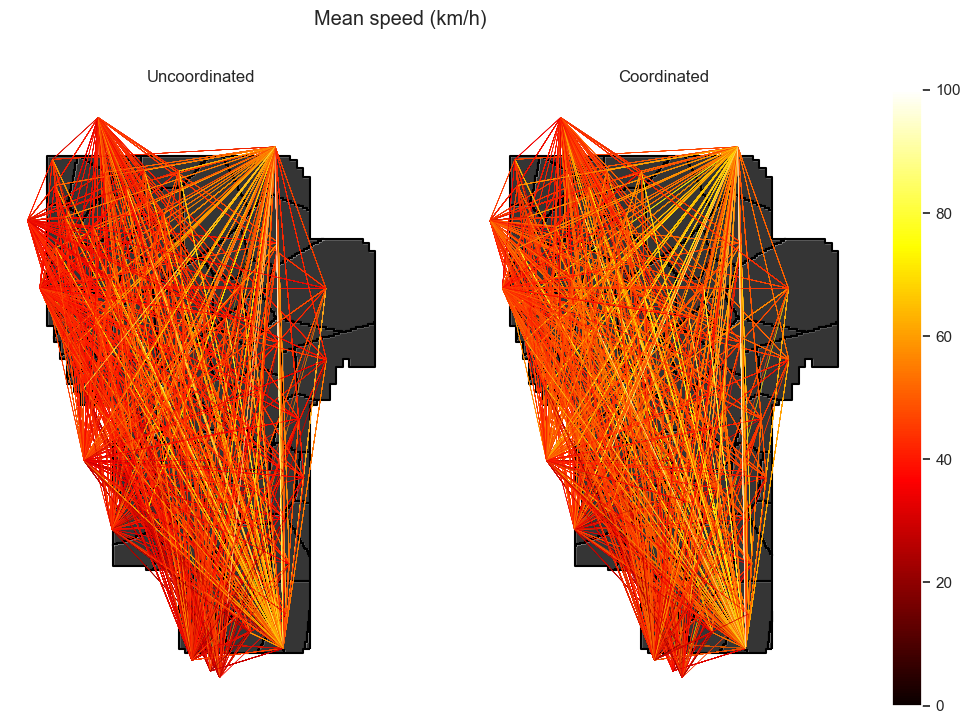

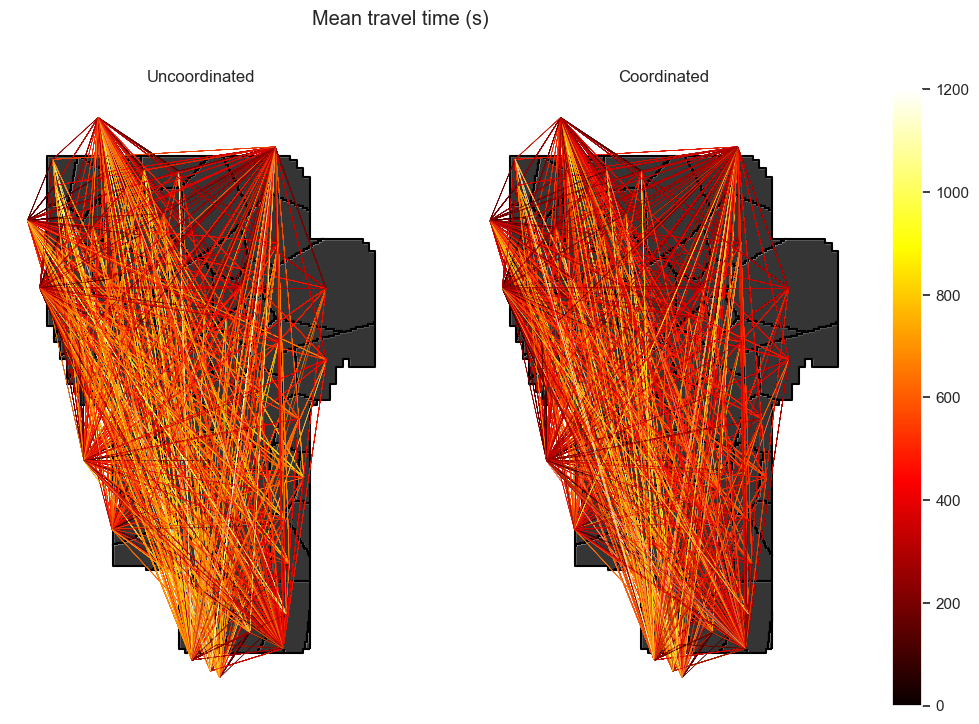

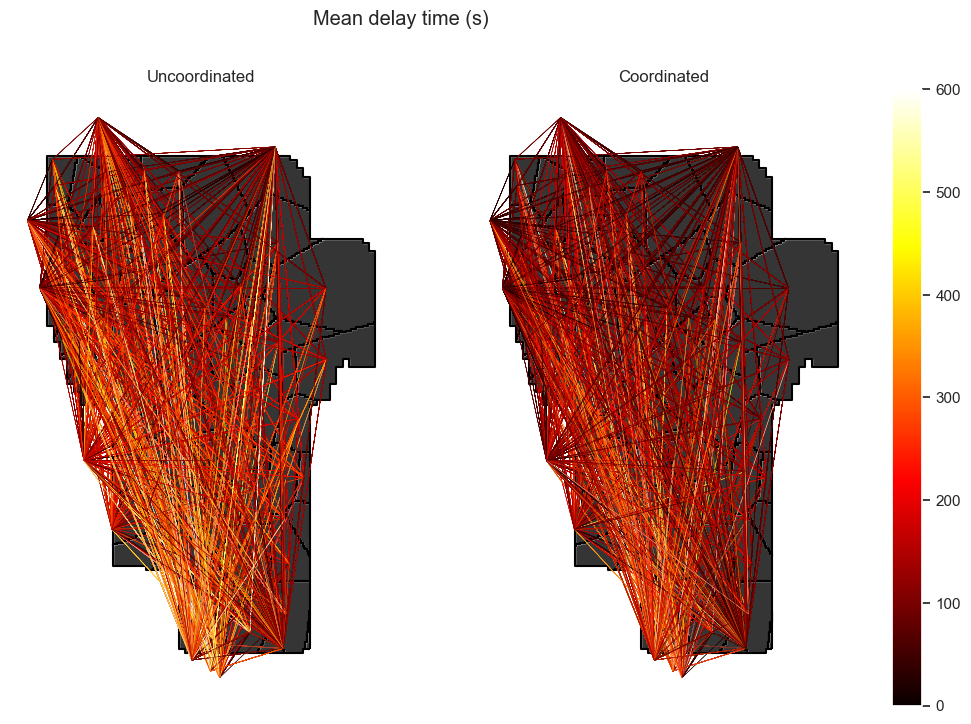

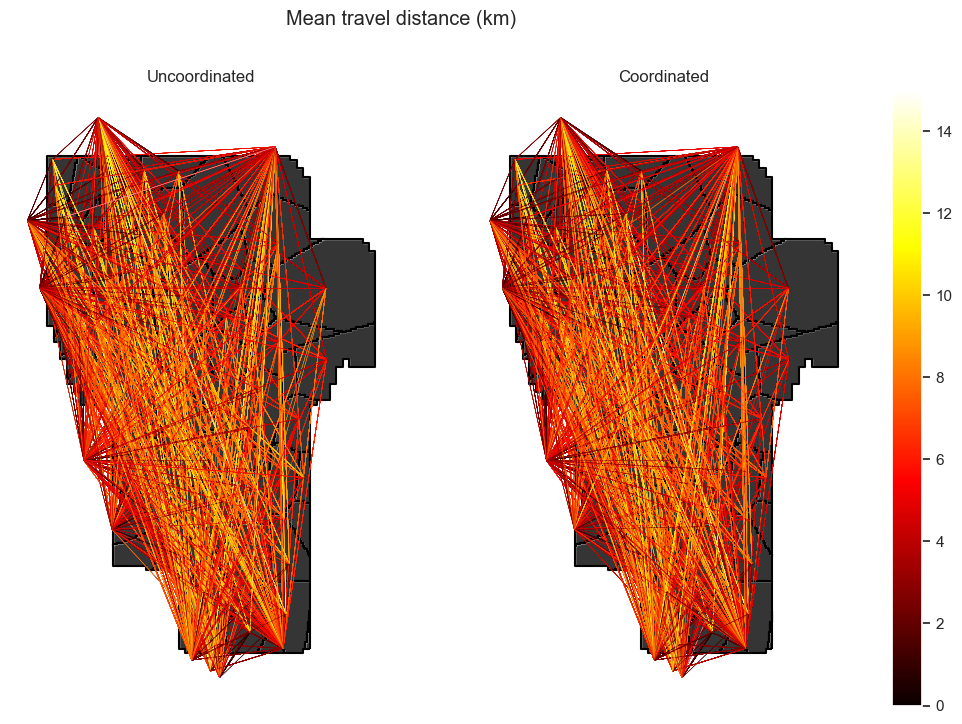

In [159]:
for i in range(4):
    fig, axs = plt.subplots(1, 2, figsize=(15, 8))
    metric = od_columns[['speed', 'ttime', 'dtime', 'mean_dist'][i]]
    fig.suptitle(f'{metric.desc} ({metric.unit})')
    vmin, vmax = bounds[metric.name]

    for j in range(2):
        suffix = ['_uncoordinated', '_coordinated'][j]
        label = [uncoordinated_description, coordinated_description][j]
        ax = axs[j]
        taz_int.plot(ax=ax, color='#353535', zorder=0)
        taz_int.boundary.plot(ax=ax, color='black', zorder=1)
        od_df.sample(frac=1).plot(
            ax=ax, column=metric.name+suffix, legend=(j==1), cmap='hot', lw=0.3, vmin=vmin, vmax=vmax, zorder=2)
        ax.set_title(label)
        ax.axis('off')

    plt.subplots_adjust(wspace=-0.4)
    plt.savefig(f'{image_path}/centroid-{metric.name}.png',
        bbox_inches='tight', pad_inches=0)
    plt.show()

In [160]:
def plot(metric_name):
    metric_data = od_df[f'{metric_name}_ratio']
    low, high = metric_data.quantile(0.001), metric_data.quantile(0.999)
    metric_data[(low<=metric_data) & (metric_data<=high)].plot.hist(bins=30, figsize=(10, 8))
    plt.title(f'{od_columns[metric_name].desc} ratio, coordinated/uncoordinated')

### Mostly vs fully coordinated inverse ratio plotting

Inverted to emphasize that red = bad and blue = good, to visually assess how bad the mostly coordinated scenario is.

In [161]:
centroid_means = gpd.GeoDataFrame(od_df.groupby('eid_x').mean().merge(centroids[['eid', 'geometry']], left_index=True, right_on='eid'), geometry='geometry')
centroid_means = centroid_means.to_crs('EPSG:3857')
centroid_means

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,destination,speed_ratio,ttime_ratio,dtime_ratio,mean_dist_ratio,eid,geometry
76,38.828924,650.967109,325.769012,6.826690,44.374979,533.123678,240.818517,6.328535,151635718.0,1.516351e+08,1.172451,0.887936,0.867647,0.958913,ext_1,POINT (-13573357.287 4507368.344)
85,42.213261,368.214284,136.658388,4.157226,46.021085,323.480231,107.032848,3.887940,151635745.0,1.516350e+08,1.123175,0.900602,1.249128,0.957123,ext_10,POINT (-13575933.355 4513673.488)
77,34.420461,737.395646,406.625817,7.161495,41.253420,561.639923,264.795018,6.676186,151635721.0,1.516354e+08,1.238211,0.920147,0.907025,1.004813,ext_2,POINT (-13573042.528 4507181.778)
78,38.011534,644.318020,307.940911,6.697399,44.397417,523.996907,216.994978,6.213313,151635724.0,1.516351e+08,1.198585,0.835755,0.731008,0.965176,ext_3,POINT (-13572885.333 4507072.584)
79,61.957094,391.825973,114.651732,6.426830,64.173197,358.990042,100.482444,6.051122,151635727.0,1.516351e+08,1.073900,0.947997,1.220083,0.963343,ext_4,POINT (-13571810.274 4507565.394)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7,42.677424,476.879765,232.152863,5.325098,48.442879,419.090872,174.799417,5.200180,151634562.0,1.516357e+08,1.174038,0.995381,0.980735,1.074863,int_7,POINT (-13572372.811 4507834.274)
71,46.892980,469.995050,162.632641,5.834911,56.145992,332.408422,116.884020,5.056215,151635648.0,1.516357e+08,1.195388,0.752604,0.835313,0.891518,int_71,POINT (-13575755.335 4513344.897)
73,43.963928,582.303090,216.500205,7.029474,45.768883,570.903604,221.229881,6.771226,151635666.0,1.516357e+08,1.066644,0.974965,1.117357,0.969881,int_73,POINT (-13575027.500 4514704.241)
74,45.447648,492.788529,174.251742,6.019404,47.918337,448.060254,145.887187,5.729355,151635689.0,1.516357e+08,1.081227,0.980293,1.165080,0.993035,int_74,POINT (-13572521.812 4513700.187)


In [162]:
for metric_name in ['speed', 'ttime', 'dtime', 'mean_dist']:
    centroid_means[metric_name + '_ratio_inv'] = centroid_means[metric_name + '_uncoordinated'] / centroid_means[metric_name + '_coordinated']
    centroid_means[metric_name + '_diff_inv'] = centroid_means[metric_name + '_uncoordinated'] - centroid_means[metric_name + '_coordinated']

centroid_means

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,destination,...,eid,geometry,speed_ratio_inv,speed_diff_inv,ttime_ratio_inv,ttime_diff_inv,dtime_ratio_inv,dtime_diff_inv,mean_dist_ratio_inv,mean_dist_diff_inv
76,38.828924,650.967109,325.769012,6.826690,44.374979,533.123678,240.818517,6.328535,151635718.0,1.516351e+08,...,ext_1,POINT (-13573357.287 4507368.344),0.875018,-5.546055,1.221043,117.843431,1.352757,84.950494,1.078716,0.498155
85,42.213261,368.214284,136.658388,4.157226,46.021085,323.480231,107.032848,3.887940,151635745.0,1.516350e+08,...,ext_10,POINT (-13575933.355 4513673.488),0.917259,-3.807824,1.138290,44.734052,1.276789,29.625539,1.069262,0.269286
77,34.420461,737.395646,406.625817,7.161495,41.253420,561.639923,264.795018,6.676186,151635721.0,1.516354e+08,...,ext_2,POINT (-13573042.528 4507181.778),0.834366,-6.832959,1.312933,175.755723,1.535625,141.830800,1.072693,0.485310
78,38.011534,644.318020,307.940911,6.697399,44.397417,523.996907,216.994978,6.213313,151635724.0,1.516351e+08,...,ext_3,POINT (-13572885.333 4507072.584),0.856165,-6.385883,1.229622,120.321113,1.419115,90.945933,1.077911,0.484086
79,61.957094,391.825973,114.651732,6.426830,64.173197,358.990042,100.482444,6.051122,151635727.0,1.516351e+08,...,ext_4,POINT (-13571810.274 4507565.394),0.965467,-2.216103,1.091468,32.835932,1.141013,14.169288,1.062089,0.375708
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7,42.677424,476.879765,232.152863,5.325098,48.442879,419.090872,174.799417,5.200180,151634562.0,1.516357e+08,...,int_7,POINT (-13572372.811 4507834.274),0.880984,-5.765454,1.137891,57.788893,1.328110,57.353446,1.024022,0.124918
71,46.892980,469.995050,162.632641,5.834911,56.145992,332.408422,116.884020,5.056215,151635648.0,1.516357e+08,...,int_71,POINT (-13575755.335 4513344.897),0.835197,-9.253012,1.413908,137.586628,1.391402,45.748621,1.154008,0.778696
73,43.963928,582.303090,216.500205,7.029474,45.768883,570.903604,221.229881,6.771226,151635666.0,1.516357e+08,...,int_73,POINT (-13575027.500 4514704.241),0.960564,-1.804955,1.019967,11.399486,0.978621,-4.729676,1.038139,0.258248
74,45.447648,492.788529,174.251742,6.019404,47.918337,448.060254,145.887187,5.729355,151635689.0,1.516357e+08,...,int_74,POINT (-13572521.812 4513700.187),0.948440,-2.470689,1.099826,44.728274,1.194428,28.364554,1.050625,0.290049


In [163]:
affected_nodes = [16827, 27954, 27938, 27921]
# intersection of Mission Blvd with Paseo Padre Pkwy, Stanford Ave, Antelope Dr, Durham Rd respectively
affected_nodes = node_geo_city[node_geo_city['id'].isin(affected_nodes)]
affected_nodes

,id,eid,name,nodetype,geometry
564,16827.0,16827,None,1.0,POINT (-13572014.586 4509083.227)
786,27921.0,27921,None,1.0,POINT (-13571998.362 4510939.503)
787,27938.0,27938,None,1.0,POINT (-13572042.835 4509961.853)
788,27954.0,27954,None,1.0,POINT (-13572015.059 4509319.677)


In [164]:
taz_int

,label,CentroidID,geometry
0,1,int_1,"POLYGON ((-13574693.310 4511182.575, -13574685..."
1,2,int_2,"POLYGON ((-13575263.903 4515899.194, -13575241..."
2,3,int_3,"POLYGON ((-13571924.319 4514045.983, -13571924..."
3,4,int_4,"POLYGON ((-13574417.875 4514354.829, -13574417..."
4,5,int_5,"POLYGON ((-13572503.180 4509723.099, -13572503..."
...,...,...,...
67,79,int_79,"POLYGON ((-13574195.236 4515000.626, -13574195..."
68,81,int_81,"POLYGON ((-13574640.402 4510873.822, -13574640..."
69,82,int_82,"POLYGON ((-13571701.680 4509695.175, -13571701..."
70,84,int_84,"POLYGON ((-13572547.708 4513709.071, -13572569..."


In [165]:
centroid_means

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,destination,...,eid,geometry,speed_ratio_inv,speed_diff_inv,ttime_ratio_inv,ttime_diff_inv,dtime_ratio_inv,dtime_diff_inv,mean_dist_ratio_inv,mean_dist_diff_inv
76,38.828924,650.967109,325.769012,6.826690,44.374979,533.123678,240.818517,6.328535,151635718.0,1.516351e+08,...,ext_1,POINT (-13573357.287 4507368.344),0.875018,-5.546055,1.221043,117.843431,1.352757,84.950494,1.078716,0.498155
85,42.213261,368.214284,136.658388,4.157226,46.021085,323.480231,107.032848,3.887940,151635745.0,1.516350e+08,...,ext_10,POINT (-13575933.355 4513673.488),0.917259,-3.807824,1.138290,44.734052,1.276789,29.625539,1.069262,0.269286
77,34.420461,737.395646,406.625817,7.161495,41.253420,561.639923,264.795018,6.676186,151635721.0,1.516354e+08,...,ext_2,POINT (-13573042.528 4507181.778),0.834366,-6.832959,1.312933,175.755723,1.535625,141.830800,1.072693,0.485310
78,38.011534,644.318020,307.940911,6.697399,44.397417,523.996907,216.994978,6.213313,151635724.0,1.516351e+08,...,ext_3,POINT (-13572885.333 4507072.584),0.856165,-6.385883,1.229622,120.321113,1.419115,90.945933,1.077911,0.484086
79,61.957094,391.825973,114.651732,6.426830,64.173197,358.990042,100.482444,6.051122,151635727.0,1.516351e+08,...,ext_4,POINT (-13571810.274 4507565.394),0.965467,-2.216103,1.091468,32.835932,1.141013,14.169288,1.062089,0.375708
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7,42.677424,476.879765,232.152863,5.325098,48.442879,419.090872,174.799417,5.200180,151634562.0,1.516357e+08,...,int_7,POINT (-13572372.811 4507834.274),0.880984,-5.765454,1.137891,57.788893,1.328110,57.353446,1.024022,0.124918
71,46.892980,469.995050,162.632641,5.834911,56.145992,332.408422,116.884020,5.056215,151635648.0,1.516357e+08,...,int_71,POINT (-13575755.335 4513344.897),0.835197,-9.253012,1.413908,137.586628,1.391402,45.748621,1.154008,0.778696
73,43.963928,582.303090,216.500205,7.029474,45.768883,570.903604,221.229881,6.771226,151635666.0,1.516357e+08,...,int_73,POINT (-13575027.500 4514704.241),0.960564,-1.804955,1.019967,11.399486,0.978621,-4.729676,1.038139,0.258248
74,45.447648,492.788529,174.251742,6.019404,47.918337,448.060254,145.887187,5.729355,151635689.0,1.516357e+08,...,int_74,POINT (-13572521.812 4513700.187),0.948440,-2.470689,1.099826,44.728274,1.194428,28.364554,1.050625,0.290049


In [166]:
centroid_means_regions = gpd.GeoDataFrame(centroid_means.merge(taz_int, how='left', left_on='eid', right_on='CentroidID'), geometry='geometry_y')
centroid_means_regions.loc[centroid_means_regions['geometry_y'].isna(), 'geometry_y'] = centroid_means_regions['geometry_x']
centroid_means_regions

,speed_uncoordinated,ttime_uncoordinated,dtime_uncoordinated,mean_dist_uncoordinated,speed_coordinated,ttime_coordinated,dtime_coordinated,mean_dist_coordinated,oid,destination,...,speed_diff_inv,ttime_ratio_inv,ttime_diff_inv,dtime_ratio_inv,dtime_diff_inv,mean_dist_ratio_inv,mean_dist_diff_inv,label,CentroidID,geometry_y
0,38.828924,650.967109,325.769012,6.826690,44.374979,533.123678,240.818517,6.328535,151635718.0,1.516351e+08,...,-5.546055,1.221043,117.843431,1.352757,84.950494,1.078716,0.498155,NaN,NaN,POINT (-13573357.287 4507368.344)
1,42.213261,368.214284,136.658388,4.157226,46.021085,323.480231,107.032848,3.887940,151635745.0,1.516350e+08,...,-3.807824,1.138290,44.734052,1.276789,29.625539,1.069262,0.269286,NaN,NaN,POINT (-13575933.355 4513673.488)
2,34.420461,737.395646,406.625817,7.161495,41.253420,561.639923,264.795018,6.676186,151635721.0,1.516354e+08,...,-6.832959,1.312933,175.755723,1.535625,141.830800,1.072693,0.485310,NaN,NaN,POINT (-13573042.528 4507181.778)
3,38.011534,644.318020,307.940911,6.697399,44.397417,523.996907,216.994978,6.213313,151635724.0,1.516351e+08,...,-6.385883,1.229622,120.321113,1.419115,90.945933,1.077911,0.484086,NaN,NaN,POINT (-13572885.333 4507072.584)
4,61.957094,391.825973,114.651732,6.426830,64.173197,358.990042,100.482444,6.051122,151635727.0,1.516351e+08,...,-2.216103,1.091468,32.835932,1.141013,14.169288,1.062089,0.375708,NaN,NaN,POINT (-13571810.274 4507565.394)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61,42.677424,476.879765,232.152863,5.325098,48.442879,419.090872,174.799417,5.200180,151634562.0,1.516357e+08,...,-5.765454,1.137891,57.788893,1.328110,57.353446,1.024022,0.124918,7.0,int_7,"POLYGON ((-13572837.026 4507927.101, -13572814..."
62,46.892980,469.995050,162.632641,5.834911,56.145992,332.408422,116.884020,5.056215,151635648.0,1.516357e+08,...,-9.253012,1.413908,137.586628,1.391402,45.748621,1.154008,0.778696,71.0,int_71,"POLYGON ((-13575442.014 4512165.170, -13575419..."
63,43.963928,582.303090,216.500205,7.029474,45.768883,570.903604,221.229881,6.771226,151635666.0,1.516357e+08,...,-1.804955,1.019967,11.399486,0.978621,-4.729676,1.038139,0.258248,73.0,int_73,"POLYGON ((-13572213.749 4507534.408, -13572213..."
64,45.447648,492.788529,174.251742,6.019404,47.918337,448.060254,145.887187,5.729355,151635689.0,1.516357e+08,...,-2.470689,1.099826,44.728274,1.194428,28.364554,1.050625,0.290049,74.0,int_74,"POLYGON ((-13573104.305 4509330.198, -13573104..."


In [167]:
centroid_means[['dtime_uncoordinated', 'dtime_coordinated', 'dtime_ratio_inv', 'dtime_diff_inv']]

,dtime_uncoordinated,dtime_coordinated,dtime_ratio_inv,dtime_diff_inv
76,325.769012,240.818517,1.352757,84.950494
85,136.658388,107.032848,1.276789,29.625539
77,406.625817,264.795018,1.535625,141.830800
78,307.940911,216.994978,1.419115,90.945933
79,114.651732,100.482444,1.141013,14.169288
...,...,...,...,...
7,232.152863,174.799417,1.328110,57.353446
71,162.632641,116.884020,1.391402,45.748621
73,216.500205,221.229881,0.978621,-4.729676
74,174.251742,145.887187,1.194428,28.364554


Determining bounds


    speed:
        lower: -9.04038652098657
        upper: 0.9636570339754513
        mean:  -3.73167619805618
    


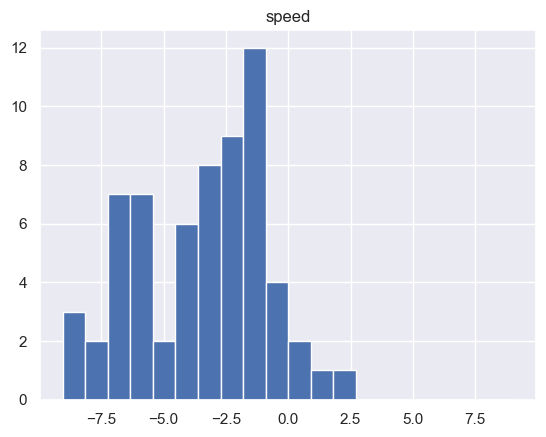


    ttime:
        lower: -50.08088485672218
        upper: 144.82466373896133
        mean:  41.167481644720475
    


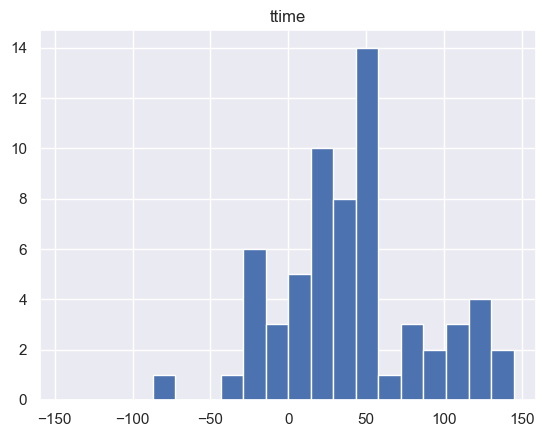


    dtime:
        lower: -29.80955056449049
        upper: 111.00244180962784
        mean:  29.603637837773
    


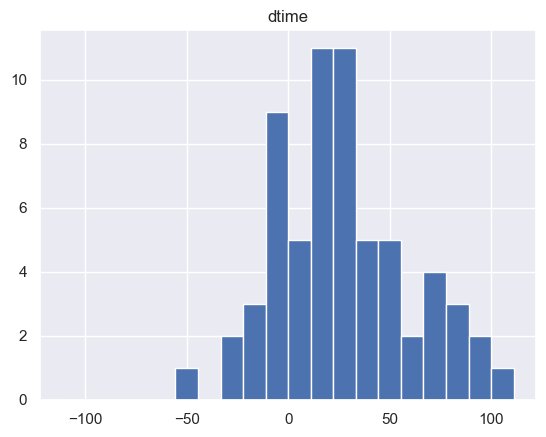


    mean_dist:
        lower: -0.6632826331607494
        upper: 0.6186715135256814
        mean:  0.12261460582591129
    


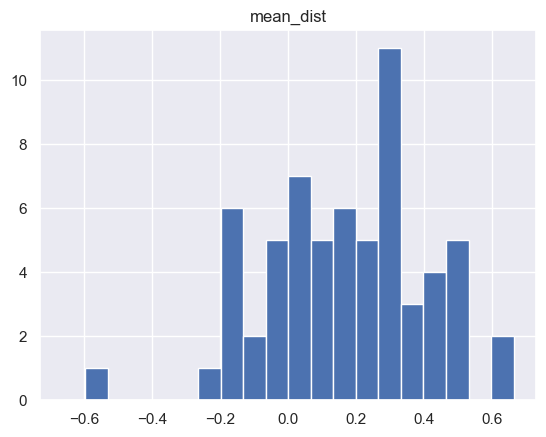

In [183]:
outlier_cutoff = 0.025

for k in ['speed', 'ttime', 'dtime', 'mean_dist']:
    lower = centroid_means[k + '_diff_inv'].quantile(outlier_cutoff)
    upper = centroid_means[k + '_diff_inv'].quantile(1 - outlier_cutoff)
    mean = centroid_means[k + '_diff_inv'].mean()
    graph_bound = max(abs(lower), abs(upper))
    print(f'''
    {k}:
        lower: {lower}
        upper: {upper}
        mean:  {mean}
    ''')
    centroid_means[k + '_diff_inv'].hist(range=[-graph_bound,graph_bound], bins=20)
    plt.title(k)
    plt.show()

Plots

In [185]:
mostly_vs_fully_todo = {
    'speed': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (km/h), mostly coordinated - fully coordinated', -6, 6)],
    'ttime': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (s), mostly coordinated - fully coordinated', -125, 125)], 
    'dtime': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (s), mostly coordinated - fully coordinated', -50, 50)], 
    'mean_dist': 
        [('_ratio_inv', 'ratio, mostly coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (km), mostly coordinated - fully coordinated', -0.5, 0.5)]
}

fully_vs_fully_todo = {
    'speed': 
        [('_ratio_inv', 'ratio, fully coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (km/h), fully coordinated - fully coordinated', -9, 9)],
    'ttime': 
        [('_ratio_inv', 'ratio, fully coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (s), fully coordinated - fully coordinated', -145, 145)], 
    'dtime': 
        [('_ratio_inv', 'ratio, fully coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (s), fully coordinated - fully coordinated', -111, 111)], 
    'mean_dist': 
        [('_ratio_inv', 'ratio, fully coordinated / fully coordinated', 0.5, 1.5),
         ('_diff_inv', 'difference (km), fully coordinated - fully coordinated', -0.66, 0.66)]
}

### CHANGE THIS

In [170]:
todo = fully_vs_fully_todo

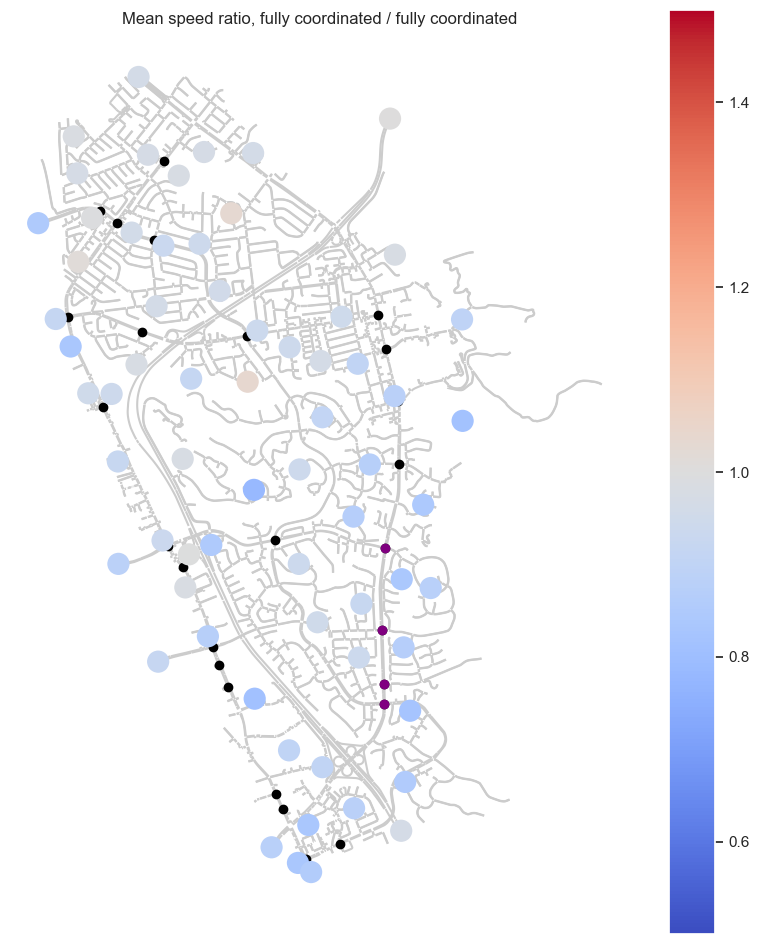

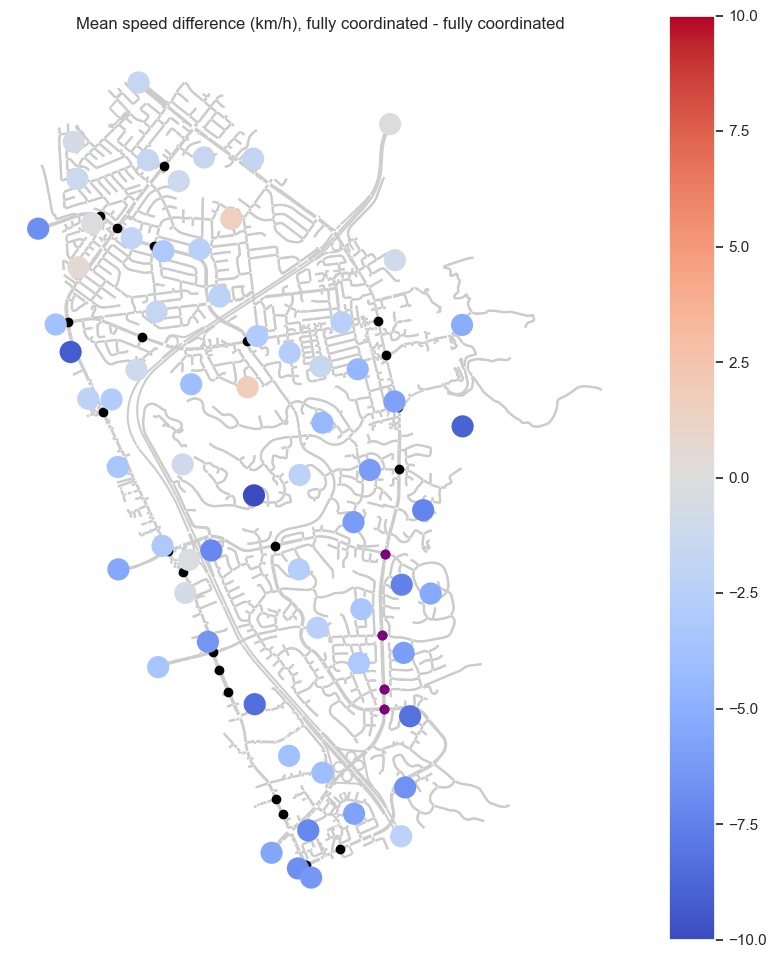

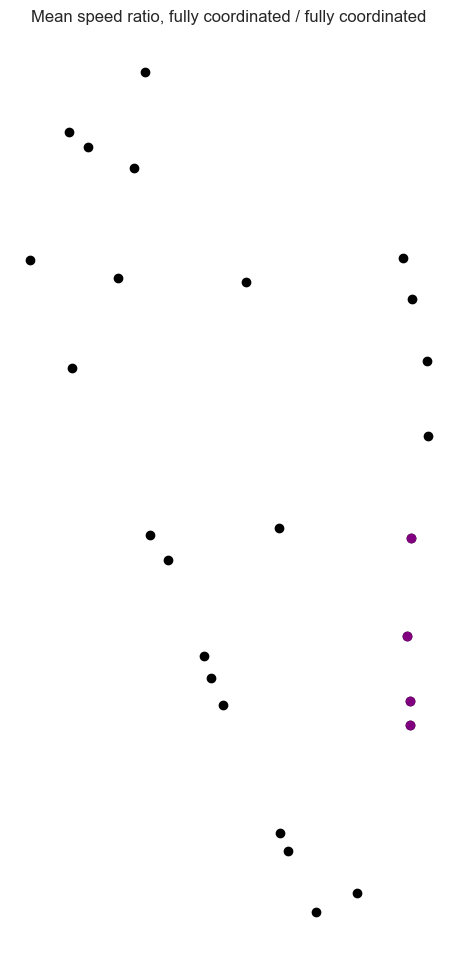

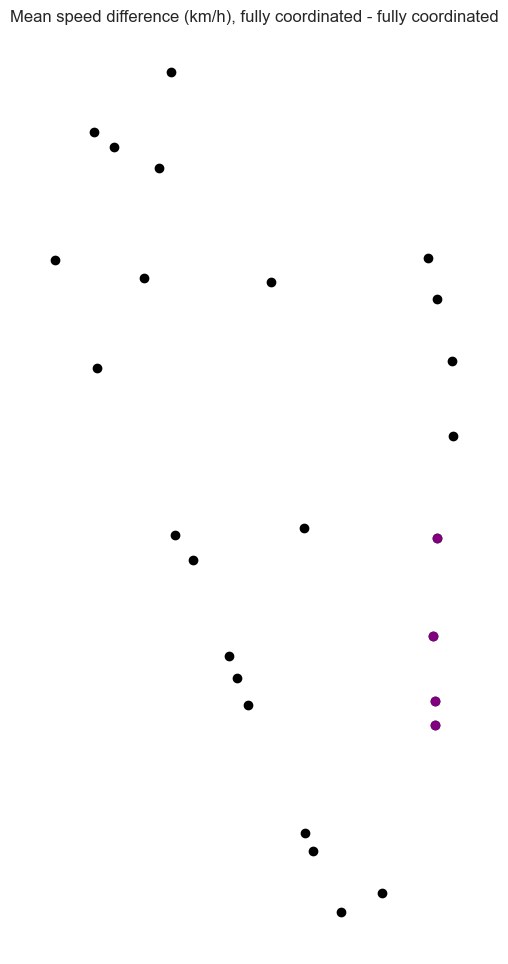

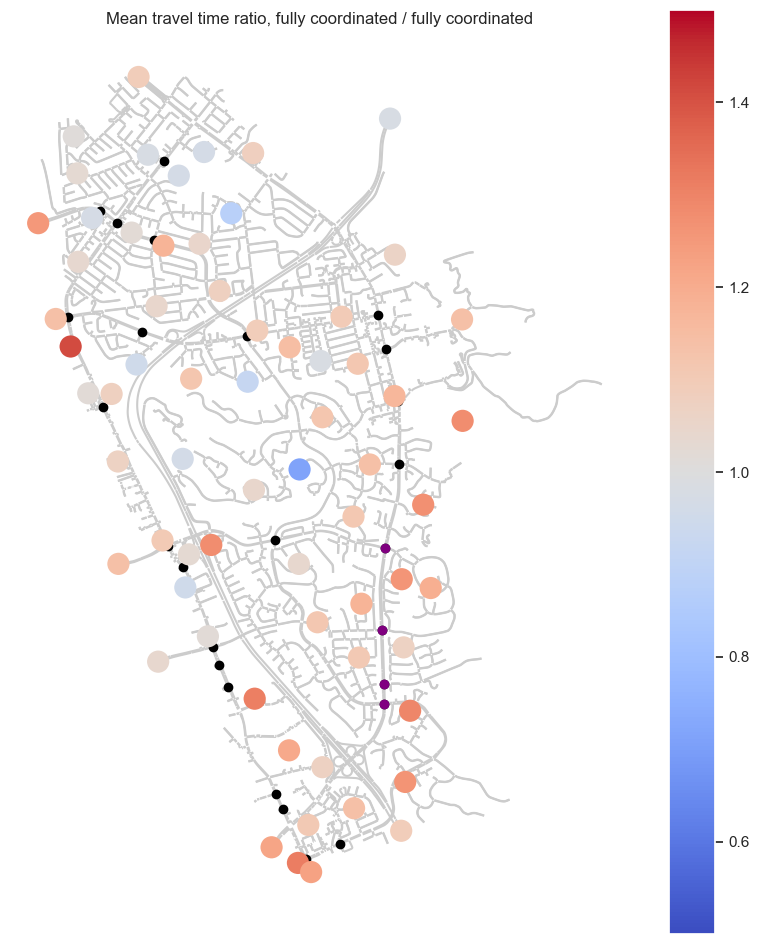

...

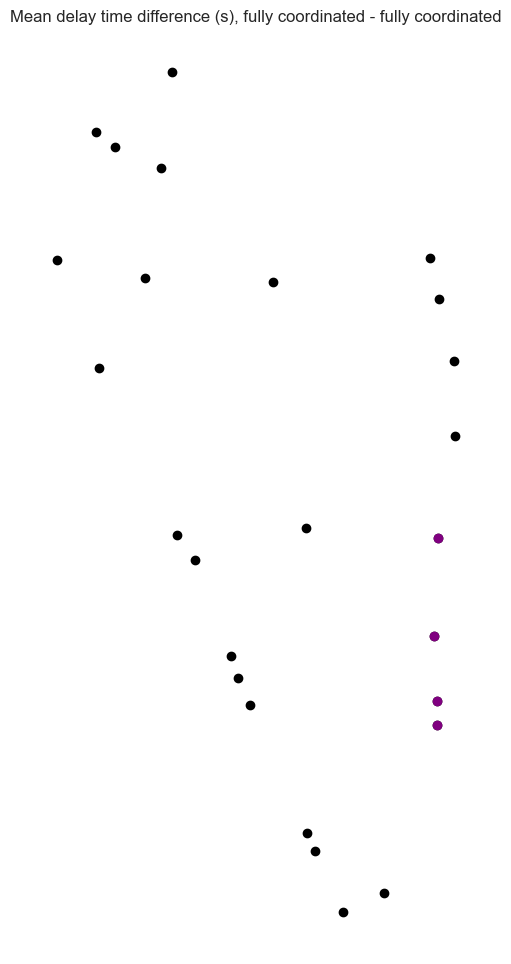

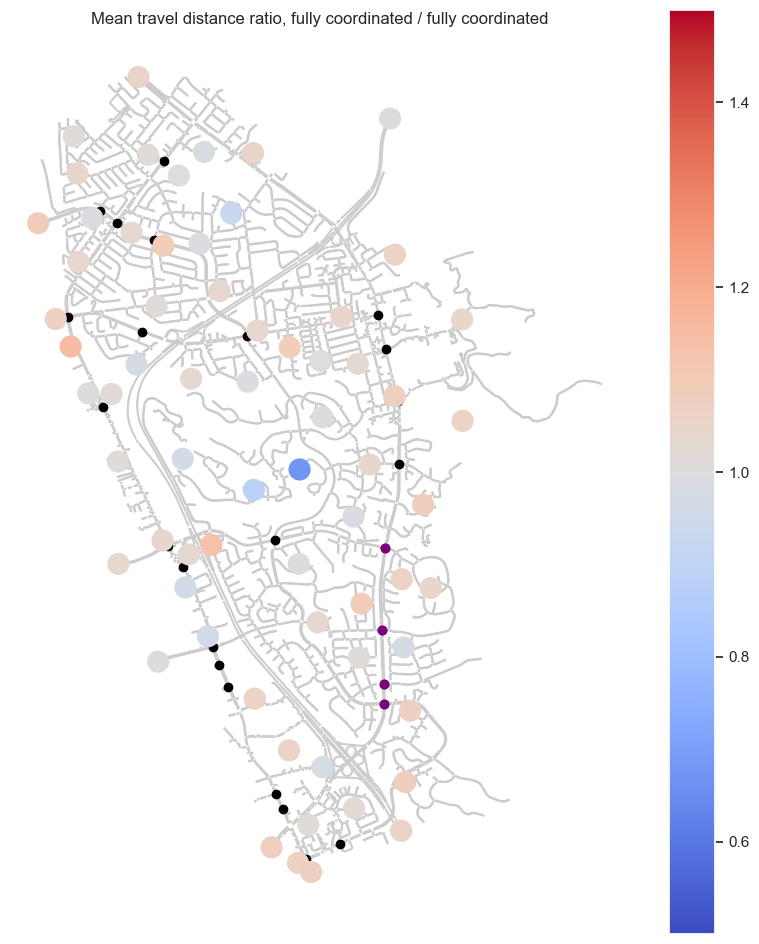

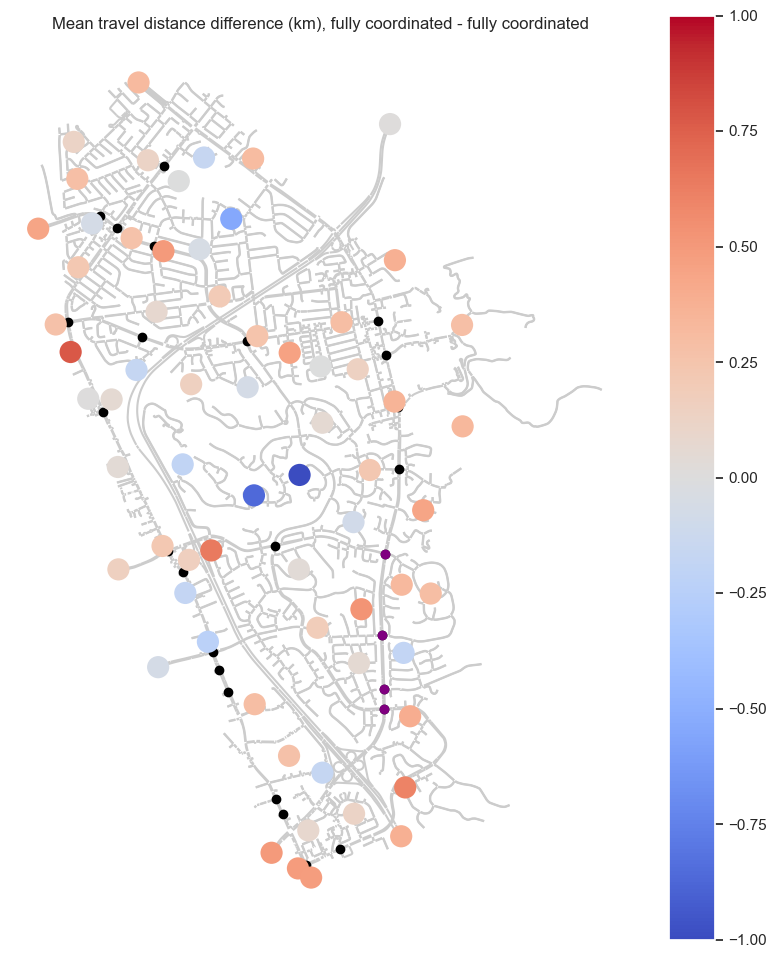

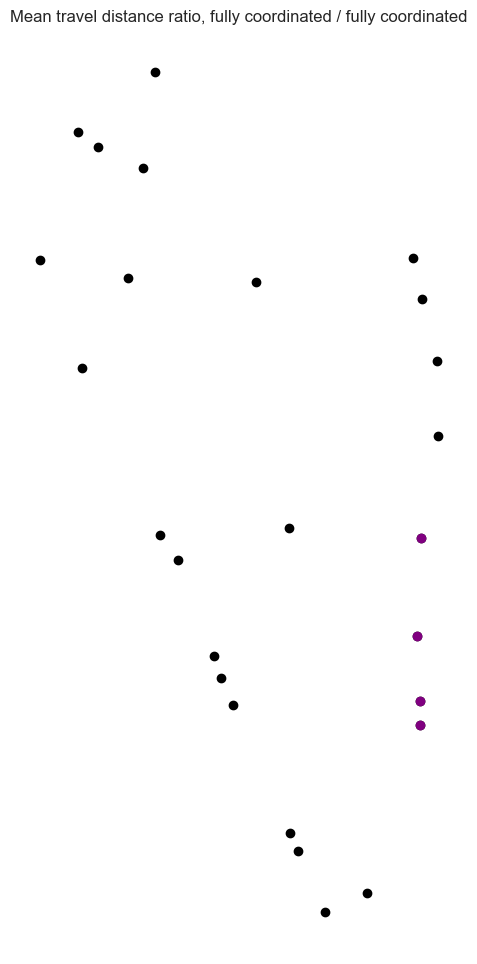

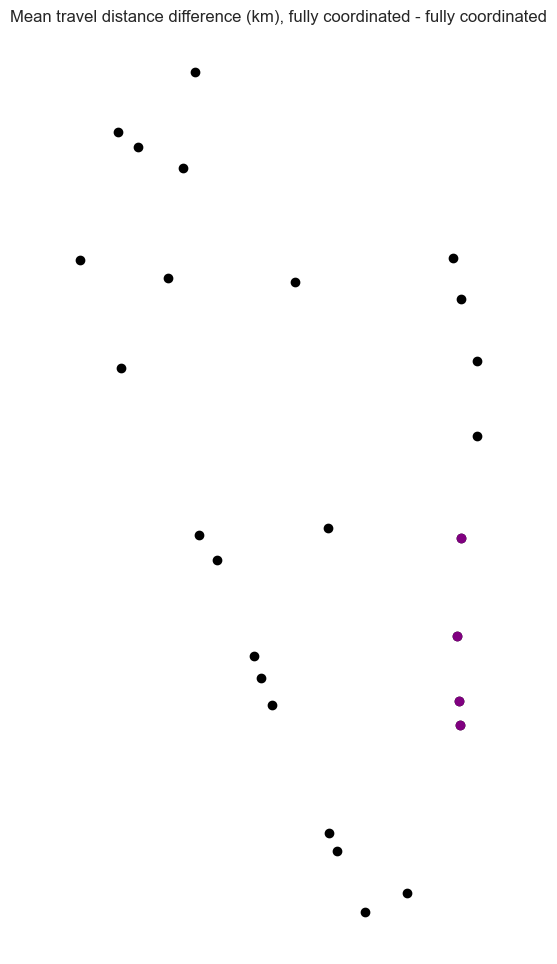

In [186]:
plt.rc('font', size=40)

for metric_name in todo.keys():
    for shade_regions in [False, True]:
        metric = od_columns[metric_name]
        for suffix, desc, vmin, vmax in todo[metric_name]:
            fig, ax = plt.subplots(1, 1, figsize=(10, 12))
            ax.axis('off')
            node_geo_city.plot(ax=ax, lw=1, color='black', zorder=1)
            affected_nodes.plot(ax=ax, lw=1, color='purple', zorder=3)
            if shade_regions:
                pass
                # sections.plot(ax=ax, color='0.55', zorder=0)
                # centroid_means_regions.plot(ax=ax, column=metric_name + suffix, legend=True, cmap='coolwarm', lw=2, vmin=vmin, vmax=vmax, zorder=-1)
            else:
                sections.plot(ax=ax, color='0.8', zorder=0)
                centroid_means.plot(ax=ax, column=metric_name + suffix, legend=True, cmap='coolwarm', lw=10, vmin=vmin, vmax=vmax, zorder=2)
            
            plt.rcParams.update({'font.size': 40})
            plt.title(f'{metric.desc} {desc}', wrap=True)
            plt.savefig(f'{image_path}/{metric_name + suffix}' + ('_taz' if shade_regions else '') + '.png',
                bbox_inches='tight', pad_inches=0)
            plt.show()

<AxesSubplot:>

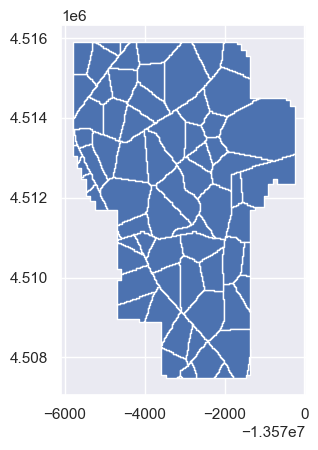

In [172]:
taz_int.plot()

<a id='trajectory'></a>
# Trajectories

In [173]:
uncoordinated_trajectory_query = pd.read_sql('SELECT * FROM MIVEHTRAJECTORY', uncoordinated_con)
uncoordinated_trajectory_df = pd.DataFrame(uncoordinated_trajectory_query)

uncoordinated_trajectory_df.head()

,did,oid,sid,origin,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance,pathType
0,151642198,29,151590242,151635727,151635718,0,6.10353,7.08379,113.863,0.0,6.64191,2212.92,None
1,151642198,31,151590242,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.43640,8492.55,None
2,151642198,37,151590242,151635727,151635718,0,7.27708,11.04290,116.603,0.0,10.52080,2206.16,None
3,151642198,56,151590242,151635742,151635727,0,9.94191,9.94191,294.713,0.0,6.19638,8641.66,None
4,151642198,72,151590242,151635742,151635727,0,16.18860,16.18860,331.451,0.0,3.21501,8656.73,None


In [174]:
uncoordinated_trajectory_df

,did,oid,sid,origin,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance,pathType
0,151642198,29,151590242,151635727,151635718,0,6.10353,7.08379,113.863,0.0,6.64191,2212.92,None
1,151642198,31,151590242,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.43640,8492.55,None
2,151642198,37,151590242,151635727,151635718,0,7.27708,11.04290,116.603,0.0,10.52080,2206.16,None
3,151642198,56,151590242,151635742,151635727,0,9.94191,9.94191,294.713,0.0,6.19638,8641.66,None
4,151642198,72,151590242,151635742,151635727,0,16.18860,16.18860,331.451,0.0,3.21501,8656.73,None
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3068,151642198,91275,151590242,151635727,151635742,0,21241.10000,21241.30000,21557.700,0.0,5.30547,8502.56,None
3069,151642198,91278,151590242,151635742,151635727,0,21241.50000,21241.50000,21539.100,0.0,18.28580,8635.38,None
3070,151642198,91280,151590242,151635727,151635742,0,21241.70000,21241.90000,21538.900,0.0,12.03300,8490.61,None
3071,151642198,91290,151590242,151635742,151635727,0,21245.40000,21245.40000,21543.200,0.0,16.28200,8632.46,None


In [175]:
uncoordinated_detailed_trajectory_query = pd.read_sql('SELECT * FROM MIVEHDETAILEDTRAJECTORY', uncoordinated_con)
uncoordinated_detailed_trajectory_df = pd.DataFrame(uncoordinated_detailed_trajectory_query)

uncoordinated_detailed_trajectory_df.head()

,did,oid,ent,sectionId,laneIndex,xCoord,yCoord,stationaryTime,speed,travelledDistance,acceleration
0,151642198,29,1,3400,1,595671.15,4149769.75,7.08379,105.59,3.41,0.0
1,151642198,29,2,3400,1,595660.26,4149790.54,7.20000,105.59,26.87,0.0
2,151642198,29,3,3400,1,595649.38,4149811.32,8.00000,105.59,50.34,0.0
3,151642198,29,4,3400,1,595638.5,4149832.11,8.80000,105.59,73.8,0.0
4,151642198,29,5,2752,1,595629.09,4149852.68,9.60000,105.59,97.26,0.0


In [176]:
uncoordinated_trajectory_df.head()

,did,oid,sid,origin,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance,pathType
0,151642198,29,151590242,151635727,151635718,0,6.10353,7.08379,113.863,0.0,6.64191,2212.92,None
1,151642198,31,151590242,151635727,151635742,0,6.40615,7.37098,272.465,0.0,1.43640,8492.55,None
2,151642198,37,151590242,151635727,151635718,0,7.27708,11.04290,116.603,0.0,10.52080,2206.16,None
3,151642198,56,151590242,151635742,151635727,0,9.94191,9.94191,294.713,0.0,6.19638,8641.66,None
4,151642198,72,151590242,151635742,151635727,0,16.18860,16.18860,331.451,0.0,3.21501,8656.73,None


In [177]:
coordinated_trajectory_query = pd.read_sql('SELECT * FROM MIVEHTRAJECTORY', coordinated_con)
coordinated_trajectory_df = pd.DataFrame(coordinated_trajectory_query)

coordinated_trajectory_df.head()

,did,oid,sid,origin,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance,pathType
0,151642198,29,151590242,151635727,151635718,0,6.10353,7.08379,113.863,0.0,6.64191,2212.92,None
1,151642198,31,151590242,151635727,151635742,0,6.40615,7.37098,272.448,0.0,1.42955,8492.55,None
2,151642198,37,151590242,151635727,151635718,0,7.27708,11.04290,116.603,0.0,10.52080,2206.16,None
3,151642198,56,151590242,151635742,151635727,0,9.94191,9.94191,294.264,0.0,5.69052,8629.10,None
4,151642198,72,151590242,151635742,151635727,0,16.18860,16.18860,337.770,0.0,9.37387,8658.64,None


In [178]:
coordinated_detailed_trajectory_query = pd.read_sql('SELECT * FROM MIVEHDETAILEDTRAJECTORY', coordinated_con)
coordinated_detailed_trajectory_df = pd.DataFrame(coordinated_detailed_trajectory_query)

coordinated_detailed_trajectory_df.head()

KeyboardInterrupt: 

In [ ]:
def od_demand(df):
    return df.groupby(['origin', 'destination']).size().reset_index(name='freq').sort_values(by='freq', ascending=False)

od_demand(uncoordinated_trajectory_df)

,origin,destination,freq
8,151635727,151635742,993
15,151635742,151635727,790
13,151635742,151635718,452
1,151635718,151635742,354
4,151635727,151635718,118
0,151635718,151635727,105
17,151635742,151635733,69
3,151635721,151635742,62
10,151635730,151635742,42
12,151635733,151635742,37


In [ ]:
od_demand(coordinated_trajectory_df)

,origin,destination,freq
8,151635727,151635742,993
15,151635742,151635727,791
13,151635742,151635718,438
1,151635718,151635742,360
4,151635727,151635718,119
0,151635718,151635727,112
17,151635742,151635733,70
3,151635721,151635742,63
10,151635730,151635742,50
12,151635733,151635742,33


In [ ]:
od_df[od_df['oid']==151635727]['eid_x'].unique()[0]

'ext_4'

In [ ]:
dfs_traj = {
    'uncoordinated': uncoordinated_detailed_trajectory_df.merge(uncoordinated_trajectory_df, how='left', on='oid'),
    'coordinated': coordinated_detailed_trajectory_df.merge(coordinated_trajectory_df, how='left', on='oid')
}

top_pairs_oid = [
    (151635727, 151635742),
    (151635742, 151635727),
    (151635742, 151635718),
    (151635718, 151635742),
    (151635727, 151635718),
    (151635718, 151635727),
]

dfs_traj_top = {}

def astype_per_column(df, columns, dtype):
    for col in columns:
        df[col] = df[col].astype(dtype)

for k in dfs_traj:
    for p in top_pairs_oid:
        o_oid, d_oid = p
        o_eid = od_df[od_df['oid']==o_oid]['eid_x'].unique()[0]
        d_eid = od_df[od_df['oid']==d_oid]['eid_x'].unique()[0]
        key = f'{o_eid}_{d_eid}_{k}'
        dfs_traj_top[key] = dfs_traj[k][(dfs_traj[k]['origin']==o_oid) & (dfs_traj[k]['destination']==d_oid)]
        astype_per_column(dfs_traj_top[key], ['xCoord', 'yCoord'], float)

dfs_traj_top['ext_4_ext_9_uncoordinated'].head()


C:\Users\prest\AppData\Local\Temp\ipykernel_15468\3593673711.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = df[col].astype(dtype)


KeyboardInterrupt: 

In [ ]:
for k, df in dfs_traj_top.items():
    dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)
    print(dfs_traj_top[k].head())

# dfs_traj_top['ext_4_ext_9_uncoordinated'].head()

C:\Users\prest\AppData\Local\Temp\ipykernel_15468\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


         did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
136  151642198   31    1       3400          3  595659.46  4149779.13   
137  151642198   31    2       3400          3  595649.35  4149798.44   
138  151642198   31    3       3400          3  595639.24  4149817.75   
139  151642198   31    4       3400          3  595629.13  4149837.07   
140  151642198   31    5       2752          4  595617.68  4149854.48   

     stationaryTime  speed travelledDistance_x  ... destination  \
136         7.37098  98.09               17.14  ...   151635742   
137         8.00000  98.09               38.94  ...   151635742   
138         8.80000  98.09               60.73  ...   151635742   
139         9.60000  98.12               82.54  ...   151635742   
140        10.40000  98.09              104.34  ...   151635742   

     entranceSection  generationTime  entranceTime  exitTime  \
136                0         6.40615       7.37098   272.465   
137                0         6

C:\Users\prest\AppData\Local\Temp\ipykernel_15468\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


         did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
603  151642198   56    1  151597045          3  595480.40  4156431.96   
604  151642198   56    2  151597045          3  595473.64  4156415.28   
605  151642198   56    3       2873          3  595466.41  4156398.18   
606  151642198   56    4       2873          3  595459.66  4156380.40   
607  151642198   56    5       2873          3  595452.66  4156362.26   

     stationaryTime  speed travelledDistance_x  ... destination  \
603         9.94191  81.58               10.38  ...   151635727   
604        10.40000  80.38               28.38  ...   151635727   
605        11.20000  83.59               46.95  ...   151635727   
606        12.00000  85.58               65.97  ...   151635727   
607        12.80000  87.51               85.42  ...   151635727   

     entranceSection  generationTime  entranceTime  exitTime  \
603                0         9.94191       9.94191   294.713   
604                0         9

C:\Users\prest\AppData\Local\Temp\ipykernel_15468\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


          did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
7688  151642198  617    1  151597045          2  595473.45  4156422.79   
7689  151642198  617    2  151597051          0  595464.12  4156400.62   
7690  151642198  617    3       2873          2  595455.58  4156378.18   
7691  151642198  617    4       2873          2  595447.00  4156355.73   
7692  151642198  617    5       2873          2  595439.37  4156332.94   

      stationaryTime   speed travelledDistance_x  ... destination  \
7688         158.487  108.46               21.49  ...   151635718   
7689         159.200  108.06               45.55  ...   151635718   
7690         160.000  108.06               69.56  ...   151635718   
7691         160.800  108.14               93.59  ...   151635718   
7692         161.600  108.21              117.64  ...   151635718   

      entranceSection  generationTime  entranceTime  exitTime  \
7688                0         158.487       158.487   512.439   
7689      

C:\Users\prest\AppData\Local\Temp\ipykernel_15468\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


          did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
1738  151642198   87    1      30451          2  594493.95  4149597.27   
1739  151642198   87    2      30451          2  594504.12  4149612.15   
1740  151642198   87    3      41482          0  594514.28  4149627.04   
1741  151642198   87    4      31086          2  594525.00  4149641.52   
1742  151642198   87    5      31086          2  594535.86  4149655.75   

      stationaryTime  speed travelledDistance_x  ... destination  \
1738         20.7088  81.12                2.05  ...   151635742   
1739         20.8000  81.12               20.08  ...   151635742   
1740         21.6000  81.12               38.11  ...   151635742   
1741         22.4000  81.12               56.13  ...   151635742   
1742         23.2000   80.0               74.03  ...   151635742   

      entranceSection  generationTime  entranceTime  exitTime  \
1738                0         20.7088       20.7088   412.261   
1739            

C:\Users\prest\AppData\Local\Temp\ipykernel_15468\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


       did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
0  151642198   29    1       3400          1  595671.15  4149769.75   
1  151642198   29    2       3400          1  595660.26  4149790.54   
2  151642198   29    3       3400          1  595649.38  4149811.32   
3  151642198   29    4       3400          1  595638.50  4149832.11   
4  151642198   29    5       2752          1  595629.09  4149852.68   

   stationaryTime   speed travelledDistance_x  ... destination  \
0         7.08379  105.59                3.41  ...   151635718   
1         7.20000  105.59               26.87  ...   151635718   
2         8.00000  105.59               50.34  ...   151635718   
3         8.80000  105.59                73.8  ...   151635718   
4         9.60000  105.59               97.26  ...   151635718   

   entranceSection  generationTime  entranceTime  exitTime  \
0                0         6.10353       7.08379   113.863   
1                0         6.10353       7.08379   1

C:\Users\prest\AppData\Local\Temp\ipykernel_15468\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


           did_x   oid  ent  sectionId  laneIndex     xCoord      yCoord  \
17536  151642198  1148    1      30451          2  594496.10  4149600.43   
17537  151642198  1148    2      30451          1  594507.69  4149612.07   
17538  151642198  1148    3      41482          0  594516.80  4149625.41   
17539  151642198  1148    4      31086          1  594526.39  4149638.39   
17540  151642198  1148    5      31086          1  594536.11  4149651.14   

       stationaryTime  speed travelledDistance_x  ... destination  \
17536         285.309  72.67                5.88  ...   151635727   
17537         285.600  72.67               22.03  ...   151635727   
17538         286.400  72.67               38.18  ...   151635727   
17539         287.200  72.67               54.33  ...   151635727   
17540         288.000  71.67               70.36  ...   151635727   

       entranceSection  generationTime  entranceTime  exitTime  \
17536                0         285.309       285.309   367.131

C:\Users\prest\AppData\Local\Temp\ipykernel_15468\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


         did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
136  151642198   31    1       3400          3  595659.46  4149779.13   
137  151642198   31    2       3400          3  595649.35  4149798.44   
138  151642198   31    3       3400          3  595639.24  4149817.75   
139  151642198   31    4       3400          3  595629.13  4149837.07   
140  151642198   31    5       2752          4  595617.68  4149854.48   

     stationaryTime  speed travelledDistance_x  ... destination  \
136         7.37098  98.09               17.14  ...   151635742   
137         8.00000  98.09               38.94  ...   151635742   
138         8.80000  98.09               60.73  ...   151635742   
139         9.60000  98.12               82.54  ...   151635742   
140        10.40000  98.09              104.34  ...   151635742   

     entranceSection  generationTime  entranceTime  exitTime  \
136                0         6.40615       7.37098   272.448   
137                0         6

C:\Users\prest\AppData\Local\Temp\ipykernel_15468\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


         did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
603  151642198   56    1  151597045          3  595480.40  4156431.96   
604  151642198   56    2  151597045          3  595473.64  4156415.28   
605  151642198   56    3       2873          3  595466.41  4156398.18   
606  151642198   56    4       2873          3  595459.66  4156380.40   
607  151642198   56    5       2873          3  595452.66  4156362.26   

     stationaryTime  speed travelledDistance_x  ... destination  \
603         9.94191  81.58               10.38  ...   151635727   
604        10.40000  80.38               28.38  ...   151635727   
605        11.20000  83.59               46.95  ...   151635727   
606        12.00000  85.58               65.97  ...   151635727   
607        12.80000  87.51               85.42  ...   151635727   

     entranceSection  generationTime  entranceTime  exitTime  \
603                0         9.94191       9.94191   294.264   
604                0         9

C:\Users\prest\AppData\Local\Temp\ipykernel_15468\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


          did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
8057  151642198  617    1  151597045          2  595473.45  4156422.79   
8058  151642198  617    2  151597051          0  595464.12  4156400.62   
8059  151642198  617    3       2873          2  595455.58  4156378.18   
8060  151642198  617    4       2873          2  595447.00  4156355.73   
8061  151642198  617    5       2873          2  595439.37  4156332.94   

      stationaryTime   speed travelledDistance_x  ... destination  \
8057         158.487  108.46               21.49  ...   151635718   
8058         159.200  108.06               45.55  ...   151635718   
8059         160.000  108.06               69.56  ...   151635718   
8060         160.800  108.14               93.59  ...   151635718   
8061         161.600  108.21              117.64  ...   151635718   

      entranceSection  generationTime  entranceTime  exitTime  \
8057                0         158.487       158.487   518.513   
8058      

C:\Users\prest\AppData\Local\Temp\ipykernel_15468\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


          did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
1742  151642198   87    1      30451          2  594493.95  4149597.27   
1743  151642198   87    2      30451          2  594504.12  4149612.15   
1744  151642198   87    3      41482          0  594514.28  4149627.04   
1745  151642198   87    4      31086          2  594525.00  4149641.52   
1746  151642198   87    5      31086          2  594535.86  4149655.75   

      stationaryTime  speed travelledDistance_x  ... destination  \
1742         20.7088  81.12                2.05  ...   151635742   
1743         20.8000  81.12               20.08  ...   151635742   
1744         21.6000  81.12               38.11  ...   151635742   
1745         22.4000  81.12               56.13  ...   151635742   
1746         23.2000   80.0               74.03  ...   151635742   

      entranceSection  generationTime  entranceTime  exitTime  \
1742                0         20.7088       20.7088   403.742   
1743            

C:\Users\prest\AppData\Local\Temp\ipykernel_15468\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


       did_x  oid  ent  sectionId  laneIndex     xCoord      yCoord  \
0  151642198   29    1       3400          1  595671.15  4149769.75   
1  151642198   29    2       3400          1  595660.26  4149790.54   
2  151642198   29    3       3400          1  595649.38  4149811.32   
3  151642198   29    4       3400          1  595638.50  4149832.11   
4  151642198   29    5       2752          1  595629.09  4149852.68   

   stationaryTime   speed travelledDistance_x  ... destination  \
0         7.08379  105.59                3.41  ...   151635718   
1         7.20000  105.59               26.87  ...   151635718   
2         8.00000  105.59               50.34  ...   151635718   
3         8.80000  105.59                73.8  ...   151635718   
4         9.60000  105.59               97.26  ...   151635718   

   entranceSection  generationTime  entranceTime  exitTime  \
0                0         6.10353       7.08379   113.863   
1                0         6.10353       7.08379   1

C:\Users\prest\AppData\Local\Temp\ipykernel_15468\1155283601.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dfs_traj_top[k]['geometry'] = df[['xCoord', 'yCoord']].apply(lambda *args: Point(*args), axis=1)


In [ ]:
bruh = gpd.GeoDataFrame(dfs_traj_top['ext_4_ext_9_uncoordinated'], geometry='geometry')
bruh.crs = "EPSG:32610"
bruh.head()

,did_x,oid,ent,sectionId,laneIndex,xCoord,yCoord,stationaryTime,speed,travelledDistance_x,...,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance_y,pathType,geometry
136,151642198,31,1,3400,3,595659.46,4149779.13,7.37098,98.09,17.14,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (595659.460 4149779.130)
137,151642198,31,2,3400,3,595649.35,4149798.44,8.00000,98.09,38.94,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (595649.350 4149798.440)
138,151642198,31,3,3400,3,595639.24,4149817.75,8.80000,98.09,60.73,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (595639.240 4149817.750)
139,151642198,31,4,3400,3,595629.13,4149837.07,9.60000,98.12,82.54,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (595629.130 4149837.070)
140,151642198,31,5,2752,4,595617.68,4149854.48,10.40000,98.09,104.34,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (595617.680 4149854.480)


In [ ]:
bruh.to_crs('EPSG:3857')

,did_x,oid,ent,sectionId,laneIndex,xCoord,yCoord,stationaryTime,speed,travelledDistance_x,...,destination,entranceSection,generationTime,entranceTime,exitTime,expectedTravelTime,delayTime,travelledDistance_y,pathType,geometry
136,151642198,31,1,3400,3,595659.46,4149779.13,7.37098,98.09,17.14,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (-13571840.702 4507625.053)
137,151642198,31,2,3400,3,595649.35,4149798.44,8.00000,98.09,38.94,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (-13571853.151 4507649.614)
138,151642198,31,3,3400,3,595639.24,4149817.75,8.80000,98.09,60.73,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (-13571865.600 4507674.176)
139,151642198,31,4,3400,3,595629.13,4149837.07,9.60000,98.12,82.54,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (-13571878.049 4507698.751)
140,151642198,31,5,2752,4,595617.68,4149854.48,10.40000,98.09,104.34,...,151635742,0,6.40615,7.37098,272.465,0.0,1.4364,8492.55,None,POINT (-13571892.213 4507720.930)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1823715,151642198,91280,369,2879,1,595459.27,4156316.74,21536.00000,96.51,8403.63,...,151635742,0,21241.70000,21241.90000,21538.900,0.0,12.0330,8490.61,None,POINT (-13571998.184 4515897.083)
1823716,151642198,91280,370,2879,1,595465.49,4156337.26,21536.80000,96.49,8425.08,...,151635742,0,21241.70000,21241.90000,21538.900,0.0,12.0330,8490.61,None,POINT (-13571990.049 4515922.957)
1823717,151642198,91280,371,2879,1,595472.99,4156357.34,21537.60000,96.48,8446.52,...,151635742,0,21241.70000,21241.90000,21538.900,0.0,12.0330,8490.61,None,POINT (-13571980.308 4515948.256)
1823718,151642198,91280,372,2879,1,595480.93,4156377.72,21538.40000,98.41,8468.39,...,151635742,0,21241.70000,21241.90000,21538.900,0.0,12.0330,8490.61,None,POINT (-13571970.008 4515973.929)


In [ ]:
node_data = od_df[['eid_x', 'geometry_o']].copy()
node_data = gpd.GeoDataFrame(node_data, geometry='geometry_o')
node_data = node_data.to_crs('EPSG:3857').drop_duplicates()
node_data

,eid_x,geometry_o
0,int_0,POINT (-13573642.679 4512924.678)
20,int_1,POINT (-13575676.027 4515411.360)
42,int_2,POINT (-13571804.021 4510567.669)
48,int_3,POINT (-13571083.898 4513667.978)
63,int_4,POINT (-13574729.704 4513825.353)
...,...,...
1698,ext_4,POINT (-13571810.274 4507565.394)
5472,ext_7,POINT (-13576142.758 4514816.830)
5480,ext_8,POINT (-13574944.926 4516561.766)
5500,ext_10,POINT (-13575933.355 4513673.488)


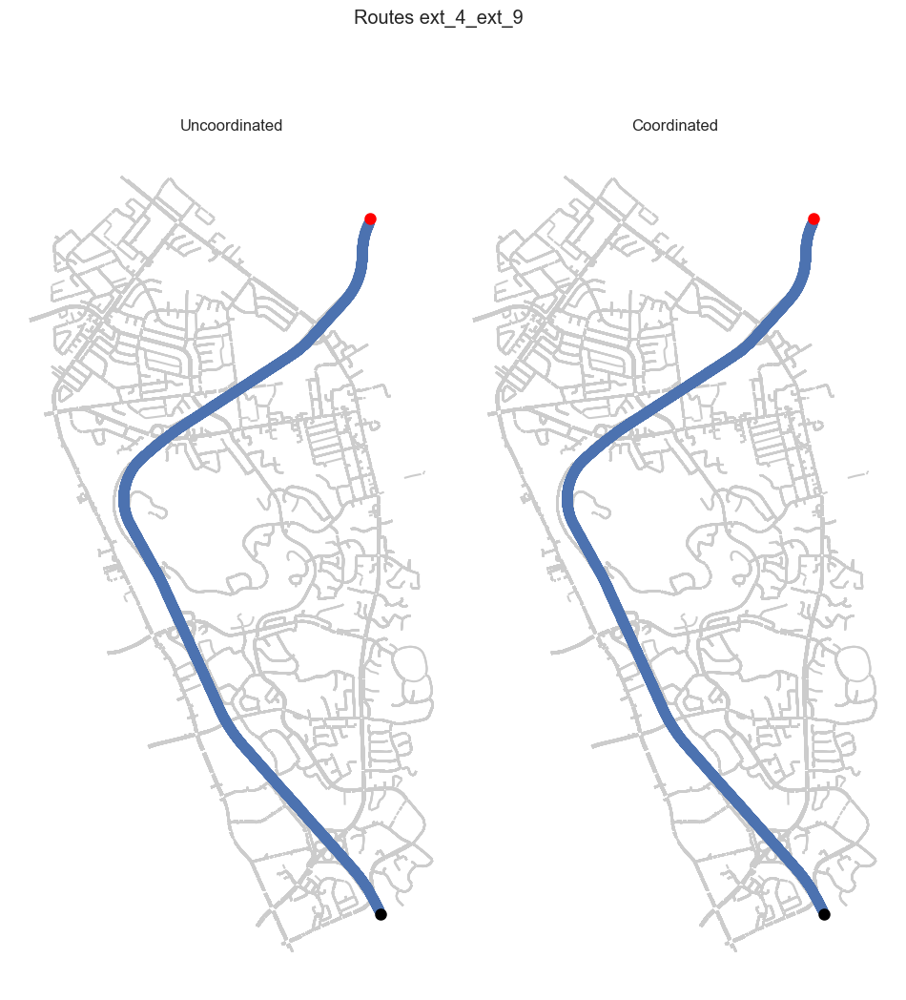

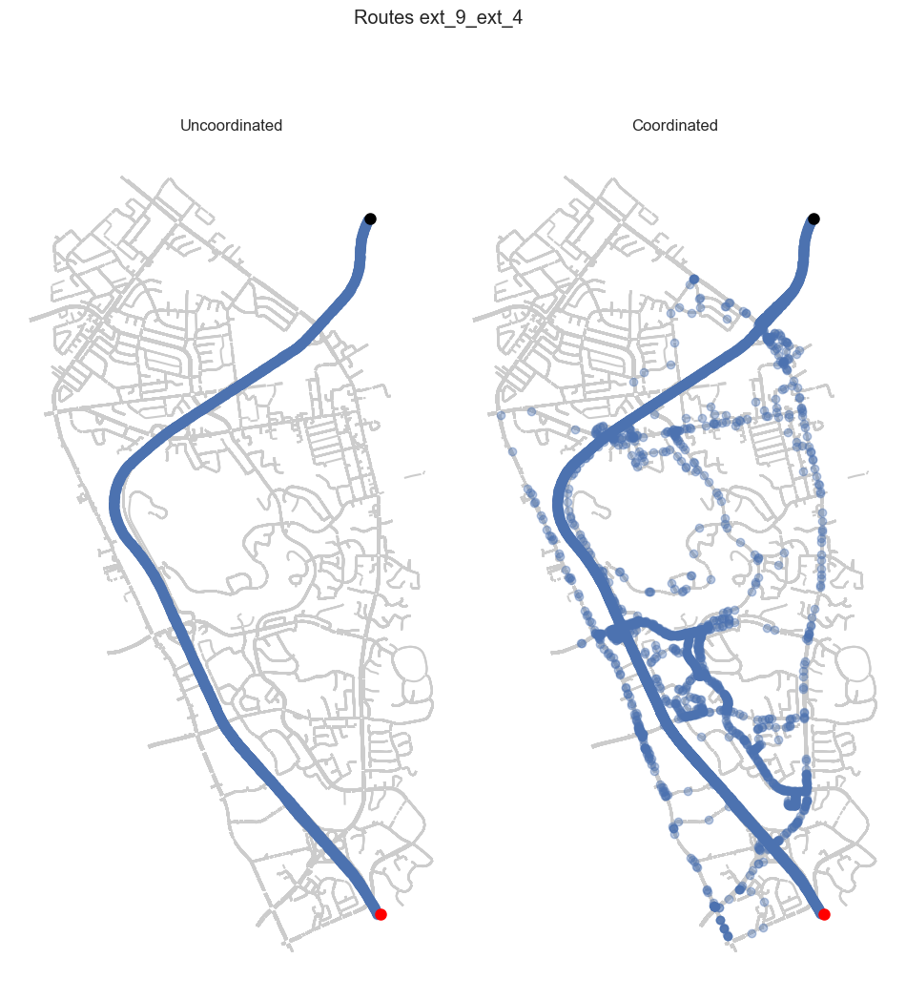

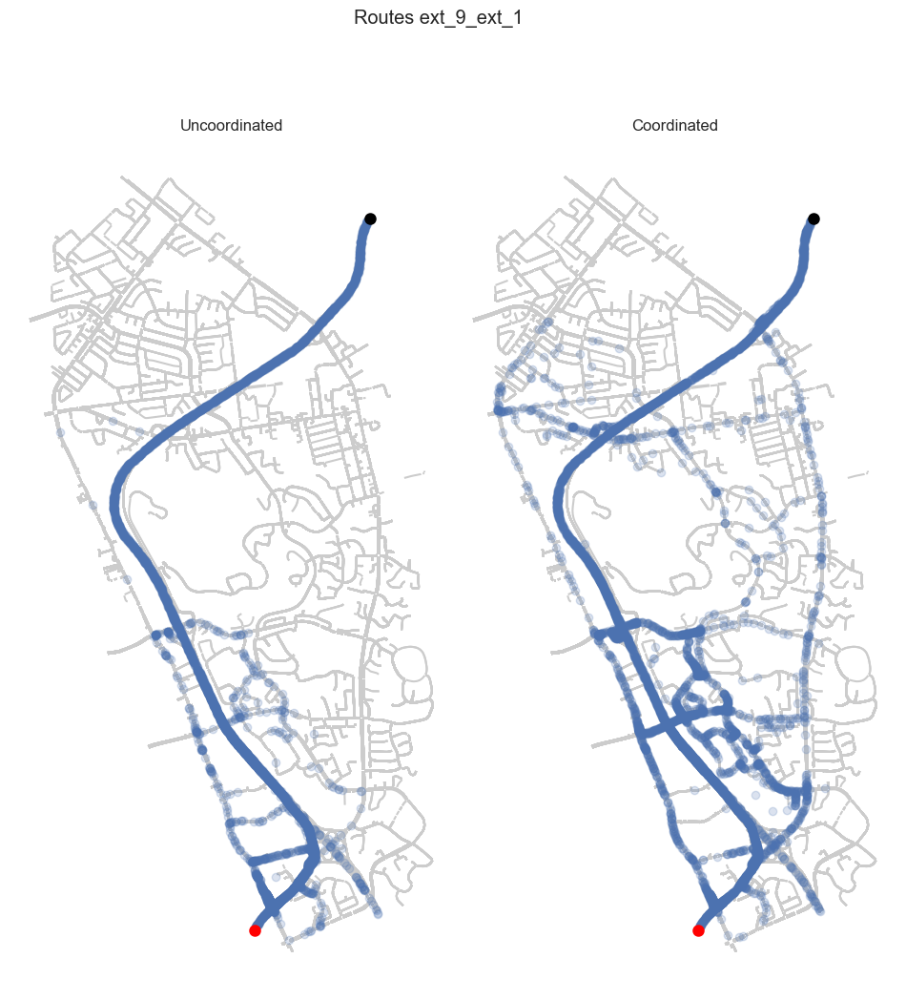

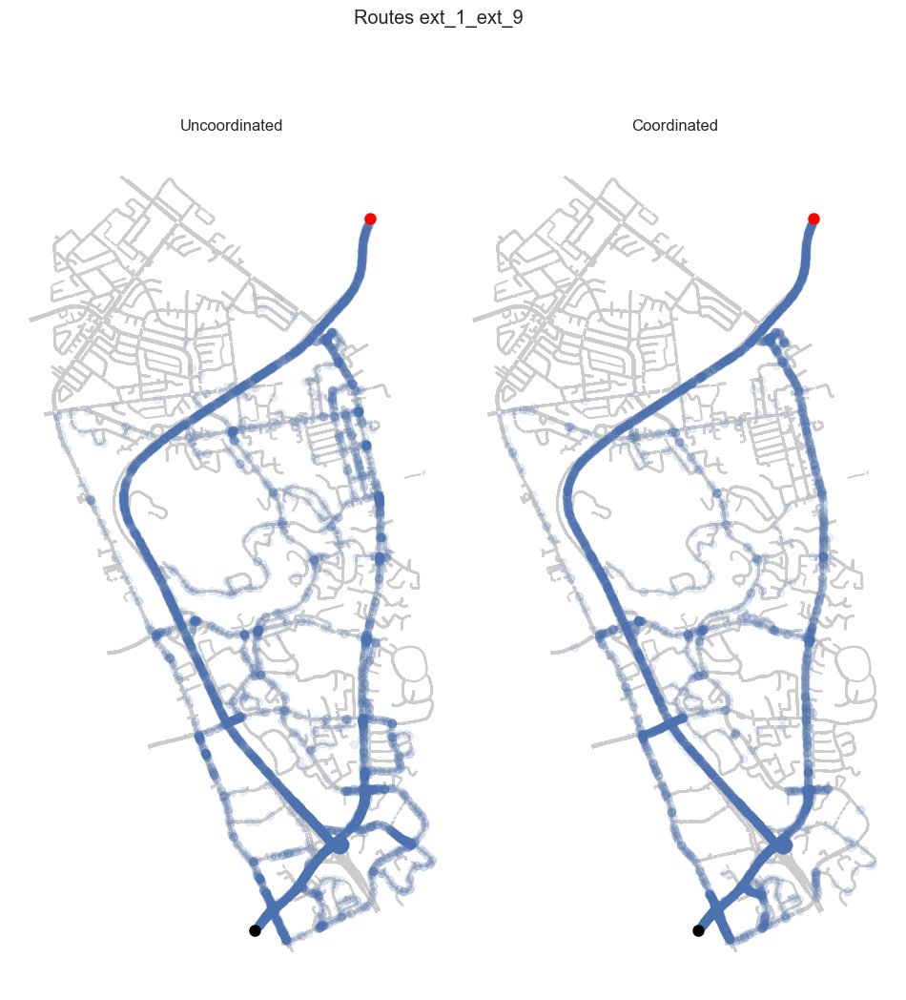

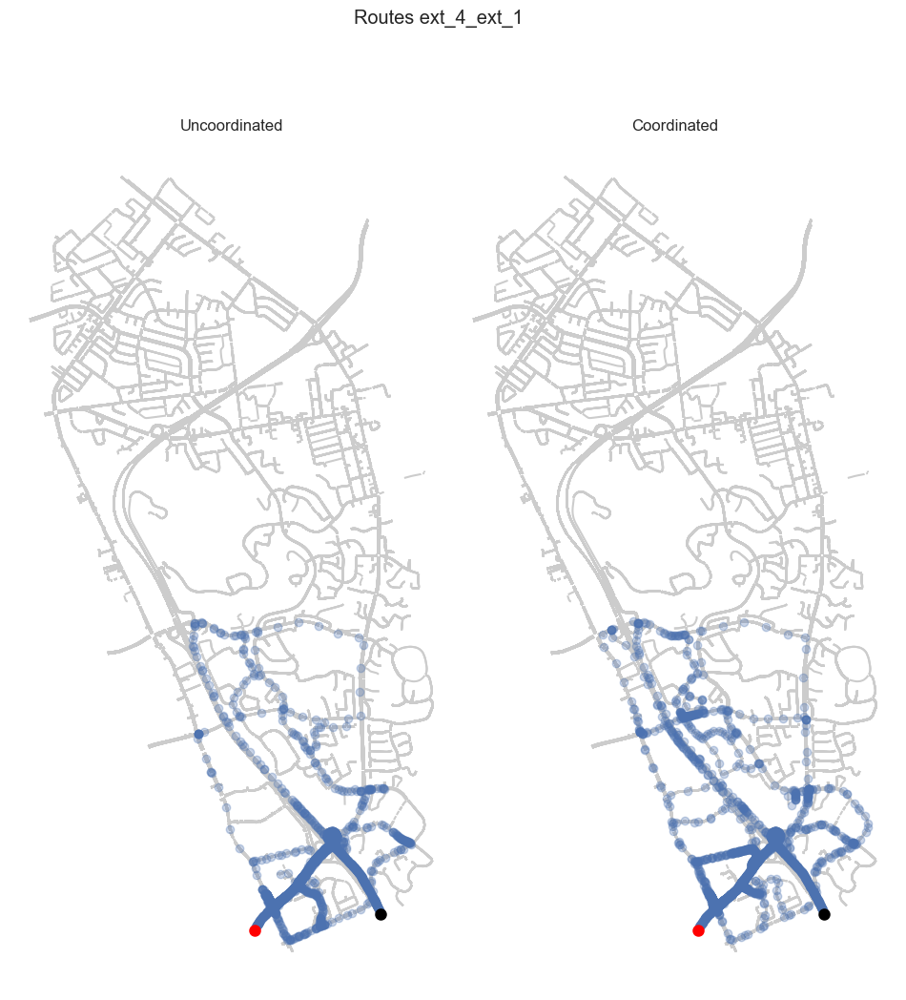

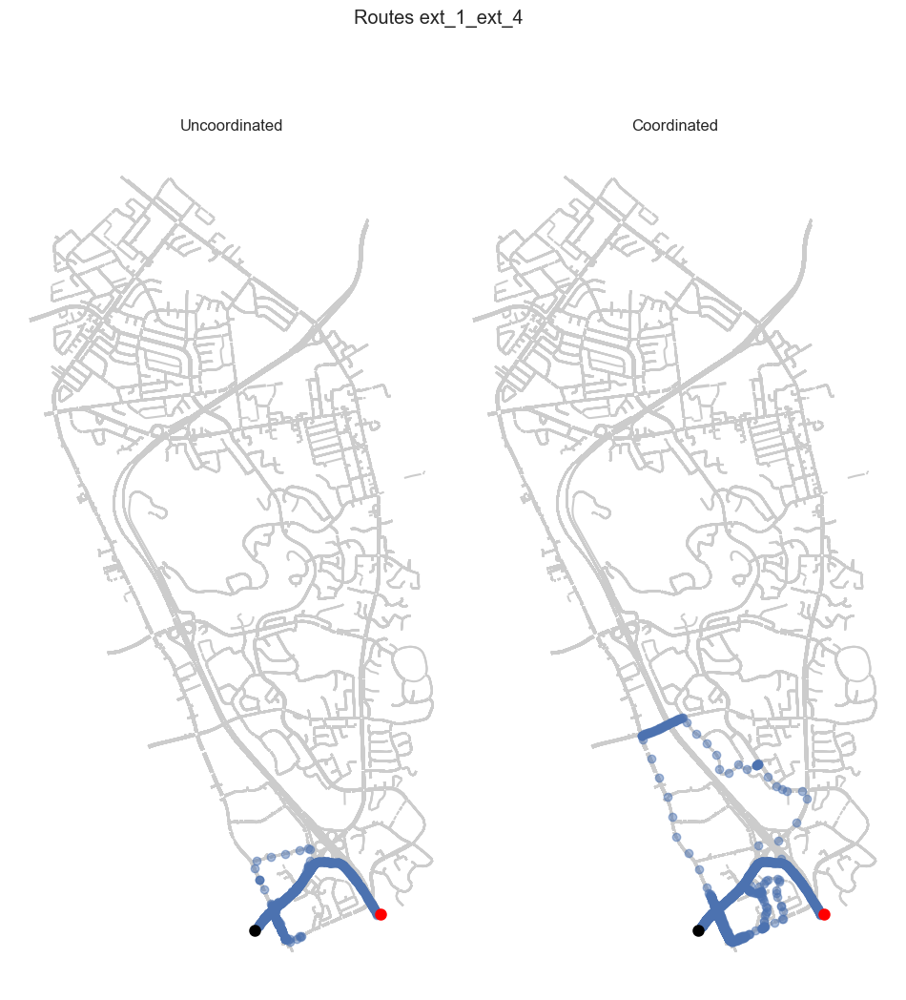

In [ ]:
class ODPlot:
    def __init__(self, origin, destination, sample_every_nth, alpha):
        self.origin = origin
        self.destination = destination
        self.sample_every_nth = sample_every_nth
        self.alpha = alpha
    
    def __repr__(self):
        return f'{self.origin}_{self.destination}'

popular_ods = [
    ODPlot('ext_4', 'ext_9', 10, 0.5),
    ODPlot('ext_9', 'ext_4', 30, 0.4),
    ODPlot('ext_9', 'ext_1', 60, 0.2),
    ODPlot('ext_1', 'ext_9', 50, 0.1),
    ODPlot('ext_4', 'ext_1', 15, 0.3),
    ODPlot('ext_1', 'ext_4', 15, 0.5)
]

def plot_routes(data, ax, type, od):
    ax.set_title(type)
    ax.axis('off')
    data = gpd.GeoDataFrame(data, geometry='geometry').iloc[::od.sample_every_nth, :]
    data.crs = "EPSG:32610"
    data = data.to_crs('EPSG:3857')
    origin = node_data[node_data['eid_x']==od.origin]
    destination = node_data[node_data['eid_x']==od.destination]['geometry_o']

    frame.plot(ax=ax, color='0.8', zorder=0)
    data.plot(ax=ax, lw=1, alpha=od.alpha, zorder=1)
    origin.plot(ax=ax, color='black', lw=3, zorder=2)
    destination.plot(ax=ax, color='red', lw=3, zorder=2)


for i in range(6):
    od = popular_ods[i]
    fig, axs = plt.subplots(1, 2, figsize=(12, 12), squeeze=False)
    plot_routes(dfs_traj_top[f'{str(od)}_uncoordinated'], axs[0][0], uncoordinated_description, od)
    plot_routes(dfs_traj_top[f'{str(od)}_coordinated'], axs[0][1], coordinated_description, od)
    fig.suptitle(f'Routes {od}')
    plt.subplots_adjust(wspace=0)
    plt.savefig(f'{image_path}/routes_{od}.png',
        bbox_inches='tight', pad_inches=0)
    plt.show()


In [ ]:
# fig, axs = plt.subplots(2, 3, figsize=(16, 18))
# fig.suptitle('Routes')
# for i in range(6):
#     ax = axs[i//3][i%3]
#     ax.axis('off')
#         node_geo_city.plot(ax=ax, color='black', lw=2, zorder=1)

# plt.subplots_adjust(wspace=0, hspace=0.1)
# plt.show()

# Emissions

In [ ]:
uncoordinated_emissions_query = pd.read_sql('SELECT * FROM MISYSIEM', uncoordinated_con)
uncoordinated_emissions_df = pd.DataFrame(uncoordinated_emissions_query)

uncoordinated_emissions_df.head()

,did,oid,eid,sid,ent,CO2,CO2_D,NOx,NOx_D,VOC,...,PM,PM_D,CO2_Interurban,CO2_Interurban_D,NOx_Interurban,NOx_Interurban_D,VOC_Interurban,VOC_Interurban_D,PM_Interurban,PM_Interurban_D
0,151642198,151642198,None,0,1,2.749354e+06,0.0,1577.548627,0.0,3830.469273,...,78.739112,0.0,5852.013213,0.0,3.357819,0.0,8.153171,0.0,0.167597,0.0
1,151642198,151642198,None,1,1,7.326504e+05,0.0,481.007896,0.0,1059.753445,...,38.899856,0.0,1559.449725,0.0,1.023827,0.0,2.255690,0.0,0.082799,0.0
2,151642198,151642198,None,2,1,2.016704e+06,0.0,1096.540730,0.0,2770.715828,...,39.839256,0.0,4292.563488,0.0,2.333992,0.0,5.897481,0.0,0.084798,0.0
3,151642198,151642198,None,0,2,4.091769e+06,0.0,2588.799222,0.0,5917.653305,...,148.069969,0.0,8709.349285,0.0,5.510271,0.0,12.595752,0.0,0.315168,0.0
4,151642198,151642198,None,1,2,1.139482e+06,0.0,781.639070,0.0,1694.038238,...,68.443746,0.0,2425.392463,0.0,1.663722,0.0,3.605768,0.0,0.145683,0.0


In [ ]:
coordinated_emissions_query = pd.read_sql('SELECT * FROM MISYSIEM', coordinated_con)
coordinated_emissions_df = pd.DataFrame(coordinated_emissions_query)

coordinated_emissions_df.head()

,did,oid,eid,sid,ent,CO2,CO2_D,NOx,NOx_D,VOC,...,PM,PM_D,CO2_Interurban,CO2_Interurban_D,NOx_Interurban,NOx_Interurban_D,VOC_Interurban,VOC_Interurban_D,PM_Interurban,PM_Interurban_D
0,151642198,151642198,None,0,1,2.712312e+06,0.0,1546.325642,0.0,3690.773125,...,73.111917,0.0,5773.167849,0.0,3.291361,0.0,7.855827,0.0,0.155619,0.0
1,151642198,151642198,None,1,1,6.909020e+05,0.0,451.292610,0.0,929.713416,...,32.977093,0.0,1470.588035,0.0,0.960578,0.0,1.978899,0.0,0.070192,0.0
2,151642198,151642198,None,2,1,2.021410e+06,0.0,1095.033032,0.0,2761.059709,...,40.134825,0.0,4302.579814,0.0,2.330783,0.0,5.876928,0.0,0.085427,0.0
3,151642198,151642198,None,0,2,4.009013e+06,0.0,2468.822826,0.0,5424.977140,...,133.640905,0.0,8533.202553,0.0,5.254900,0.0,11.547088,0.0,0.284455,0.0
4,151642198,151642198,None,1,2,1.046384e+06,0.0,695.598797,0.0,1428.788531,...,57.778409,0.0,2227.233238,0.0,1.480585,0.0,3.041183,0.0,0.122982,0.0


In [ ]:
uncoordinated_emissions_df

,did,oid,eid,sid,ent,CO2,CO2_D,NOx,NOx_D,VOC,...,PM,PM_D,CO2_Interurban,CO2_Interurban_D,NOx_Interurban,NOx_Interurban_D,VOC_Interurban,VOC_Interurban_D,PM_Interurban,PM_Interurban_D
0,151642198,151642198,None,0,1,2.749354e+06,0.0,1577.548627,0.0,3830.469273,...,78.739112,0.0,5852.013213,0.0,3.357819,0.0,8.153171,0.0,0.167597,0.0
1,151642198,151642198,None,1,1,7.326504e+05,0.0,481.007896,0.0,1059.753445,...,38.899856,0.0,1559.449725,0.0,1.023827,0.0,2.255690,0.0,0.082799,0.0
2,151642198,151642198,None,2,1,2.016704e+06,0.0,1096.540730,0.0,2770.715828,...,39.839256,0.0,4292.563488,0.0,2.333992,0.0,5.897481,0.0,0.084798,0.0
3,151642198,151642198,None,0,2,4.091769e+06,0.0,2588.799222,0.0,5917.653305,...,148.069969,0.0,8709.349285,0.0,5.510271,0.0,12.595752,0.0,0.315168,0.0
4,151642198,151642198,None,1,2,1.139482e+06,0.0,781.639070,0.0,1694.038238,...,68.443746,0.0,2425.392463,0.0,1.663722,0.0,3.605768,0.0,0.145683,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
70,151642198,151642198,None,1,24,1.044501e+06,0.0,713.205005,0.0,2462.866146,...,46.008333,0.0,2223.224255,0.0,1.518060,0.0,5.242222,0.0,0.097929,0.0
71,151642198,151642198,None,2,24,2.404059e+06,0.0,1674.123667,0.0,4726.821917,...,64.240091,0.0,5117.049753,0.0,3.563380,0.0,10.061062,0.0,0.136735,0.0
72,151642198,151642198,None,0,0,0.000000e+00,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0
73,151642198,151642198,None,1,0,0.000000e+00,0.0,0.000000,0.0,0.000000,...,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0,0.000000,0.0


In [ ]:
dfs_emissions = {'uncoordinated': uncoordinated_emissions_df, 'coordinated': coordinated_emissions_df}
emissions_columns = {
    'CO2': Column('CO2', 'Carbon Dioxide Emissions', 'g'),
    'NOx': Column('NOx', 'Carbon Dioxide Emissions', 'g'),
    'VOC': Column('VOC', 'Carbon Dioxide Emissions', 'g'),
    'PM': Column('PM', 'Carbon Dioxide Emissions', 'g'),
    'CO2_Interurban': Column('CO2_Interurban', 'Carbon Dioxide Emissions', 'g/km'),
    'NOx_Interurban': Column('NOx_Interurban', 'Carbon Dioxide Emissions', 'g/km'),
    'VOC_Interurban': Column('VOC_Interurban', 'Carbon Dioxide Emissions', 'g/km'),
    'PM_Interurban': Column('PM_Interurban', 'Carbon Dioxide Emissions', 'g/km')
}
emissions_column_names = list(emissions_columns.keys())

def preprocess_emissions(df):
    df = df[(df['sid']==0) & (df['ent']!=0)][emissions_column_names + ['ent']]
    return df

for k, df in dfs_emissions.items():
    dfs_emissions[k] = preprocess_emissions(df)

dfs_emissions['uncoordinated']

,CO2,NOx,VOC,PM,CO2_Interurban,NOx_Interurban,VOC_Interurban,PM_Interurban,ent
0,2.749354e+06,1577.548627,3830.469273,78.739112,5852.013213,3.357819,8.153171,0.167597,1
3,4.091769e+06,2588.799222,5917.653305,148.069969,8709.349285,5.510271,12.595752,0.315168,2
6,4.351431e+06,2675.414109,6499.735363,157.404664,9262.040768,5.694631,13.834716,0.335037,3
9,4.653101e+06,2882.887328,7103.208832,174.058796,9904.145583,6.136239,15.119212,0.370485,4
12,4.648221e+06,2823.557985,7180.013496,175.902314,9893.759767,6.009956,15.282691,0.374409,5
15,5.006726e+06,3351.003661,7665.366152,204.017048,10656.838768,7.132626,16.315766,0.434251,6
18,5.098063e+06,3232.772948,7933.030600,201.008799,10851.250736,6.880972,16.885491,0.427848,7
21,5.492895e+06,3795.134345,8353.266756,248.138640,11691.652585,8.077960,17.779966,0.528164,8
24,5.062705e+06,3346.028357,7690.814258,221.583747,10775.991140,7.122036,16.369933,0.471642,9
27,5.050682e+06,3181.846278,7796.682315,219.282081,10750.398811,6.772574,16.595273,0.466743,10


In [ ]:
dfs_emissions['coordinated']

,CO2,NOx,VOC,PM,CO2_Interurban,NOx_Interurban,VOC_Interurban,PM_Interurban,ent
0,2.712312e+06,1546.325642,3690.773125,73.111917,5773.167849,3.291361,7.855827,0.155619,1
3,4.009013e+06,2468.822826,5424.977140,133.640905,8533.202553,5.254900,11.547088,0.284455,2
6,4.053613e+06,2427.126234,5491.786177,124.469128,8628.133256,5.166149,11.689292,0.264933,3
9,4.276468e+06,2516.474714,5843.490160,142.075869,9102.482326,5.356328,12.437895,0.302409,4
12,4.200471e+06,2492.464015,5780.491406,138.224390,8940.722247,5.305221,12.303802,0.294211,5
15,4.518501e+06,3006.842890,6100.332533,176.440783,9617.649459,6.400079,12.984585,0.375555,6
18,4.547582e+06,2830.288726,6298.273710,164.302493,9679.549202,6.024282,13.405904,0.349719,7
21,4.823146e+06,3239.369087,6880.225494,193.127757,10266.087831,6.895012,14.644591,0.411073,8
24,4.573608e+06,2951.529437,6595.231950,179.969451,9734.945667,6.282344,14.037981,0.383066,9
27,4.612293e+06,2830.316691,6549.942741,180.291731,9817.286976,6.024342,13.941583,0.383752,10


In [ ]:
emissions_df = dfs_emissions['uncoordinated'][emissions_column_names].join(
    dfs_emissions['coordinated'][emissions_column_names], lsuffix='_uncoordinated', rsuffix='_coordinated')

for metric_name in emissions_column_names:
    emissions_df[f'{metric_name}_ratio'] = emissions_df[f'{metric_name}_coordinated'] / emissions_df[f'{metric_name}_uncoordinated']

emissions_df

,CO2_uncoordinated,NOx_uncoordinated,VOC_uncoordinated,PM_uncoordinated,CO2_Interurban_uncoordinated,NOx_Interurban_uncoordinated,VOC_Interurban_uncoordinated,PM_Interurban_uncoordinated,CO2_coordinated,NOx_coordinated,...,VOC_Interurban_coordinated,PM_Interurban_coordinated,CO2_ratio,NOx_ratio,VOC_ratio,PM_ratio,CO2_Interurban_ratio,NOx_Interurban_ratio,VOC_Interurban_ratio,PM_Interurban_ratio
0,2.749354e+06,1577.548627,3830.469273,78.739112,5852.013213,3.357819,8.153171,0.167597,2.712312e+06,1546.325642,...,7.855827,0.155619,0.986527,0.980208,0.963530,0.928534,0.986527,0.980208,0.963530,0.928534
3,4.091769e+06,2588.799222,5917.653305,148.069969,8709.349285,5.510271,12.595752,0.315168,4.009013e+06,2468.822826,...,11.547088,0.284455,0.979775,0.953656,0.916745,0.902552,0.979775,0.953656,0.916745,0.902552
6,4.351431e+06,2675.414109,6499.735363,157.404664,9262.040768,5.694631,13.834716,0.335037,4.053613e+06,2427.126234,...,11.689292,0.264933,0.931559,0.907196,0.844925,0.790759,0.931559,0.907196,0.844925,0.790759
9,4.653101e+06,2882.887328,7103.208832,174.058796,9904.145583,6.136239,15.119212,0.370485,4.276468e+06,2516.474714,...,12.437895,0.302409,0.919058,0.872901,0.822655,0.816252,0.919058,0.872901,0.822655,0.816252
12,4.648221e+06,2823.557985,7180.013496,175.902314,9893.759767,6.009956,15.282691,0.374409,4.200471e+06,2492.464015,...,12.303802,0.294211,0.903673,0.882739,0.805081,0.785802,0.903673,0.882739,0.805081,0.785802
15,5.006726e+06,3351.003661,7665.366152,204.017048,10656.838768,7.132626,16.315766,0.434251,4.518501e+06,3006.842890,...,12.984585,0.375555,0.902486,0.897296,0.795831,0.864834,0.902486,0.897296,0.795831,0.864834
18,5.098063e+06,3232.772948,7933.030600,201.008799,10851.250736,6.880972,16.885491,0.427848,4.547582e+06,2830.288726,...,13.405904,0.349719,0.892022,0.875499,0.793930,0.817390,0.892022,0.875499,0.793930,0.817390
21,5.492895e+06,3795.134345,8353.266756,248.138640,11691.652585,8.077960,17.779966,0.528164,4.823146e+06,3239.369087,...,14.644591,0.411073,0.878070,0.853558,0.823657,0.778306,0.878070,0.853558,0.823657,0.778306
24,5.062705e+06,3346.028357,7690.814258,221.583747,10775.991140,7.122036,16.369933,0.471642,4.573608e+06,2951.529437,...,14.037981,0.383066,0.903392,0.882099,0.857547,0.812196,0.903392,0.882099,0.857547,0.812196
27,5.050682e+06,3181.846278,7796.682315,219.282081,10750.398811,6.772574,16.595273,0.466743,4.612293e+06,2830.316691,...,13.941583,0.383752,0.913202,0.889520,0.840094,0.822191,0.913202,0.889520,0.840094,0.822191


In [ ]:
emissions_columns = np.reshape(list(emissions_columns.values()), (2, 4)).transpose()

In [ ]:
emissions_columns

array([[Column(CO2, Carbon Dioxide Emissions, g),
        Column(CO2_Interurban, Carbon Dioxide Emissions, g/km)],
       [Column(NOx, Carbon Dioxide Emissions, g),
        Column(NOx_Interurban, Carbon Dioxide Emissions, g/km)],
       [Column(VOC, Carbon Dioxide Emissions, g),
        Column(VOC_Interurban, Carbon Dioxide Emissions, g/km)],
       [Column(PM, Carbon Dioxide Emissions, g),
        Column(PM_Interurban, Carbon Dioxide Emissions, g/km)]],
      dtype=object)

Not using all 8 because `interurban` is proportional

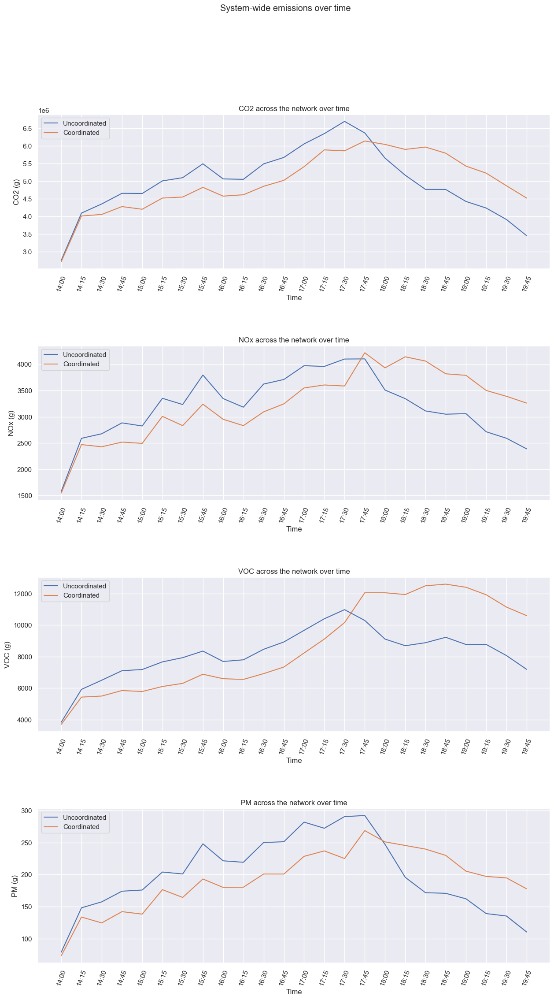

In [ ]:
fig, axs = plt.subplots(4, figsize=(15, 25))
fig.suptitle('System-wide emissions over time')
for i in range(4):
    # for j in range(2):
    ax, metric = axs[i], emissions_columns[i][0]
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_uncoordinated'], label=uncoordinated_description)
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_coordinated'], label=coordinated_description)
    ax.set_title(f'{metric.name} across the network over time')
    ax.set_xlabel('Time')
    ax.set_ylabel(f'{metric.name} ({metric.unit})')
    ax.legend(loc="upper left")
    ax.tick_params('x', labelrotation=70) 

plt.subplots_adjust(wspace=0.3, hspace=0.5)
plt.show()

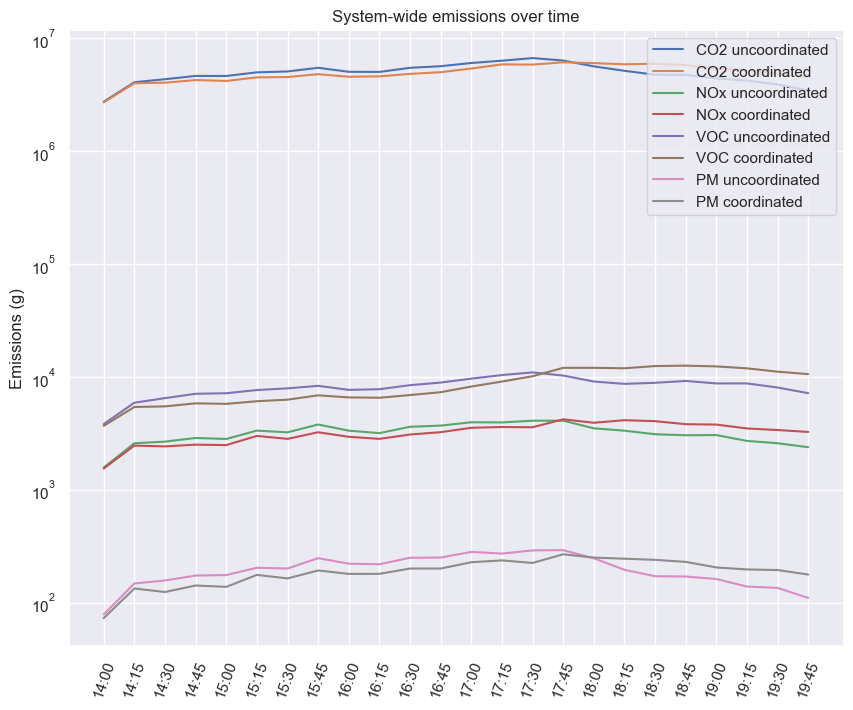

In [ ]:
# dt = 0.01
# x = np.arange(-50.0, 50.0, dt)
# y = np.arange(0, 100.0, dt)
# # plt.subplot(312)
# plt.plot(y, x)
# plt.yscale('symlog')
# plt.ylabel('symlogy')



fig = plt.figure(figsize=(10, 8))
ax = plt.axes()
plt.title('System-wide emissions over time')

for i in range(4):
    metric = emissions_columns[i][0]
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_uncoordinated'], label=f'{metric.name} uncoordinated')
    ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_coordinated'], label=f'{metric.name} coordinated')

ax.tick_params('x', labelrotation=70)
plt.legend(loc='upper right')
plt.yscale('symlog')
plt.ylabel('Emissions (g)')
plt.savefig(f'{image_path}/emissions.png',
    bbox_inches='tight', pad_inches=0)
plt.show()


# fig, axs = plt.subplots(4, figsize=(15, 25))
# fig.suptitle('System-wide emissions over time')
# for i in range(4):
#     # for j in range(2):
#     ax, metric = axs[i], emissions_columns[i][0]
#     ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_uncoordinated'], label=uncoordinated_description)
#     ax.plot(TIME_INTERVALS_STRING, emissions_df[f'{metric.name}_coordinated'], label=coordinated_description)
#     ax.set_title(f'{metric.name} across the network over time')
#     ax.set_xlabel('Time')
#     ax.set_ylabel(f'{metric.name} ({metric.unit})')
#     ax.legend(loc="upper left")
#     ax.tick_params('x', labelrotation=70) 

# plt.subplots_adjust(wspace=0.3, hspace=0.5)
# plt.show()

<a id='hcm'></a>
# HCM Trajectory Analysis

* Longitudinal analysis computes for each vehicle in a link during each time step measures, cumulating them for all the time steps required to traverse the link, and then aggregating for all the vehicles that exit from the link during a statistics interval
* Spatial analysis computes for each link and for each lane during each time step measures that involve all the vehicles present, and then aggregating for all the time steps during a statistics interval

In [ ]:
uncoordinated_hcm_query = pd.read_sql('SELECT * FROM HCMMIAPPROACH', uncoordinated_con)
uncoordinated_hcm_df = pd.DataFrame(uncoordinated_hcm_query)

uncoordinated_hcm_df.head()

,did,oid,eid,sid,ent,density,density_D,los,los_D,queue_delay,...,queued_vehicles,queued_vehicles_D,segment_delay,segment_delay_D,stopped_delay,stopped_delay_D,nbstops,nbstops_D,slow_vehicles,slow_vehicles_D
0,151642198,248,248,0,1,0.780573,-1.0,1.0,-1.0,6.020650,...,1.822222,-1.0,7.703775,3.238408,4.556952,1.385575,0.647367,0.304713,1.0,-1.0
1,151642198,257,257,0,1,32.908216,-1.0,3.0,-1.0,20.352714,...,50.525714,-1.0,21.946461,14.480430,18.148699,14.096548,0.186316,0.123443,53.0,-1.0
2,151642198,757,757,0,1,0.000000,-1.0,1.0,-1.0,-1.000000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
3,151642198,761,761,0,1,0.000000,-1.0,1.0,-1.0,-1.000000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
4,151642198,302,302,0,1,0.000000,-1.0,1.0,-1.0,-1.000000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0


In [ ]:
coordinated_hcm_query = pd.read_sql('SELECT * FROM HCMMIAPPROACH', coordinated_con)
coordinated_hcm_df = pd.DataFrame(coordinated_hcm_query)

coordinated_hcm_df.head()

,did,oid,eid,sid,ent,density,density_D,los,los_D,queue_delay,...,queued_vehicles,queued_vehicles_D,segment_delay,segment_delay_D,stopped_delay,stopped_delay_D,nbstops,nbstops_D,slow_vehicles,slow_vehicles_D
0,151642198,248,248,0,1,0.000000,-1.0,1.0,-1.0,-1.00000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
1,151642198,257,257,0,1,33.050236,-1.0,2.0,-1.0,18.39801,...,46.649841,-1.0,19.744219,14.222321,16.312359,13.524148,0.168761,0.120598,48.0,-1.0
2,151642198,761,761,0,1,0.000000,-1.0,1.0,-1.0,-1.00000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
3,151642198,757,757,0,1,0.000000,-1.0,1.0,-1.0,-1.00000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0
4,151642198,302,302,0,1,0.000000,-1.0,1.0,-1.0,-1.00000,...,0.000000,-1.0,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.0,-1.0


In [ ]:
dfs_hcm = {'uncoordinated': uncoordinated_hcm_df, 'coordinated': coordinated_hcm_df}
hcm_columns = {
    'density': Column('density', 'Density of vehicles', 'PCU/km'),
    'los': Column('los', 'Level of service', None),
    'queue_delay': Column('queue_delay', 'Queue delay', 's/veh'),
    'queue_length': Column('queue_length', 'Average queue length', 'veh'),
    'queued_vehicles': Column('queued_vehicles', 'Percent queued vehicles', '%'),
    'segment_delay': Column('segment_delay', 'Segment delay', 's/veh'),
    'stopped_delay': Column('stopped_delay', 'Stopped delay', 's/veh'),
    'nbstops': Column('nbstops', 'Number of stops', None),
    'slow_vehicles': Column('slow_vehicles', 'Percent slow vehicles', '%')
}
hcm_column_names = list(hcm_columns.keys())
group_cols = ['ent', 'eid']

def preprocess_hcm(df):
    for k in hcm_column_names:
        df[k] = df[k].astype(float)
    df['density'] = df['density'] * 0.621      # converting to km
    df['los'] = df['los'].astype(int)
    df = df[hcm_column_names + group_cols]
    return df[df['ent']!=0]

for k, df in dfs_hcm.items():
    dfs_hcm[k] = preprocess_hcm(df)

dfs_hcm['uncoordinated']

,density,los,queue_delay,queue_length,queued_vehicles,segment_delay,stopped_delay,nbstops,slow_vehicles,ent,eid
0,0.484736,1,6.020650,0.023111,1.822222,7.703775,4.556952,0.647367,1.0,1,248
1,20.436002,3,20.352714,1.275556,50.525714,21.946461,18.148699,0.186316,53.0,1,257
2,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,757
3,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,761
4,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,302
...,...,...,...,...,...,...,...,...,...,...,...
13411,36.661508,4,54.143147,6.624889,75.398818,56.364769,51.262892,0.608747,74.0,24,56150
13412,77.548644,5,65.907973,3.723556,84.882565,66.929549,63.708786,0.165673,84.0,24,56433
13413,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,56544
13414,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,62332


In [ ]:
dfs_hcm['coordinated']

,density,los,queue_delay,queue_length,queued_vehicles,segment_delay,stopped_delay,nbstops,slow_vehicles,ent,eid
0,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,248
1,20.524197,2,18.398010,1.280889,46.649841,19.744219,16.312359,0.168761,48.0,1,257
2,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,761
3,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,757
4,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,302
...,...,...,...,...,...,...,...,...,...,...,...
13411,36.192377,3,21.012780,5.320889,68.509613,23.316151,19.146847,0.431019,68.0,24,56150
13412,71.802882,5,59.458151,3.450667,91.656578,60.465783,56.936214,0.191616,91.0,24,56433
13413,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,56544
13414,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,62332


Not sure why this has more rows than the originals

In [ ]:
hcm_df = dfs_hcm['uncoordinated'].merge(dfs_hcm['coordinated'], on=group_cols, how='left', suffixes=['_uncoordinated', '_coordinated']).dropna()
hcm_df

,density_uncoordinated,los_uncoordinated,queue_delay_uncoordinated,queue_length_uncoordinated,queued_vehicles_uncoordinated,segment_delay_uncoordinated,stopped_delay_uncoordinated,nbstops_uncoordinated,slow_vehicles_uncoordinated,ent,eid,density_coordinated,los_coordinated,queue_delay_coordinated,queue_length_coordinated,queued_vehicles_coordinated,segment_delay_coordinated,stopped_delay_coordinated,nbstops_coordinated,slow_vehicles_coordinated
0,0.484736,1,6.020650,0.023111,1.822222,7.703775,4.556952,0.647367,1.0,1,248,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
1,20.436002,3,20.352714,1.275556,50.525714,21.946461,18.148699,0.186316,53.0,1,257,20.524197,2,18.398010,1.280889,46.649841,19.744219,16.312359,0.168761,48.0
2,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,757,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
3,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,761,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
4,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,1,302,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13459,36.661508,4,54.143147,6.624889,75.398818,56.364769,51.262892,0.608747,74.0,24,56150,36.192377,3,21.012780,5.320889,68.509613,23.316151,19.146847,0.431019,68.0
13460,77.548644,5,65.907973,3.723556,84.882565,66.929549,63.708786,0.165673,84.0,24,56433,71.802882,5,59.458151,3.450667,91.656578,60.465783,56.936214,0.191616,91.0
13461,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,56544,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0
13462,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0,24,62332,0.000000,1,-1.000000,0.000000,0.000000,-1.000000,-1.000000,-1.000000,0.0


In [ ]:
hcm_compare_cols = np.reshape(hcm_column_names.copy(), (3, 3))
hcm_compare_cols

array([['density', 'los', 'queue_delay'],
       ['queue_length', 'queued_vehicles', 'segment_delay'],
       ['stopped_delay', 'nbstops', 'slow_vehicles']], dtype='<U15')

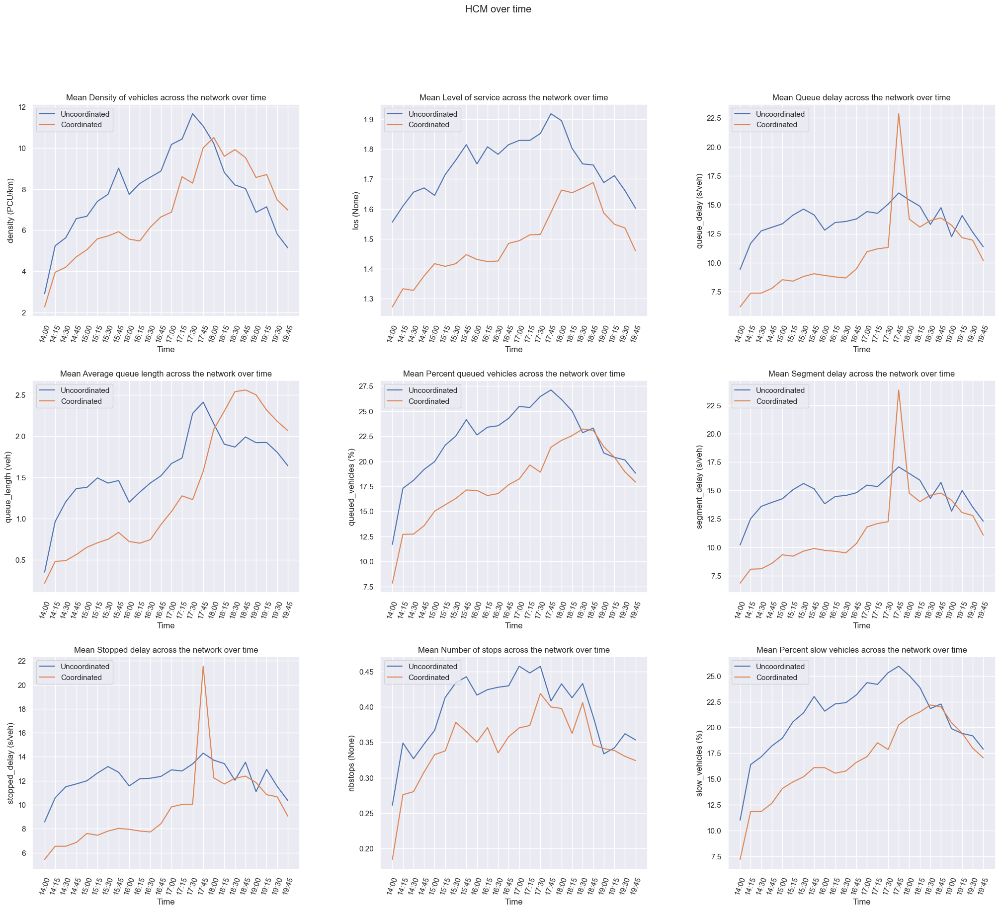

In [ ]:
fig, axs = plt.subplots(3, 3, figsize=(25, 20))
fig.suptitle('HCM over time')
for i in range(3):
    for j in range(3):
        ax, metric = axs[i][j], hcm_columns[hcm_compare_cols[i][j]]
        # if metric.name == 'los':
        #     plt.hist([hcm_df[f'{metric.name}_uncoordinated'], hcm_df[f'{metric.name}_uncoordinated']], 
        #         label=['uncoordinated', 'coordinated'])
        #     ax.legend(loc="upper left")
        # else:
        metric_data = hcm_df[['ent', f'{metric.name}_uncoordinated', f'{metric.name}_coordinated']].groupby('ent').mean()
        ax.plot(TIME_INTERVALS_STRING, metric_data[f'{metric.name}_uncoordinated'], label=uncoordinated_description)
        ax.plot(TIME_INTERVALS_STRING, metric_data[f'{metric.name}_coordinated'], label=coordinated_description)
        ax.set_title(f'Mean {metric.desc} across the network over time')
        ax.set_xlabel('Time')
        ax.set_ylabel(f'{metric.name} ({metric.unit})')
        ax.legend(loc="upper left")
        ax.tick_params('x', labelrotation=70) 

plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.show()

<a id='sys-hcm-patch'></a>
# Patched sys/hcm graphs

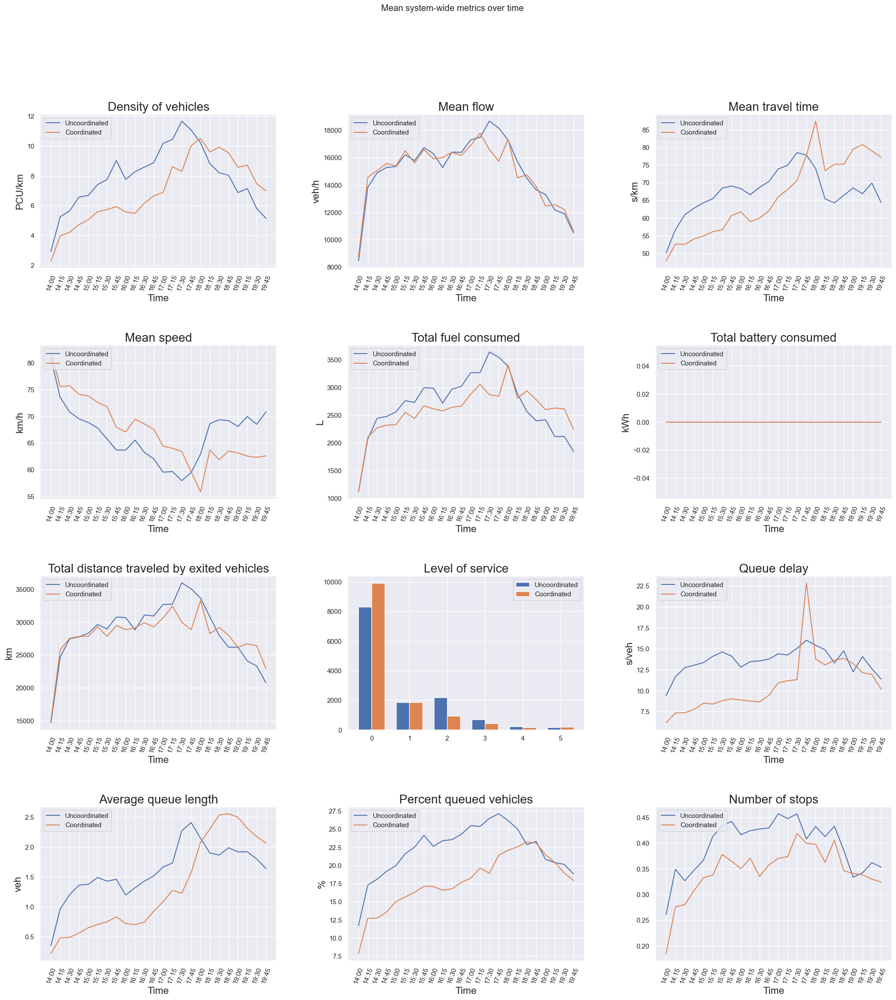

In [ ]:
from matplotlib import rcParams as rc

categorical_labels = {
    'los': {
        1: 'A',
        2: 'B',
        3: 'C',
        4: 'D',
        5: 'E',
        6: 'F'
    }
}

def sys_line_plot(metric, data, ax):
    data_uncoordinated, data_coordinated = data
    ax.plot(TIME_INTERVALS_STRING, data_uncoordinated, label=uncoordinated_description)
    ax.plot(TIME_INTERVALS_STRING, data_coordinated, label=coordinated_description)
    ax.set_title(f'{metric.desc}', size=20)
    ax.set_xlabel('Time', size=16)
    ax.set_ylabel(metric.unit, size=16)
    ax.legend(loc='upper left')
    ax.tick_params('x', labelrotation=70)

def sys_bar_plot(metric, data, ax):
    data_uncoordinated, data_coordinated = data
    labels = [categorical_labels[metric.name][label] for label in sorted(data_uncoordinated.unique())]
    width = 0.35
    rects_uncoordinated = ax.bar(
        np.arange(len(labels)) - width/2, data_uncoordinated.value_counts().sort_index(), width, label=uncoordinated_description)
    rects_coordinated = ax.bar(
        np.arange(len(labels)) + width/2, data_coordinated.value_counts().sort_index(), width, label=coordinated_description)
    ax.set_title(f'{metric.desc}', size=20)
    ax.set_ylabel(metric.unit, size=16)
    ax.legend(loc='upper right')


fig, axs = plt.subplots(4, 3, figsize=(25, 25))
fig.suptitle('Mean system-wide metrics over time')

sys_hcm_columns = [
    hcm_columns['density'],
    sys_columns['flow'],
    sys_columns['ttime'],
    sys_columns['speed'],
    sys_columns['fuelc'],
    sys_columns['batteryc'],
    sys_columns['travel'],
    hcm_columns['los'],
    hcm_columns['queue_delay'],
    hcm_columns['queue_length'],
    hcm_columns['queued_vehicles'],
    hcm_columns['nbstops'],
    # hcm_columns['slow_vehicles']
]

sys_hcm_columns = np.reshape(sys_hcm_columns, (4, 3))

for i in range(4):
    for j in range(3):
        ax, metric = axs[i][j], sys_hcm_columns[i][j]
        if metric.name == 'los':
            data_uncoordinated = hcm_df[f'{metric.name}_uncoordinated']
            data_coordinated = hcm_df[f'{metric.name}_coordinated']
            sys_bar_plot(metric, (data_uncoordinated, data_coordinated), ax)
        elif metric.name in hcm_columns:
            data = hcm_df[['ent', f'{metric.name}_uncoordinated', \
                f'{metric.name}_coordinated']].groupby('ent').mean()
            data_uncoordinated = data[f'{metric.name}_uncoordinated']
            data_coordinated = data[f'{metric.name}_coordinated']
            sys_line_plot(metric, (data_uncoordinated, data_coordinated), ax)
        else:
            data_uncoordinated = sys_df[f'{metric.name}_uncoordinated']
            data_coordinated = sys_df[f'{metric.name}_coordinated']
            sys_line_plot(metric, (data_uncoordinated, data_coordinated), ax)

plt.subplots_adjust(wspace=0.3, hspace=0.5)
plt.savefig(f'{image_path}/sys_hcm.png',
    bbox_inches='tight', pad_inches=0)
plt.show()

<a id='rgap'></a>
# RGap

I'm not sure exactly how this works, but I'm assuming that data is collected every minute (due to 361 rows in 6 hours).

In [ ]:
uncoordinated_rgap_query = pd.read_sql('SELECT * FROM RGap', uncoordinated_con)
uncoordinated_rgap_df = pd.DataFrame(uncoordinated_rgap_query)

uncoordinated_rgap_df.head()

,did,oid,eid,sid,ent,rgapInstantaneous,rgapInstantaneous_D,rgapExperienced,rgapExperienced_D
0,151642198,151642198,None,0,1,0.015156,-1.0,0.028925,-1.0
1,151642198,151642198,None,0,2,0.010300,-1.0,0.013293,-1.0
2,151642198,151642198,None,0,3,0.018570,-1.0,0.028244,-1.0
3,151642198,151642198,None,0,4,0.010625,-1.0,0.016442,-1.0
4,151642198,151642198,None,0,5,0.012213,-1.0,0.010976,-1.0


In [ ]:
coordinated_rgap_query = pd.read_sql('SELECT * FROM RGap', coordinated_con)
coordinated_rgap_df = pd.DataFrame(coordinated_rgap_query)

coordinated_rgap_df.head()

,did,oid,eid,sid,ent,rgapInstantaneous,rgapInstantaneous_D,rgapExperienced,rgapExperienced_D
0,151642198,151642198,None,0,1,0.012938,-1.0,0.012101,-1.0
1,151642198,151642198,None,0,2,0.014063,-1.0,0.013460,-1.0
2,151642198,151642198,None,0,3,0.012677,-1.0,0.018196,-1.0
3,151642198,151642198,None,0,4,0.007353,-1.0,0.011982,-1.0
4,151642198,151642198,None,0,5,0.006526,-1.0,0.003027,-1.0


In [ ]:
dfs_rgap= {'uncoordinated': uncoordinated_rgap_df, 'coordinated': coordinated_rgap_df}
rgap_columns = {
    'rgapInstantaneous': Column('rgapInstantaneous', 'Instantaneous relative gap', None),
    'rgapExperienced': Column('rgapExperienced', 'Experienced relative gap', None)
}

for k, df in dfs_rgap.items():
    df = df[df['ent']!=0]
    dfs_rgap[k] = df[rgap_columns.keys()]

rgap_df = dfs_rgap['uncoordinated'].join(dfs_rgap['coordinated'], lsuffix='_uncoordinated', rsuffix='_coordinated')
rgap_df

,rgapInstantaneous_uncoordinated,rgapExperienced_uncoordinated,rgapInstantaneous_coordinated,rgapExperienced_coordinated
0,0.015156,0.028925,0.012938,0.012101
1,0.010300,0.013293,0.014063,0.013460
2,0.018570,0.028244,0.012677,0.018196
3,0.010625,0.016442,0.007353,0.011982
4,0.012213,0.010976,0.006526,0.003027
...,...,...,...,...
355,0.040149,0.030278,0.808581,0.081233
356,0.098089,0.089092,0.483354,0.086924
357,0.354563,0.321103,0.131119,0.280918
358,0.090418,0.076703,0.228681,0.164343


In [ ]:
metric_name, metric_units = 'Relative gap', 's'
uncoordinated_rgap = postprocessing_plot_util.process_network_delay_time_data(
    uncoordinated_simulation_results_database, TIME_INTERVALS)

coordinated_rgap = postprocessing_plot_util.process_network_delay_time_data(
    coordinated_simulation_results_database, TIME_INTERVALS)

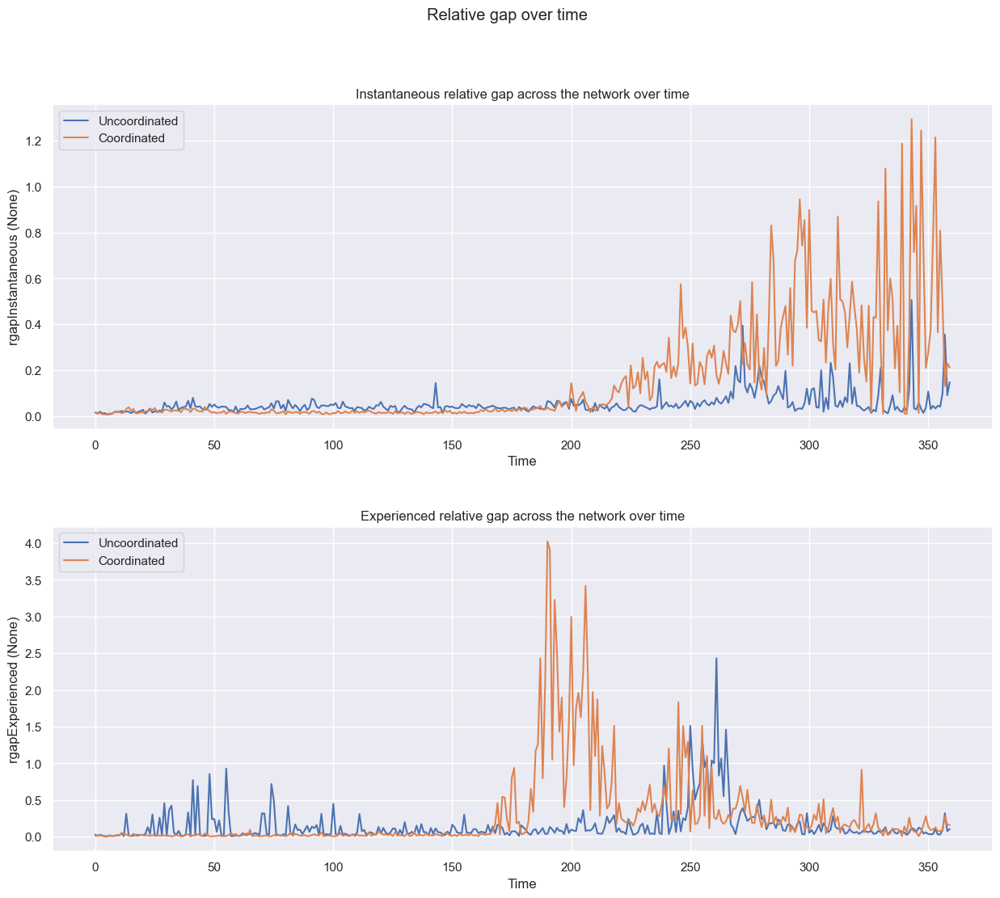

In [ ]:
fig, axs = plt.subplots(2, figsize=(15, 12))
fig.suptitle('Relative gap over time')
for i in range(2):
    ax, metric = axs[i], rgap_columns[list(rgap_columns.keys())[i]]
    ax.plot(rgap_df[f'{metric.name}_uncoordinated'], label=uncoordinated_description)
    ax.plot(rgap_df[f'{metric.name}_coordinated'], label=coordinated_description)
    ax.set_title(f'{metric.desc} across the network over time')
    ax.set_xlabel('Time')
    ax.set_ylabel(f'{metric.name} ({metric.unit})')
    ax.legend(loc="upper left")
    # ax.tick_params('x', labelrotation=70) 

plt.subplots_adjust(wspace=0.3, hspace=0.3)
plt.savefig(f'{image_path}/rgap.png',
    bbox_inches='tight', pad_inches=0)
plt.show()


# plt.xlabel("Timestep")
# plt.ylabel(f"{metric_name} ({metric_units})")
# plt.plot(TIME_INTERVALS_STRING, uncoordinated_simulated_metric_values, label=uncoordinated_description)
# plt.plot(TIME_INTERVALS_STRING, coordinated_simulated_metric_values, label=coordinated_description)
# plt.legend(loc="upper left")
# plt.xticks(rotation=70)
# plt.show()